In [ ]:
# importing necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
import geopandas as gpd
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# **Working with the Calls table**

In [ ]:
# Loading the initial file

calls = pd.read_excel('/content/Calls (Done).xlsx')
calls

,Id,Call Start Time,Call Owner Name,CONTACTID,Call Type,Call Duration (in seconds),Call Status,Dialled Number,Outgoing Call Status,Scheduled in CRM,Tag
0,5805028000000805001,30.06.2023 08:43,John Doe,NaN,Inbound,171.0,Received,NaN,NaN,NaN,NaN
1,5805028000000768006,30.06.2023 08:46,John Doe,NaN,Outbound,28.0,Attended Dialled,NaN,Completed,0.0,NaN
2,5805028000000764027,30.06.2023 08:59,John Doe,NaN,Outbound,24.0,Attended Dialled,NaN,Completed,0.0,NaN
3,5805028000000787003,30.06.2023 09:20,John Doe,5.805028e+18,Outbound,6.0,Attended Dialled,NaN,Completed,0.0,NaN
4,5805028000000768019,30.06.2023 09:30,John Doe,5.805028e+18,Outbound,11.0,Attended Dialled,NaN,Completed,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...
95869,5805028000056889515,21.06.2024 15:30,Ulysses Adams,5.805028e+18,Outbound,6.0,Attended Dialled,NaN,Completed,0.0,NaN
95870,5805028000056875317,21.06.2024 15:30,Victor Barnes,5.805028e+18,Outbound,8.0,Attended Dialled,NaN,Completed,0.0,NaN
95871,5805028000056832495,21.06.2024 15:30,Kevin Parker,5.805028e+18,Outbound,5.0,Attended Dialled,NaN,Completed,0.0,NaN
95872,5805028000056893619,21.06.2024 15:30,Victor Barnes,5.805028e+18,Outbound,0.0,Unattended Dialled,NaN,Completed,0.0,NaN


In [ ]:
# Removing duplicates if any (there were none, as seen from the number of rows in the data frames, but I left the code cell for reference)

calls = calls.drop_duplicates()
calls

,Id,Call Start Time,Call Owner Name,CONTACTID,Call Type,Call Duration (in seconds),Call Status,Dialled Number,Outgoing Call Status,Scheduled in CRM,Tag
0,5805028000000805001,30.06.2023 08:43,John Doe,NaN,Inbound,171.0,Received,NaN,NaN,NaN,NaN
1,5805028000000768006,30.06.2023 08:46,John Doe,NaN,Outbound,28.0,Attended Dialled,NaN,Completed,0.0,NaN
2,5805028000000764027,30.06.2023 08:59,John Doe,NaN,Outbound,24.0,Attended Dialled,NaN,Completed,0.0,NaN
3,5805028000000787003,30.06.2023 09:20,John Doe,5.805028e+18,Outbound,6.0,Attended Dialled,NaN,Completed,0.0,NaN
4,5805028000000768019,30.06.2023 09:30,John Doe,5.805028e+18,Outbound,11.0,Attended Dialled,NaN,Completed,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...
95869,5805028000056889515,21.06.2024 15:30,Ulysses Adams,5.805028e+18,Outbound,6.0,Attended Dialled,NaN,Completed,0.0,NaN
95870,5805028000056875317,21.06.2024 15:30,Victor Barnes,5.805028e+18,Outbound,8.0,Attended Dialled,NaN,Completed,0.0,NaN
95871,5805028000056832495,21.06.2024 15:30,Kevin Parker,5.805028e+18,Outbound,5.0,Attended Dialled,NaN,Completed,0.0,NaN
95872,5805028000056893619,21.06.2024 15:30,Victor Barnes,5.805028e+18,Outbound,0.0,Unattended Dialled,NaN,Completed,0.0,NaN


In [ ]:
# Displaying information about the data frame, the number of non-empty rows, and column data types, which is the most important to me

calls.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95874 entries, 0 to 95873
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Id                          95874 non-null  int64  
 1   Call Start Time             95874 non-null  object 
 2   Call Owner Name             95874 non-null  object 
 3   CONTACTID                   91941 non-null  float64
 4   Call Type                   95874 non-null  object 
 5   Call Duration (in seconds)  95791 non-null  float64
 6   Call Status                 95874 non-null  object 
 7   Dialled Number              0 non-null      float64
 8   Outgoing Call Status        86875 non-null  object 
 9   Scheduled in CRM            86875 non-null  float64
 10  Tag                         0 non-null      float64
dtypes: float64(5), int64(1), object(5)
memory usage: 8.0+ MB


In [ ]:
# I noticed that the columns "Dialled Number" and "Tag" don't have any filled values; all rows in these columns are empty. I am removing these columns.

calls = calls.drop(columns=['Dialled Number', 'Tag'])
calls

,Id,Call Start Time,Call Owner Name,CONTACTID,Call Type,Call Duration (in seconds),Call Status,Outgoing Call Status,Scheduled in CRM
0,5805028000000805001,30.06.2023 08:43,John Doe,NaN,Inbound,171.0,Received,NaN,NaN
1,5805028000000768006,30.06.2023 08:46,John Doe,NaN,Outbound,28.0,Attended Dialled,Completed,0.0
2,5805028000000764027,30.06.2023 08:59,John Doe,NaN,Outbound,24.0,Attended Dialled,Completed,0.0
3,5805028000000787003,30.06.2023 09:20,John Doe,5.805028e+18,Outbound,6.0,Attended Dialled,Completed,0.0
4,5805028000000768019,30.06.2023 09:30,John Doe,5.805028e+18,Outbound,11.0,Attended Dialled,Completed,0.0
...,...,...,...,...,...,...,...,...,...
95869,5805028000056889515,21.06.2024 15:30,Ulysses Adams,5.805028e+18,Outbound,6.0,Attended Dialled,Completed,0.0
95870,5805028000056875317,21.06.2024 15:30,Victor Barnes,5.805028e+18,Outbound,8.0,Attended Dialled,Completed,0.0
95871,5805028000056832495,21.06.2024 15:30,Kevin Parker,5.805028e+18,Outbound,5.0,Attended Dialled,Completed,0.0
95872,5805028000056893619,21.06.2024 15:30,Victor Barnes,5.805028e+18,Outbound,0.0,Unattended Dialled,Completed,0.0


In [ ]:
# The total number of rows in the data frame is 95,874
# The "Id" column has no null values, and the type is int64, so I leave the column as is and move on to the next.
# If I notice any missing values or incorrect data types, I change the type and handle the nulls accordingly.
# The "Call Start Time" column has no missing values, but I change the type to date/time.
# The "Call Owner Name" column is fine, so I move on.
# The "CONTACTID" column has missing values. To change the data type, I first fill in the nulls with 0 because I believe it's not appropriate to fill them with averages,
# mode, or median, and then change the type to int64 for full display of the IDs.
# The "Call Type" column is fine, so I move on.
# The "Call Duration (in seconds)" column has missing values. To change the data type, I first fill in the nulls with 0 because I think it’s not appropriate to fill them
# with averages, mode, or median, and then change the type to int since the data has no decimal points.
# The "Call Status" column is fine, so I move on.
# The "Outgoing Call Status" column's type is fine, but there are nulls. I noticed a pattern with the "Call Type" column, where all the nulls correspond to calls that are
# not outbound, so I filled in the nulls with an appropriate comment.
# The "Scheduled in CRM" column contains boolean values, which I replaced with values matching the column name, and I filled in the nulls with "Unknown".

calls['Call Start Time'] = pd.to_datetime(calls['Call Start Time'], format='%d.%m.%Y %H:%M')
calls['Call Duration (in seconds)'] = calls['Call Duration (in seconds)'].fillna(0).astype('int32')
calls['CONTACTID'] = calls['CONTACTID'].fillna(0).astype(int)
calls['Outgoing Call Status'] = calls['Outgoing Call Status'].fillna('Type call is not Outbound')

calls['Scheduled in CRM'] = calls['Scheduled in CRM'].replace(0, 'NO')
calls['Scheduled in CRM'] = calls['Scheduled in CRM'].replace(1, 'Yes')
calls['Scheduled in CRM'] = calls['Scheduled in CRM'].fillna('Unknown')

In [ ]:
# After filling in the nulls and changing the data types, I run the info again to confirm the changes and double-check.

calls.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95874 entries, 0 to 95873
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Id                          95874 non-null  int64         
 1   Call Start Time             95874 non-null  datetime64[ns]
 2   Call Owner Name             95874 non-null  object        
 3   CONTACTID                   95874 non-null  int64         
 4   Call Type                   95874 non-null  object        
 5   Call Duration (in seconds)  95874 non-null  int32         
 6   Call Status                 95874 non-null  object        
 7   Outgoing Call Status        95874 non-null  object        
 8   Scheduled in CRM            95874 non-null  object        
dtypes: datetime64[ns](1), int32(1), int64(2), object(5)
memory usage: 6.2+ MB


In [ ]:
# I check for unique values in each column; all IDs are unique.

calls.nunique()

,0
Id,95874
Call Start Time,68445
Call Owner Name,33
CONTACTID,7448
Call Type,3
Call Duration (in seconds),2619
Call Status,11
Outgoing Call Status,5
Scheduled in CRM,3


In [ ]:
# I display the transformed and cleaned data frame.

calls

,Id,Call Start Time,Call Owner Name,CONTACTID,Call Type,Call Duration (in seconds),Call Status,Outgoing Call Status,Scheduled in CRM
0,5805028000000805001,2023-06-30 08:43:00,John Doe,0,Inbound,171,Received,Type call is not Outbound,Unknown
1,5805028000000768006,2023-06-30 08:46:00,John Doe,0,Outbound,28,Attended Dialled,Completed,NO
2,5805028000000764027,2023-06-30 08:59:00,John Doe,0,Outbound,24,Attended Dialled,Completed,NO
3,5805028000000787003,2023-06-30 09:20:00,John Doe,5805028000000645120,Outbound,6,Attended Dialled,Completed,NO
4,5805028000000768019,2023-06-30 09:30:00,John Doe,5805028000000645120,Outbound,11,Attended Dialled,Completed,NO
...,...,...,...,...,...,...,...,...,...
95869,5805028000056889515,2024-06-21 15:30:00,Ulysses Adams,5805028000056563712,Outbound,6,Attended Dialled,Completed,NO
95870,5805028000056875317,2024-06-21 15:30:00,Victor Barnes,5805028000054866944,Outbound,8,Attended Dialled,Completed,NO
95871,5805028000056832495,2024-06-21 15:30:00,Kevin Parker,5805028000010616832,Outbound,5,Attended Dialled,Completed,NO
95872,5805028000056893619,2024-06-21 15:30:00,Victor Barnes,5805028000056839168,Outbound,0,Unattended Dialled,Completed,NO


In [ ]:
# I examine the mean and range of the numeric columns. I noticed that the data frame covers almost a full year, missing just 10 days. The average call duration is 3
# minutes, and the longest call lasted just over 2 hours.

calls.describe()

,Id,Call Start Time,CONTACTID,Call Duration (in seconds)
count,9.587400e+04,95874,9.587400e+04,95874.000000
mean,5.805028e+18,2024-02-05 12:34:44.369484800,5.566891e+18,164.834439
min,5.805028e+18,2023-06-30 08:43:00,0.000000e+00,0.000000
25%,5.805028e+18,2023-11-24 11:07:30,5.805028e+18,4.000000
50%,5.805028e+18,2024-02-19 12:19:30,5.805028e+18,8.000000
75%,5.805028e+18,2024-04-22 19:10:00,5.805028e+18,97.000000
max,5.805028e+18,2024-06-21 15:31:00,5.805028e+18,7625.000000
std,1.592058e+07,NaN,1.151390e+18,401.266369


In [ ]:
# I calculate the median of the call start time and call duration columns. Filling in the call duration with 0 did not significantly skew the data since there were fewer
# than 100 missing values in a data frame of 95,000 rows (0.8%). Initially, the data frame had a significant number of 0s.

median_call_time = calls['Call Start Time'].median()
median_call_duration = calls['Call Duration (in seconds)'].median()
median_call_time, median_call_duration

(Timestamp('2024-02-19 12:19:30'), 8.0)

In [ ]:
# I calculate the mode of the call start time and call duration columns. The mode of call duration is 0 because the number of calls with a duration of 0 seconds is 22,000.

mode_call_time = calls['Call Start Time'].mode()
mode_call_duration = calls['Call Duration (in seconds)'].mode()
mode_call_time, mode_call_duration

(0   2024-06-06 15:07:00
 Name: Call Start Time, dtype: datetime64[ns],
 0    0
 Name: Call Duration (in seconds), dtype: int32)

In [ ]:
# I remove rows where the call duration is less than 10 seconds, considering them outliers. This leaves 43,571 rows. However, I’m not entirely sure of the assumption,
# so I create a new data frame for this restriction.

mask = calls['Call Duration (in seconds)'] > 10
new_calls_temp = calls.loc[mask].reset_index(drop=True)
new_calls_temp

,Id,Call Start Time,Call Owner Name,CONTACTID,Call Type,Call Duration (in seconds),Call Status,Outgoing Call Status,Scheduled in CRM
0,5805028000000805001,2023-06-30 08:43:00,John Doe,0,Inbound,171,Received,Type call is not Outbound,Unknown
1,5805028000000768006,2023-06-30 08:46:00,John Doe,0,Outbound,28,Attended Dialled,Completed,NO
2,5805028000000764027,2023-06-30 08:59:00,John Doe,0,Outbound,24,Attended Dialled,Completed,NO
3,5805028000000768019,2023-06-30 09:30:00,John Doe,5805028000000645120,Outbound,11,Attended Dialled,Completed,NO
4,5805028000000790004,2023-06-30 12:09:00,John Doe,5805028000000645120,Outbound,12,Attended Dialled,Completed,NO
...,...,...,...,...,...,...,...,...,...
43566,5805028000056889489,2024-06-21 15:14:00,Victor Barnes,5805028000022268928,Outbound,199,Attended Dialled,Completed,NO
43567,5805028000056872322,2024-06-21 15:20:00,Victor Barnes,5805028000023275520,Outbound,89,Attended Dialled,Completed,NO
43568,5805028000056864648,2024-06-21 15:22:00,Victor Barnes,5805028000001855488,Outbound,108,Attended Dialled,Completed,NO
43569,5805028000056892474,2024-06-21 15:24:00,Victor Barnes,5805028000023329792,Outbound,121,Attended Dialled,Completed,NO


In [ ]:
# I calculate the median of the call duration column after processing the outliers (calls shorter than 10 seconds).

median_call_duration = new_calls_temp['Call Duration (in seconds)'].median()
median_call_duration

128.0

In [ ]:
# I calculate the mode of the call duration column again. The mode of call duration has changed.

mode_call_duration = new_calls_temp['Call Duration (in seconds)'].mode()
print(mode_call_duration)

0    11
Name: Call Duration (in seconds), dtype: int32


In [ ]:
# I display descriptive statistics for the shortened data frame. The average call duration increased by almost 6 minutes, which makes sense.

new_calls_temp.describe()

,Id,Call Start Time,CONTACTID,Call Duration (in seconds)
count,4.357100e+04,43571,4.357100e+04,43571.000000
mean,5.805028e+18,2024-02-09 00:57:23.462394624,5.600384e+18,358.686282
min,5.805028e+18,2023-06-30 08:43:00,0.000000e+00,11.000000
25%,5.805028e+18,2023-12-06 11:27:30,5.805028e+18,37.000000
50%,5.805028e+18,2024-02-21 15:32:00,5.805028e+18,128.000000
75%,5.805028e+18,2024-04-22 11:21:30,5.805028e+18,440.000000
max,5.805028e+18,2024-06-21 15:26:00,5.805028e+18,7625.000000
std,1.534025e+07,NaN,1.070565e+18,534.233507


In [ ]:
fig = px.histogram(calls, x='Call Start Time', nbins=100, title='Amount of Calls by Time', template='plotly_white')
fig.update_layout(xaxis_title='Call Start Time', yaxis_title='Calls Amount', bargap=0.1)
fig.show()

# I created a histogram of all calls by date. As expected, the number of calls drops during the Christmas holidays. I can assume that this trend will be seasonal
# over time. Overall, the call dynamics are positive. It is not a normal distribution.

In [ ]:
fig = px.histogram(new_calls_temp, x='Call Start Time', nbins=100, title='Amount of Calls by Time', template='plotly_white')
fig.update_layout(xaxis_title='Call Start Time', yaxis_title='Calls Amount', bargap=0.1)
fig.show()

# I created the same histogram as above, but based on the shortened dataframe (call duration over 10 seconds), focusing on the dataframe obtained after processing
# the presumed outliers. Nothing changed significantly. In general, the histogram looks the same, except for the number of calls.

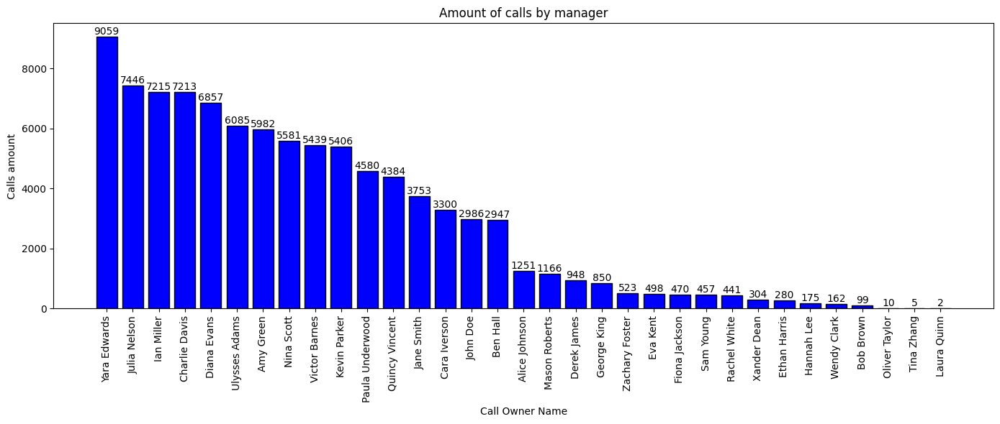

In [ ]:
calls_by_manager = calls['Call Owner Name'].value_counts()

plt.figure(figsize=(14, 6))

bars = plt.bar(calls_by_manager.index, calls_by_manager.values, color='blue', edgecolor='black')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

plt.title('Amount of calls by manager')
plt.xlabel('Call Owner Name')
plt.ylabel('Calls amount')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# I created a bar chart of calls by managers. Even though John Doe has been working since the first day of my dataset, and Yara Edwards only since mid-January,
# she is the absolute leader in the number of calls. Of course, I may be missing some context, such as a promotion for John Doe with additional responsibilities. I
# am not suggesting anyone is working poorly, I am simply displaying the number of calls.

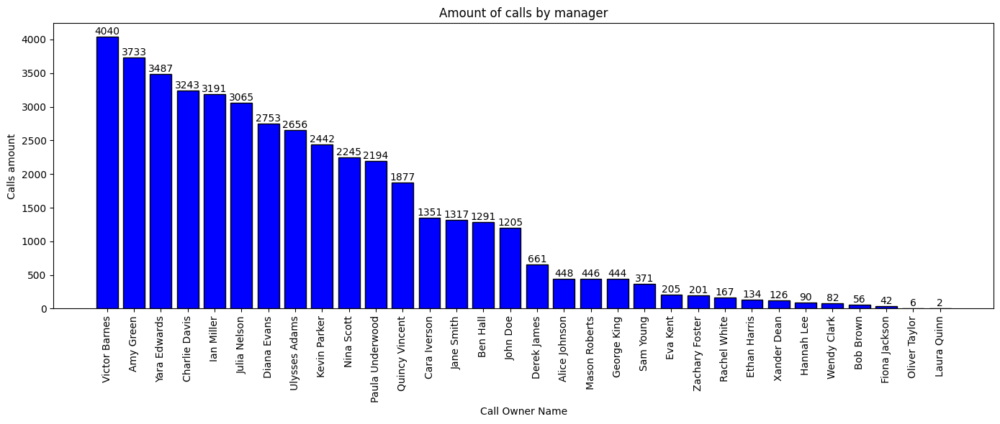

In [ ]:
new_calls_by_manager = new_calls_temp['Call Owner Name'].value_counts()

plt.figure(figsize=(14, 6))

bars = plt.bar(new_calls_by_manager.index, new_calls_by_manager.values, color='blue', edgecolor='black')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

plt.title('Amount of calls by manager')
plt.xlabel('Call Owner Name')
plt.ylabel('Calls amount')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Shortened dataframe: the number of calls by managers, focusing on calls that lasted more than 10 seconds. Victor Barnes takes the lead.

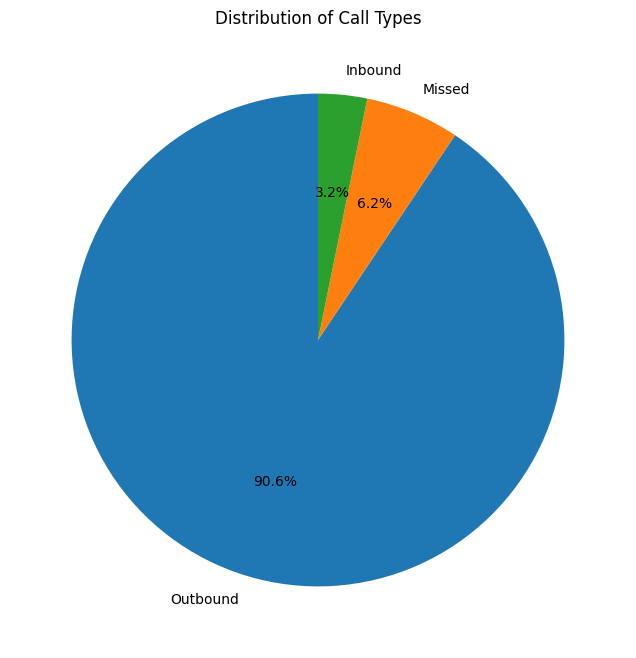

In [ ]:
calls_type = calls['Call Type'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(calls_type, labels=calls_type.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Call Types')
plt.show()

# I created a pie chart of call types. From this, we can see that 90% of the calls are outgoing.

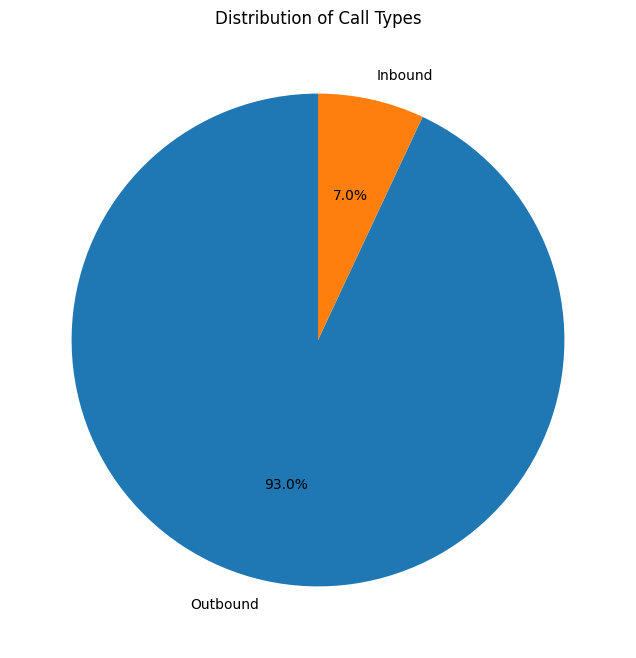

In [ ]:
calls_type = new_calls_temp['Call Type'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(calls_type, labels=calls_type.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Call Types')
plt.show()

# I created a pie chart of call types for the new dataframe (call duration over 10 seconds). From this, we can see that 93% of the calls are outgoing, with no
# missed calls, which makes sense.

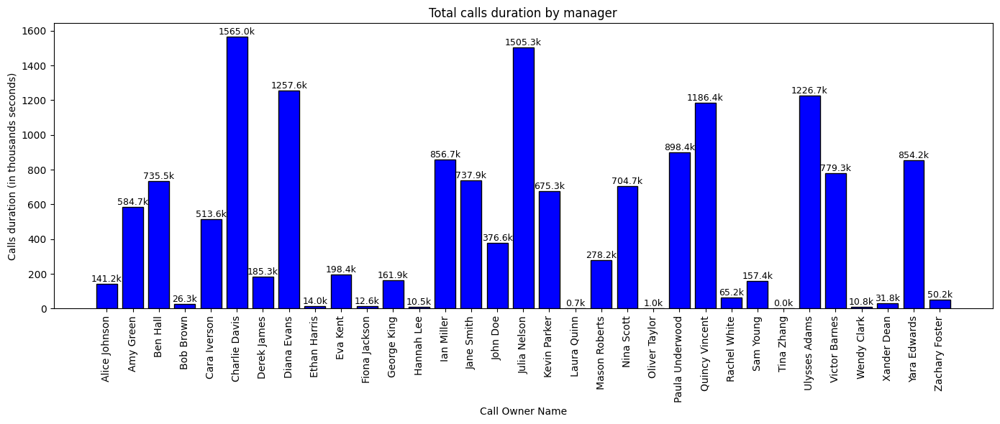

In [ ]:
total_duration_by_manager = calls.groupby('Call Owner Name')['Call Duration (in seconds)'].sum()

total_duration_in_thousands = total_duration_by_manager / 1000

plt.figure(figsize=(14, 6))

bars_d = plt.bar(total_duration_in_thousands.index, total_duration_in_thousands.values, color='blue', edgecolor='black')

for bar in bars_d:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.1f}k', ha='center', va='bottom', fontsize=9)

plt.title('Total calls duration by manager')
plt.xlabel('Call Owner Name')
plt.ylabel('Calls duration (in thousands seconds)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# I created a bar chart of call duration by managers. This chart shows the total number of seconds spent on calls. Despite Yara Edwards having the most calls,
# their total duration is not very high. Here, the leader is Charlie Davis. I would also like to point out that Julia Nelson ranks second in both categories, in
# terms of the number of calls and their total duration.

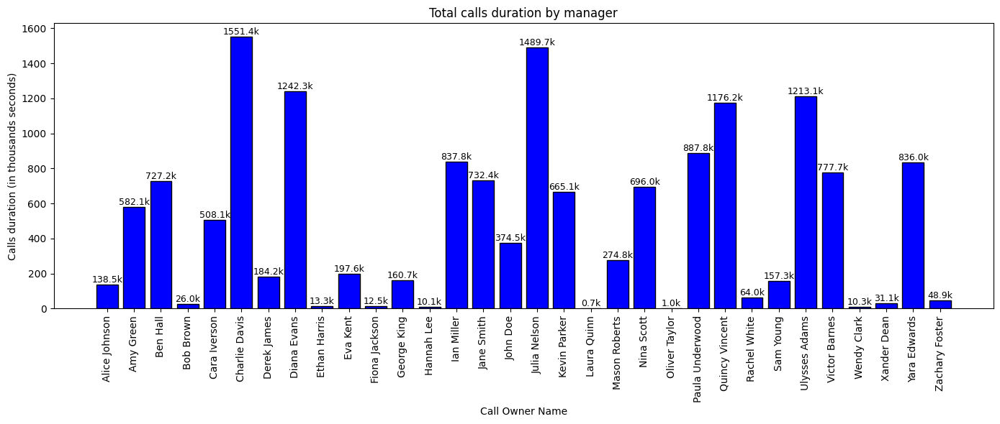

In [ ]:
new_total_duration_by_manager = new_calls_temp.groupby('Call Owner Name')['Call Duration (in seconds)'].sum()

new_total_duration_in_thousands = new_total_duration_by_manager / 1000

plt.figure(figsize=(14, 6))

bars_d = plt.bar(new_total_duration_in_thousands.index, new_total_duration_in_thousands.values, color='blue', edgecolor='black')

for bar in bars_d:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.1f}k', ha='center', va='bottom', fontsize=9)

plt.title('Total calls duration by manager')
plt.xlabel('Call Owner Name')
plt.ylabel('Calls duration (in thousands seconds)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Total call duration by managers for calls that lasted more than 10 seconds. Not much has changed, but the values are slightly lower.

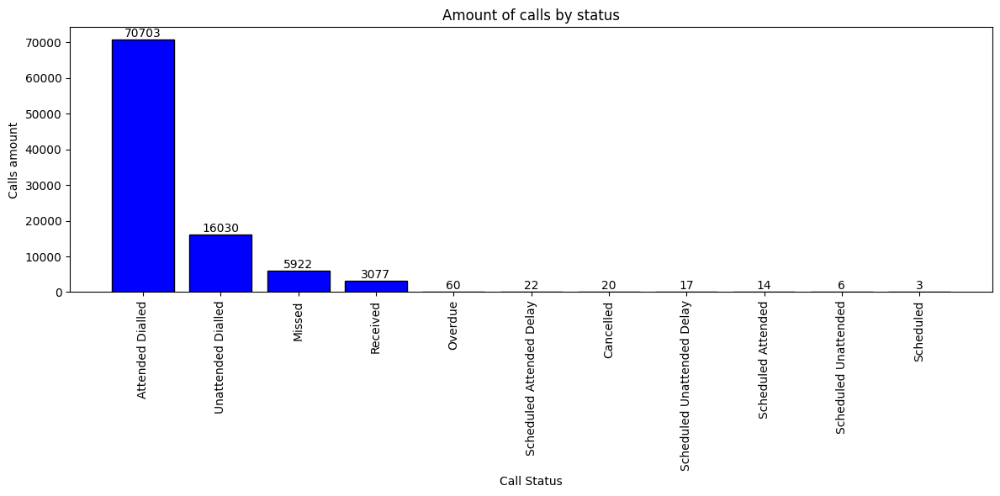

In [ ]:
calls_by_status = calls['Call Status'].value_counts()

plt.figure(figsize=(12, 6))
bars_c = plt.bar(calls_by_status.index, calls_by_status.values, color='blue', edgecolor='black')

for bar in bars_c:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.title('Amount of calls by status')
plt.xlabel('Call Status')
plt.ylabel('Calls amount')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# I created a bar chart of the number of calls by status. As before, we can see that the number of dialed/outgoing calls is higher. We can also see that scheduled
# calls are barely used, as the number of such calls is small, especially considering the overall volume.

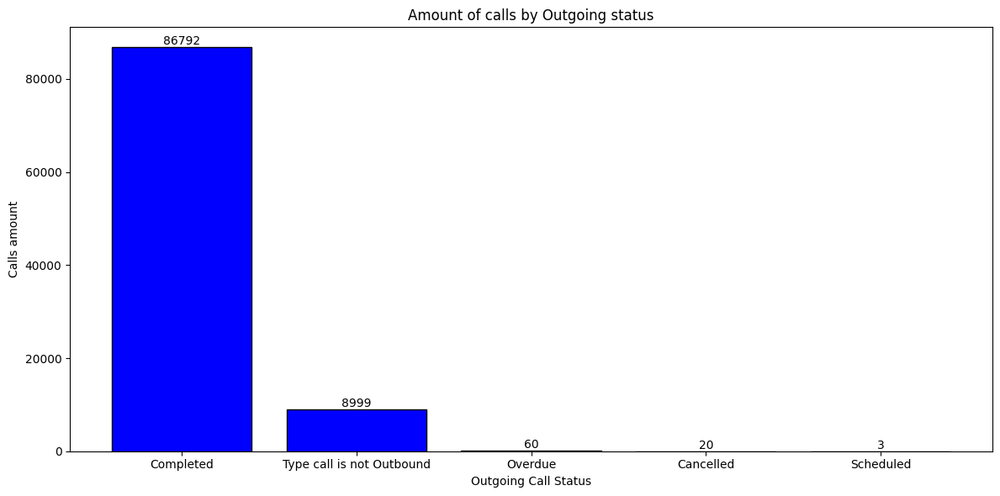

In [ ]:
calls_by_outgoing_status = calls['Outgoing Call Status'].value_counts()

plt.figure(figsize=(12, 6))
bars_os = plt.bar(calls_by_outgoing_status.index, calls_by_outgoing_status.values, color='blue', edgecolor='black')

for bar in bars_os:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.title('Amount of calls by Outgoing status')
plt.xlabel('Outgoing Call Status')
plt.ylabel('Calls amount')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# I created a bar chart of outgoing calls by status. Most of the calls were completed. There are 9,000 calls that are not truly outgoing, so their status in this
# column is irrelevant. I replaced the null values with a more logical phrase, in my opinion.

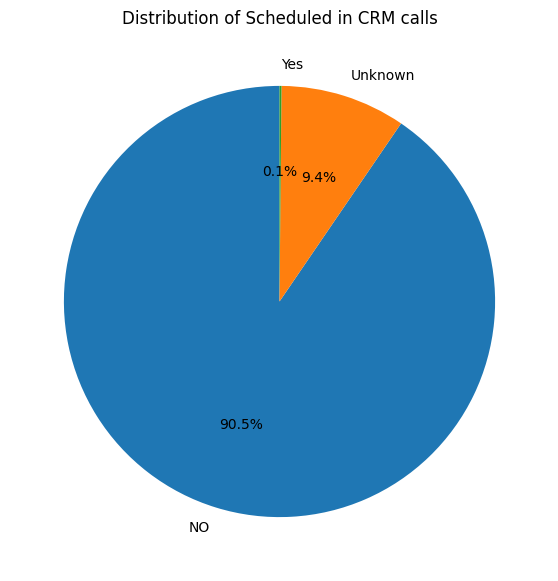

In [ ]:
calls_by_scheduled = calls['Scheduled in CRM'].value_counts()

plt.figure(figsize=(7, 7))
plt.pie(calls_by_scheduled, labels=calls_by_scheduled.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Scheduled in CRM calls')
plt.show()

# I created a pie chart of the number of calls scheduled in the CRM system. Only 0.1% of all calls were scheduled.

In [ ]:
# I decided to explore why the call numbers differ so much between managers. Based on the call date, I determined the first and last day each manager worked. I want
# to look at employee turnover and the length of their tenure at the company to get a more complete picture.

calls_periods_manager = calls.groupby('Call Owner Name')['Call Start Time'].agg(['min', 'max']).reset_index()

calls_periods_manager.columns = ['Manager', 'Start Date', 'End Date']

calls_periods_manager

,Manager,Start Date,End Date
0,Alice Johnson,2023-07-05 19:18:00,2023-07-31 16:19:00
1,Amy Green,2024-01-24 11:35:00,2024-06-18 11:42:00
2,Ben Hall,2024-02-01 16:39:00,2024-06-21 14:31:00
3,Bob Brown,2023-07-06 19:48:00,2023-10-17 17:27:00
4,Cara Iverson,2024-03-12 13:09:00,2024-06-20 20:36:00
5,Charlie Davis,2023-07-29 10:28:00,2024-06-21 10:03:00
6,Derek James,2024-04-05 13:10:00,2024-06-21 15:03:00
7,Diana Evans,2023-08-01 10:55:00,2023-12-22 13:19:00
8,Ethan Harris,2023-08-19 13:08:00,2023-11-21 14:33:00
9,Eva Kent,2024-05-07 13:22:00,2024-06-21 15:20:00


In [ ]:
# I built a Gantt chart.
fig = px.timeline(calls_periods_manager, x_start="Start Date", x_end="End Date", y="Manager", title="Manager Work Periods")
fig.update_layout(height=800, width=1200) # Initially, not all managers fit on the graph, so I had to refine it.
fig.show()

# Here, we can more clearly see that the familiar names have been working for a long time, which explains their higher number of calls and call duration.
# The shortest period of work among the familiar names is Yara Edwards.

In [ ]:
# Downloading the transformed dataset.

calls.to_excel('cleaned_calls.xlsx', index=False)

# **Working with the Contacts table**



In [ ]:
# Loading the original file

contacts = pd.read_excel('/content/Contacts (Done).xlsx')
contacts

,Id,Contact Owner Name,Created Time,Modified Time
0,5805028000000645014,Rachel White,27.06.2023 11:28,22.12.2023 13:34
1,5805028000000872003,Charlie Davis,03.07.2023 11:31,21.05.2024 10:23
2,5805028000000889001,Bob Brown,02.07.2023 22:37,21.12.2023 13:17
3,5805028000000907006,Bob Brown,03.07.2023 05:44,29.12.2023 15:20
4,5805028000000939010,Nina Scott,04.07.2023 10:11,16.04.2024 16:14
...,...,...,...,...
18543,5805028000056889209,Ulysses Adams,21.06.2024 12:11,21.06.2024 14:11
18544,5805028000056889351,Eva Kent,21.06.2024 13:32,21.06.2024 15:32
18545,5805028000056892018,Eva Kent,21.06.2024 10:21,21.06.2024 12:21
18546,5805028000056892055,Yara Edwards,21.06.2024 10:22,21.06.2024 12:23


In [ ]:
# Removing duplicates, if any (none were found, as seen by the number of rows in the dataframes, but I left the code cell).

contacts = contacts.drop_duplicates()
contacts

,Id,Contact Owner Name,Created Time,Modified Time
0,5805028000000645014,Rachel White,27.06.2023 11:28,22.12.2023 13:34
1,5805028000000872003,Charlie Davis,03.07.2023 11:31,21.05.2024 10:23
2,5805028000000889001,Bob Brown,02.07.2023 22:37,21.12.2023 13:17
3,5805028000000907006,Bob Brown,03.07.2023 05:44,29.12.2023 15:20
4,5805028000000939010,Nina Scott,04.07.2023 10:11,16.04.2024 16:14
...,...,...,...,...
18543,5805028000056889209,Ulysses Adams,21.06.2024 12:11,21.06.2024 14:11
18544,5805028000056889351,Eva Kent,21.06.2024 13:32,21.06.2024 15:32
18545,5805028000056892018,Eva Kent,21.06.2024 10:21,21.06.2024 12:21
18546,5805028000056892055,Yara Edwards,21.06.2024 10:22,21.06.2024 12:23


In [ ]:
# Displaying information about the dataframe. The number of filled (non-empty) rows and the column types are what interest me the most. We can see that the dataframe
# contains no null values. We only need to change the data types.

contacts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18548 entries, 0 to 18547
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Id                  18548 non-null  int64 
 1   Contact Owner Name  18548 non-null  object
 2   Created Time        18548 non-null  object
 3   Modified Time       18548 non-null  object
dtypes: int64(1), object(3)
memory usage: 579.8+ KB


In [ ]:
# Changing the data types for columns containing date and time.

contacts['Created Time'] = pd.to_datetime(contacts['Created Time'], format='%d.%m.%Y %H:%M')
contacts['Modified Time'] = pd.to_datetime(contacts['Modified Time'], format='%d.%m.%Y %H:%M')

In [ ]:
# Checking the uniqueness of values in each column. All client IDs are unique.

contacts.nunique()

,0
Id,18548
Contact Owner Name,28
Created Time,17921
Modified Time,16580


In [ ]:
# Double-checking that the data types have changed.

contacts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18548 entries, 0 to 18547
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Id                  18548 non-null  int64         
 1   Contact Owner Name  18548 non-null  object        
 2   Created Time        18548 non-null  datetime64[ns]
 3   Modified Time       18548 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(1)
memory usage: 579.8+ KB


In [ ]:
# Checking the mean and ranges of numerical columns. This dataframe also covers almost an entire year, missing only 5 days.

contacts.describe()

,Id,Created Time,Modified Time
count,1.854800e+04,18548,18548
mean,5.805028e+18,2024-01-24 14:00:21.679965696,2024-02-15 07:41:24.814535168
min,5.805028e+18,2023-06-27 11:28:00,2023-07-06 10:54:00
25%,5.805028e+18,2023-11-15 16:40:45,2023-12-09 12:43:00
50%,5.805028e+18,2024-02-01 18:30:00,2024-02-28 22:21:30
75%,5.805028e+18,2024-04-12 16:37:15,2024-04-26 22:02:30
max,5.805028e+18,2024-06-21 15:30:00,2024-06-21 15:32:00
std,1.566362e+07,NaN,NaN


In [ ]:
# Calculating the medians of the "created" and "modified" columns. Didn't notice anything interesting.

median_create_time = contacts['Created Time'].median()
median_modifyed_duration = contacts['Modified Time'].median()
median_create_time, median_modifyed_duration

(Timestamp('2024-02-01 18:30:00'), Timestamp('2024-02-28 22:21:30'))

In [ ]:
# Calculating the mode of the "created" and "modified" columns. Didn't notice anything interesting.

mode_create_time = contacts['Created Time'].mode()
mode_modifyed_duration = contacts['Modified Time'].mode()
mode_create_time, mode_modifyed_duration

(0   2024-06-10 09:00:00
 Name: Created Time, dtype: datetime64[ns],
 0   2024-06-13 17:08:00
 Name: Modified Time, dtype: datetime64[ns])

In [ ]:
# When plotting the graphs, I encountered an error due to the presence of the value "False" in the dataframe. I had to process and replace it with "Unknown".

contacts['Contact Owner Name'].unique()

array(['Rachel White', 'Charlie Davis', 'Bob Brown', 'Nina Scott',
       'Alice Johnson', 'Ian Miller', 'Jane Smith', 'Julia Nelson',
       'George King', 'Quincy Vincent', 'Diana Evans', 'Kevin Parker',
       'Ulysses Adams', 'Victor Barnes', 'Yara Edwards',
       'Paula Underwood', 'Mason Roberts', 'Ben Hall', 'Amy Green',
       'Cara Iverson', 'Oliver Taylor', 'Eva Kent', False,
       'Zachary Foster', 'Sam Young', 'Wendy Clark', 'Tina Zhang',
       'Derek James'], dtype=object)

In [ ]:
# Replacing "False" with "Unknown."

contacts['Contact Owner Name'] = contacts['Contact Owner Name'].replace(False, "Unknown")

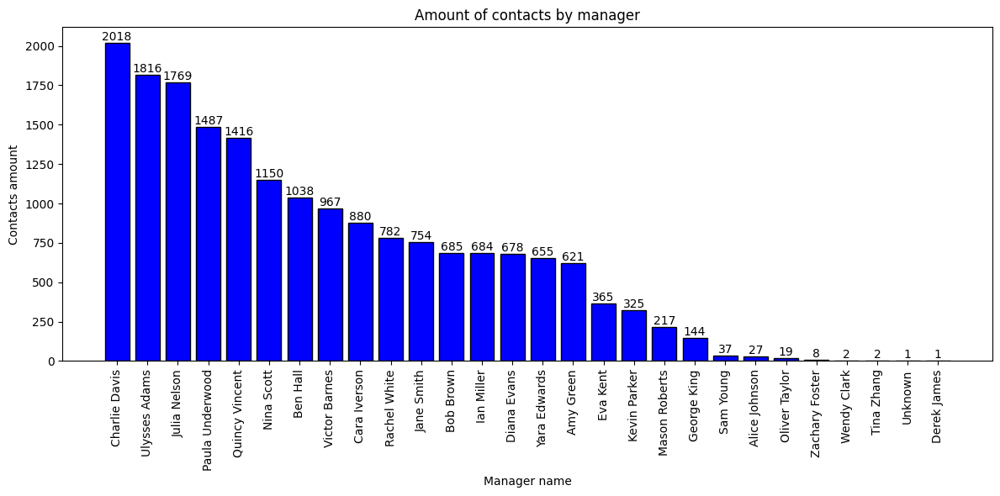

In [ ]:
contacts_by_manager = contacts['Contact Owner Name'].value_counts()

plt.figure(figsize=(12, 6))
bars_c_m = plt.bar(contacts_by_manager.index, contacts_by_manager.values, color='blue', edgecolor='black')

for bar in bars_c_m:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.title('Amount of contacts by manager')
plt.xlabel('Manager name')
plt.ylabel('Contacts amount')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Created a chart showing the number of contacts by each manager. I checked the compatibility by comparing several CONTACTIDs (from the "Calls" table) and IDs (from the
# "Contacts" table). The IDs match, but the manager's name is different. I'm unsure if this was done intentionally or if this discrepancy is related to database errors.
# Because of this, I can't definitively identify the managers. Currently, it shows that Julia Nelson is in the top 3, but I can't confidently say this is accurate.
# Due to this, I suspect that the "Contacts" table refers to contacts other than calls. Additionally, the number of managers is lower than in the "Calls" table. For
# example, John Doe is absent.

In [ ]:
fig = px.histogram(contacts, x='Created Time', nbins=100, title='Amount of Contacts by Time', template='plotly_white')
fig.update_layout(xaxis_title='Created Time', yaxis_title='Amount of Contacts', bargap=0.1)
fig.show()

# Created a histogram of contact creation dates. Just like with the calls, there's a drop in the number of contacts during the Christmas holidays.
# There's also a drop at the end of Spring, the reason for which is unknown.

In [ ]:
fig = px.histogram(contacts, x='Modified Time', nbins=100, title='Amount of Modified Contacts by Time', template='plotly_white')
fig.update_layout(xaxis_title='Modified Time', yaxis_title='Amount of Contacts', bargap=0.1)
fig.show()

# Created a histogram of contact modification dates. Similarly, there's a drop in the number of contacts during the Christmas holidays and at the beginning of summer,
# though the reason is unknown.

In [ ]:
# Downloading the transformed dataset.

contacts.to_excel('cleaned_contacts.xlsx', index=False)

# **Working with the Deals table**

In [ ]:
# Loading the original file

deals = pd.read_excel('/content/Deals (Done).xlsx')
deals

,Id,Deal Owner Name,Closing Date,Quality,Stage,Lost Reason,Page,Campaign,SLA,Content,...,Product,Education Type,Created Time,Course duration,Months of study,Initial Amount Paid,Offer Total Amount,Contact Name,City,Level of Deutsch
0,5.805028e+18,Ben Hall,NaN,NaN,New Lead,NaN,/eng/test,03.07.23women,NaN,v16,...,NaN,NaN,21.06.2024 15:30,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
1,5.805028e+18,Ulysses Adams,NaN,NaN,New Lead,NaN,/at-eng,NaN,NaN,NaN,...,Web Developer,Morning,21.06.2024 15:23,6.0,NaN,0,2000,5.805028e+18,NaN,NaN
2,5.805028e+18,Ulysses Adams,21.06.2024,D - Non Target,Lost,Non target,/at-eng,engwien_AT,00:26:43,b1-at,...,NaN,NaN,21.06.2024 14:45,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
3,5.805028e+18,Eva Kent,21.06.2024,E - Non Qualified,Lost,Invalid number,/eng,04.07.23recentlymoved_DE,01:00:04,bloggersvideo14com,...,NaN,NaN,21.06.2024 13:32,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
4,5.805028e+18,Ben Hall,21.06.2024,D - Non Target,Lost,Non target,/eng,discovery_DE,00:53:12,website,...,NaN,NaN,21.06.2024 13:21,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21590,5.805028e+18,Jane Smith,29.08.2023,A - High,Lost,Changed Decision,eng/digital-marketing,02.07.23wide_DE,"56 days, 19:01:59",b3,...,NaN,NaN,03.07.2023 20:39,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
21591,5.805028e+18,Bob Brown,09.07.2023,D - Non Target,Lost,Does not speak English,eng/digital-marketing,03.07.23women,NaN,b3,...,NaN,NaN,03.07.2023 20:17,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
21592,5.805028e+18,Bob Brown,03.07.2023,E - Non Qualified,Lost,Refugee,/,NaN,"4 days, 22:47:14",NaN,...,NaN,NaN,03.07.2023 17:03,NaN,NaN,0,0,5.805028e+18,NaN,NaN
21593,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Removing duplicates, if any (3 duplicates were found), as seen by the number of rows. Replacing the index when removing duplicates.

deals = deals.drop_duplicates(ignore_index= True)
deals

,Id,Deal Owner Name,Closing Date,Quality,Stage,Lost Reason,Page,Campaign,SLA,Content,...,Product,Education Type,Created Time,Course duration,Months of study,Initial Amount Paid,Offer Total Amount,Contact Name,City,Level of Deutsch
0,5.805028e+18,Ben Hall,NaN,NaN,New Lead,NaN,/eng/test,03.07.23women,NaN,v16,...,NaN,NaN,21.06.2024 15:30,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
1,5.805028e+18,Ulysses Adams,NaN,NaN,New Lead,NaN,/at-eng,NaN,NaN,NaN,...,Web Developer,Morning,21.06.2024 15:23,6.0,NaN,0,2000,5.805028e+18,NaN,NaN
2,5.805028e+18,Ulysses Adams,21.06.2024,D - Non Target,Lost,Non target,/at-eng,engwien_AT,00:26:43,b1-at,...,NaN,NaN,21.06.2024 14:45,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
3,5.805028e+18,Eva Kent,21.06.2024,E - Non Qualified,Lost,Invalid number,/eng,04.07.23recentlymoved_DE,01:00:04,bloggersvideo14com,...,NaN,NaN,21.06.2024 13:32,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
4,5.805028e+18,Ben Hall,21.06.2024,D - Non Target,Lost,Non target,/eng,discovery_DE,00:53:12,website,...,NaN,NaN,21.06.2024 13:21,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21587,5.805028e+18,Jane Smith,29.08.2023,A - High,Lost,Changed Decision,eng/digital-marketing,02.07.23wide_DE,"56 days, 19:01:59",b3,...,NaN,NaN,03.07.2023 20:39,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
21588,5.805028e+18,Bob Brown,09.07.2023,D - Non Target,Lost,Does not speak English,eng/digital-marketing,03.07.23women,NaN,b3,...,NaN,NaN,03.07.2023 20:17,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
21589,5.805028e+18,Bob Brown,03.07.2023,E - Non Qualified,Lost,Refugee,/,NaN,"4 days, 22:47:14",NaN,...,NaN,NaN,03.07.2023 17:03,NaN,NaN,0,0,5.805028e+18,NaN,NaN
21590,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Noticed that the last two rows contain no data, only nulls and an error imported from Excel. Deleting the last two rows.

deals.drop(deals.tail(2).index,inplace = True)
deals

<ipython-input-95-f9c541cd7880>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Id,Deal Owner Name,Closing Date,Quality,Stage,Lost Reason,Page,Campaign,SLA,Content,...,Product,Education Type,Created Time,Course duration,Months of study,Initial Amount Paid,Offer Total Amount,Contact Name,City,Level of Deutsch
0,5.805028e+18,Ben Hall,NaN,NaN,New Lead,NaN,/eng/test,03.07.23women,NaN,v16,...,NaN,NaN,21.06.2024 15:30,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
1,5.805028e+18,Ulysses Adams,NaN,NaN,New Lead,NaN,/at-eng,NaN,NaN,NaN,...,Web Developer,Morning,21.06.2024 15:23,6.0,NaN,0,2000,5.805028e+18,NaN,NaN
2,5.805028e+18,Ulysses Adams,21.06.2024,D - Non Target,Lost,Non target,/at-eng,engwien_AT,00:26:43,b1-at,...,NaN,NaN,21.06.2024 14:45,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
3,5.805028e+18,Eva Kent,21.06.2024,E - Non Qualified,Lost,Invalid number,/eng,04.07.23recentlymoved_DE,01:00:04,bloggersvideo14com,...,NaN,NaN,21.06.2024 13:32,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
4,5.805028e+18,Ben Hall,21.06.2024,D - Non Target,Lost,Non target,/eng,discovery_DE,00:53:12,website,...,NaN,NaN,21.06.2024 13:21,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21585,5.805028e+18,Jane Smith,04.07.2023,E - Non Qualified,Lost,Duplicate,eng/digital-marketing,03.07.23women,NaN,b3,...,NaN,NaN,04.07.2023 07:10,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
21586,5.805028e+18,Jane Smith,29.08.2023,B - Medium,Lost,needs time to think,eng/digital-marketing,03.07.23women,NaN,b3,...,NaN,NaN,04.07.2023 07:10,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
21587,5.805028e+18,Jane Smith,29.08.2023,A - High,Lost,Changed Decision,eng/digital-marketing,02.07.23wide_DE,"56 days, 19:01:59",b3,...,NaN,NaN,03.07.2023 20:39,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN
21588,5.805028e+18,Bob Brown,09.07.2023,D - Non Target,Lost,Does not speak English,eng/digital-marketing,03.07.23women,NaN,b3,...,NaN,NaN,03.07.2023 20:17,NaN,NaN,NaN,NaN,5.805028e+18,NaN,NaN


In [ ]:
# Displaying information about the dataframe, the number of filled (non-empty) rows, and the column types.
# We see that the dataframe contains nulls in some columns, and the data types need to be adjusted.

deals.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21590 entries, 0 to 21589
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Id                   21590 non-null  float64
 1   Deal Owner Name      21561 non-null  object 
 2   Closing Date         14643 non-null  object 
 3   Quality              19338 non-null  object 
 4   Stage                21590 non-null  object 
 5   Lost Reason          16122 non-null  object 
 6   Page                 21590 non-null  object 
 7   Campaign             16066 non-null  object 
 8   SLA                  15533 non-null  object 
 9   Content              14146 non-null  object 
 10  Term                 12453 non-null  object 
 11  Source               21590 non-null  object 
 12  Payment Type         496 non-null    object 
 13  Product              3592 non-null   object 
 14  Education Type       3299 non-null   object 
 15  Created Time         21590 non-null 

In [ ]:
# The dataframe contains a total of 21,590 rows.
# If I notice missing values or an incorrect data type, I change the type and handle the nulls.
# The "Id" column has no nulls but is of type float64, so I change it to int.
# The data type for "Deal Owner Name" is fine, but there are nulls, which I fill with "Unknown."
# The "Closing Date" contains nulls and needs its data type changed to a date. The column doesn't include time, and I leave the nulls as is, as I believe it's incorrect
# to fill missing values with guessed data. This field can contain nulls since a deal may not be closed, so I don't handle the nulls, but I change the data type to a date.
# The "Quality" column type is fine, but there are nulls, which I fill with "Unknown."
# The "Stage" column is fine, moving on.
# In "Lost Reason," I fill nulls with "Unknown" where the "Lost" status is set. For the remaining nulls, I fill with "Non-applicable," since it's incorrect to mark them
# as "Unknown" without the "Lost" status.
# The "Page" column is fine, moving on.
# The "Campaign" column type is fine, but there are nulls, which I fill with "Unknown."
# The "SLA" column type is fine, but there are nulls, which I fill with "Unknown."
# The "Content" column type is fine, but there are nulls, which I fill with "Unknown."
# The "Term" column type is fine, but there are nulls, which I fill with "Unknown."
# The "Source" column is fine, moving on.
# The "Payment Type" column type is fine, but there are many nulls, even in rows where payment is indicated (3,000 empty rows). I partially fill with "Unknown" and
# partially with "Non-applicable."
# The "Product" column type is fine, but there are nulls, which I fill with "Unknown."
# The "Education Type" column type is fine, but there are nulls, which I fill with "Unknown."
# The "Created Time" column contains no nulls, but I change the type to datetime.
# The "Course Duration" column has many nulls, leaving them as is for now. I will change the type to integer later, after calculating descriptive statistics for more
# accurate display.
# The "Months of Study" column has many nulls, leaving them as is for now. I will change the type to integer later after calculating descriptive statistics for more
# accurate display.
# In the "Initial Amount Paid" column, I first replace string characters for conversion and then change the type to integer, filling missing values with zeros.
# In the "Offer Total Amount" column, I first replace string characters for conversion, change the type to integer, filling missing values with zeros. Changing it now,
# as the descriptive statistics won't display correctly with the object type.
# In "Contact Name," I fill nulls with 0 and change the data type to int.
# The "City" column type is fine, but there are nulls, which I fill with "Unknown."
# "Level of Deutsch" will be handled in the next cell as it requires a lot of transformations to standardize the data.

deals['Id'] = deals['Id'].astype(int)
deals['Deal Owner Name'] = deals['Deal Owner Name'].fillna('Unknown')
deals['Closing Date'] = pd.to_datetime(deals['Closing Date'], format='%d.%m.%Y')
deals['Quality'] = deals['Quality'].fillna('Unknown')

mask = (deals['Stage'] == 'Lost') & (deals['Lost Reason'].isnull())
deals.loc[mask, 'Lost Reason'] = 'Unknown'
deals['Lost Reason'] = deals['Lost Reason'].fillna('Non applicable')

deals['Campaign'] = deals['Campaign'].fillna('Unknown')
deals['SLA'] = deals['SLA'].fillna('Unknown')
deals['Content'] = deals['Content'].fillna('Unknown')
deals['Term'] = deals['Term'].fillna('Unknown')

mask = (deals['Stage'] == 'Waiting For Payment') | (deals['Stage'] == 'Payment Done') & (deals['Payment Type'].isnull())
deals.loc[mask, 'Payment Type'] = 'Unknown'
deals['Payment Type'] = deals['Payment Type'].fillna('Non applicable')

deals['Product'] = deals['Product'].fillna('Unknown')
deals['Education Type'] = deals['Education Type'].fillna('Unknown')
deals['Created Time'] = pd.to_datetime(deals['Created Time'], format='%d.%m.%Y %H:%M')

deals['Initial Amount Paid'] = deals['Initial Amount Paid'].replace('€ 3.500,00', '3500')
deals['Initial Amount Paid'] = deals['Initial Amount Paid'].fillna(0).astype('int32')

deals['Offer Total Amount'] = deals['Offer Total Amount'].replace('€ 2.900,00', '2900')
deals['Offer Total Amount'] = deals['Offer Total Amount'].replace('€ 11398,00', '11398')
deals['Offer Total Amount'] = deals['Offer Total Amount'].fillna(0).astype('int32')

deals['Contact Name'] = deals['Contact Name'].fillna(0).astype(int)
deals['City'] = deals['City'].fillna('Unknown')


<ipython-input-97-e287de666ac2>:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-97-e287de666ac2>:34: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-97-e287de666ac2>:35: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-97-e287

In [ ]:
# Displaying unique values in the "Level of Deutsch" column.

deals['Level of Deutsch'].unique()

array([nan, 'в1', 'A2', 'б1', 'b1', 'B1', 'в1-в2', 'B2', 'C2', 'с1', 'Б1',
       'а2', 'а1', 'а0', 'б2', 'Б2', 'В1', 'А2',
       'B1 будет в феврале 2025', 'Detmold, Paulinenstraße 95, 32756',
       'Сам оценивает на B2, 13 лет живет в Германии', 'в2', 'В1-В2',
       'Б1 ( ждет Б2)', 'А2-В1',
       'lэкзамен - 6 июля на В1. курсы вечером (но уверенно говорит на B1)',
       'Гражданка Германии уже год в Германии Учит немецкий и в сентябре b1 через гос-во проходит, а не через ДЖЦ, вечером учится 3 р в неделю с 18 до 21',
       '-', 'А2 ( Б1 в июне)', 'B1 в процессе обучения',
       'ЯЗ: нем В1 был экз 03.05 повтор и сейчас ждет результаты. Технический англ был. А1 сейчас. ОБР: 2 во информационные и комп сети - инженер системоте',
       'В1 в сентябре', 'Нет', 'С1', 0, 'Ждем B1',
       'А1 сертиф, но по факту А2', 'a2', 'Пока А2, сдает 17 05 B1',
       'окончание 13.06 курса на b1', 'A1', 'b2',
       'Thorn-Prikker-Str. 30, Hagen, 58093', 'В2',
       'нулевой уровень, только 

In [ ]:
# Converting all text to uppercase.

deals['Level of Deutsch'] = deals['Level of Deutsch'].str.upper()

<ipython-input-99-c60b5596d97e>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# A lot of manual copy-pasting and logical conclusions.

deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('НЯ - В1, АЯ - В1', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ГРАЖДАНКА ГЕРМАНИИ УЖЕ ГОД В ГЕРМАНИИ УЧИТ НЕМЕЦКИЙ И В СЕНТЯБРЕ B1 ЧЕРЕЗ ГОС-ВО ПРОХОДИТ, А НЕ ЧЕРЕЗ ДЖЦ, ВЕЧЕРОМ УЧИТСЯ 3 Р В НЕДЕЛЮ С 18 ДО 21', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('LЭКЗАМЕН - 6 ИЮЛЯ НА В1. КУРСЫ ВЕЧЕРОМ (НО УВЕРЕННО ГОВОРИТ НА B1)', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('А2-В1', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('САМ ОЦЕНИВАЕТ НА B2, 13 ЛЕТ ЖИВЕТ В ГЕРМАНИИ', 'B2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('DETMOLD, PAULINENSTRASSE 95, 32756', '')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 БУДЕТ В ФЕВРАЛЕ 2025', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('НЕТ', 'А0')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('В1 В СЕНТЯБРЕ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ЯЗ: НЕМ В1 БЫЛ ЭКЗ 03.05 ПОВТОР И СЕЙЧАС ЖДЕТ РЕЗУЛЬТАТЫ. ТЕХНИЧЕСКИЙ АНГЛ БЫЛ. А1 СЕЙЧАС. ОБР: 2 ВО ИНФОРМАЦИОННЫЕ И КОМП СЕТИ - ИНЖЕНЕР СИСТЕМОТЕ', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 В ПРОЦЕССЕ ОБУЧЕНИЯ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('-', '')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('PADERBORN 33102, SCHWABENWEG 10', '')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 ЭКЗАМЕН БУДЕТ 12 АПРЕЛЯ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ЖДЕТ РЕЗУЛЬТАТ ПО B1', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('АЯ В1', '')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('НУЛЕВОЙ УРОВЕНЬ, ТОЛЬКО ПОШЕЛ НА КУРСЫ.', 'А0')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('THORN-PRIKKER-STR. 30, HAGEN, 58093', '')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ОКОНЧАНИЕ 13.06 КУРСА НА B1', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ПОКА А2, СДАЕТ 17 05 B1', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ЖДЕМ B1', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ГРАЖДАНИН', 'B1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 (ЖДЕТ РЕЗУЛЬТАТ)', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ГРАЖДАНКА', 'B1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 9ЖДЕТ ЭКЗАМЕН)', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('УЧИТЬСЯ ДО СЕНТЯБРЯ НА B1', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('LICHTENFELSER STRASSE 25, UNTERSIEMAU 96253', '')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('31.05.2024', '')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 ЕЩЕ НЕТ РЕЗУЛЬТАТА', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ЖДЕМ B1 СО ДНЯ НА ДЕНЬ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ЖДЕТ СЕРТИФИКАТ B1', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 (ЖДЕТ РЕЗУЛЬТАТЫ)', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ЖДЕТ СО ДНЯ НА ДЕНЬ В1', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ЖДЕМ РЕЗУЛЬТАТ ПО B1', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('С1 -АЯ , НЯ -А1', 'А1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('25 ЛЕТ ЖИВЕТ В ГЕРМАНИИ', 'B1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('БУДЕТ B1 В ИЮНЕ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('Б1 (ЖДЕТ РЕЗ-ТАТ)', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('Б1 ( ЖДЕТ ИТОГ )', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('УЧИТ A2', 'А1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('НЕТ СЕРТИФИКАТОВ, НО ЕСТЬ С1 АНГЛ, НЕОКОНЧЕННОЕ ВЫСШЕЕ В ИТ (И ЕЩЕ ОДНО ВЫСШЕЕ ЮРИДИЧЕСКОЕ) , ОЧЕНЬ ХОЧЕТ В ИТ, СИЛЬНО ЗАМОТИВИРОВАНА ИМЕННО Н', 'А0')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('НЕ СДАВАЛ, НО ГРАЖДАНИН', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('А2 ( СКОРО ЕКЗАМЕН)', 'А1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 24 ФЕВРАЛЯ ЭКЗАМЕН, АНГЛ B2', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('А1-А2 , АЯ СВОБОДНЫЙ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 ЖДЕТ ЭКЗАМЕН В ФЕВРАЛЕ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 ЖДЕТ РЕЗУЛЬТАТЫ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('Б1( МОЖЕТ БУДЕТ)', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('A1-A2', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('КУРС А2-В1 - СДАЧА В ИЮЛЕ, НО ВЕЧЕРНЯЯ СМЕНА ИНТ КУРСОВ, НАСТРОЕН ПОЛУЧИТЬ ГУТШАЙН УЖЕ СЕЙЧАС.', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('В2-С1', 'С1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('В', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('НЯ-0, НО АНГЛ B2+', 'А0')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ПРОХОДИТ СЕЙЧАС ПОВТОРНО B1', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 ДОЛЖНА ПОЛУЧИТЬ РЕЗУЛЬТАТЫ В ФЕВРАЛЕ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B2 ЖДЕТ СЕРТ', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 (ЖДЕТ СЕРТ)', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B2 (ЖДЕТ ИТОГ ЭКЗАМЕНА)', 'B1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 БУДЕТ В ЯНВАРЕ ЭКЗАМЕН, ГОТОВ СОВМЕЩАТЬ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('A2-Б1', 'B1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('Б1 ЗАКАНЧИВАЕТ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('', '')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('Б2-С1', 'С1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B2-C1', 'С1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B2-C2', 'С1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('А2-Б1', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('Б1-Б2', 'В2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('СДАЛА ЭКЗАМЕН НА B1, ЖДЕТ В НАЧАЛЕ ФЕВРАЛЯ РЕЗУЛЬТАТ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('УЧИТЬСЯ НА B1', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 ЭКЗАМЕН 26 ЯНВАРЯ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('F2', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('Б10Б2', 'В2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1-B2', 'В2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('?', '')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('УЧИТЬСЯ НА B1 ВО ВТОРУЮ СМЕНУ, В ПЕРВУЮ ХОЧЕТ ПОЛУЧИТЬ ОДОБРЕНИЕ НА ОБУЧЕНИЕ У НАС', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 ЭКЗАМЕН В ФЕВРАЛЕ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ПРОХОДИТ СЕЙЧАС ПОВТОРНО B1', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ЖДЕТ РЕЗУЛЬТАТ ПО B1 В ФЕВРАЛЕ', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ПРОХОДИТ СЕЙЧАС B1', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('БЕЗ 5 МИНУТ B1 (ЖДЕТ РЕЗУЛЬТАТЫ ЭКЗАМЕНА)', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('НЕ УЧИЛ', 'А0')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('В ЯНВАРЕ - В2 СДАЕТ', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ТОЧНО УРОВЕНЬ НЕ ЗНАЮ, НО ГОВОРИТЬ МОГУ - УЧИЛА САМА', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('СДАВАЛА А2 В СЕНТЯБРЕ', 'A2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ЖДЕТ B1', 'A2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('УТОЧНИТЬ', '')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('РАЗГОВОРНЫЙ ИЗ УКРАИНЫ, БЕЗ СЕРТИФИКАТА', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('В2 - НЕ СДАЛ', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('A', 'A2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('5 ИЮЛЯ 2024 СДАЕТ ЭКЗ НА В2', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('C', 'C1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('УТОЧНИТЬ!', '')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('.', '')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('НИКАКОЙ', 'А0')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('БЙ', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ИДЕТ НА А1', 'А1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 РЕЗУЛЬТАТ ЭКЗАМЕНА В ФЕВРАЛЕ', 'A2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('ЖДЕТ РЕЗУЛЬТАТЫ ПО B1 ЭКЗАМЕНУ', 'A2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('НЕМЕЦКИЙ - А1-А2, АНГЛ B1-B2', 'A2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('НЯ А2, АЯ В1', 'А2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('НЕ УЧИЛА ( РАЗГОВОРНЫЙ) СРАЗУ ПОШЛА РАБОТАТЬ', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B1 (ПОЧТИ, НЕ СДАЛА ЧУТЬ) + АНГЛ В1', 'A2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('В1, ЕЩЕ НЕТ СЕРТИФИКАТА', 'A2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('B2 (ЖДЕТ СЕРТ)', 'В1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('Б1 ( БЫЛ ЕКЗАМЕН ЖДЕТ ИТОГ )', 'A2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('A0-A1', 'A1')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('В1 ЖДЕМ РЕЗУЛЬТАТЫ', 'A2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('НЯ-0, АЯ-B1', 'A0')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('В ЯНВАРЕ БУДУТ РЕЗУЛЬТАТЫ ПО ЭКЗАМЕНУ НА B1', 'A2')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('СДАВАЛ 8 12 НА B1 - ЖДЕТ РЕЗУЛЬТАТ. 3 01 - АПЛЕЙТ - ПОЛУЧИЛ B1!', 'В1')


<ipython-input-100-e8b3af36090d>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-100-e8b3af36090d>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-100-e8b3af36090d>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-100-e8b

In [ ]:
# Replacing characters to avoid visual duplication of symbols.

trans_dict = {
    'А': 'A', 'Б': 'B', 'В': 'B', 'С': 'C'
}

def transliterate(col):
    return ''.join([trans_dict.get(char, char) for char in col])

deals['Level of Deutsch'] = deals['Level of Deutsch'].astype(str).apply(transliterate)

<ipython-input-101-f8f335432de8>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Continuing the transformation of the column, removing everything except the first two characters, and filling missing values with "Unknown."

deals['Level of Deutsch'] = deals['Level of Deutsch'].astype(str).apply(lambda x: x[:2])
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('', 'Unknown')
deals['Level of Deutsch'] = deals['Level of Deutsch'].fillna('Unknown')
deals['Level of Deutsch'] = deals['Level of Deutsch'].replace('na', 'Unknown')

<ipython-input-102-544358302fca>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-102-544358302fca>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-102-544358302fca>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-102-544

In [ ]:
# Rechecking the contents of the column.

deals['Level of Deutsch'].unique()

array(['Unknown', 'B1', 'A2', 'B2', 'C2', 'C1', 'A1', 'A0'], dtype=object)

In [ ]:
# Checking the uniqueness of values in each column. I was surprised to find that the "Id" column contains only 8,612 unique IDs. Checking further.

deals.nunique()

,0
Id,8612
Deal Owner Name,28
Closing Date,359
Quality,7
Stage,13
Lost Reason,23
Page,34
Campaign,155
SLA,13358
Content,188


In [ ]:
# # Yes, according to the program, the table contains many duplicate IDs.

repit_id = deals.groupby(deals['Id']).size()
repit_id

,0
Id,
5805028000000921600,1
5805028000000926720,1
5805028000000930816,1
5805028000000932864,1
5805028000000934912,2
...,...
5805028000056863744,3
5805028000056864768,1
5805028000056872960,2


However, I couldn't find duplicate IDs in the Excel table—only two repeated transformed values. All other IDs appear only once when viewed in Google Sheets.

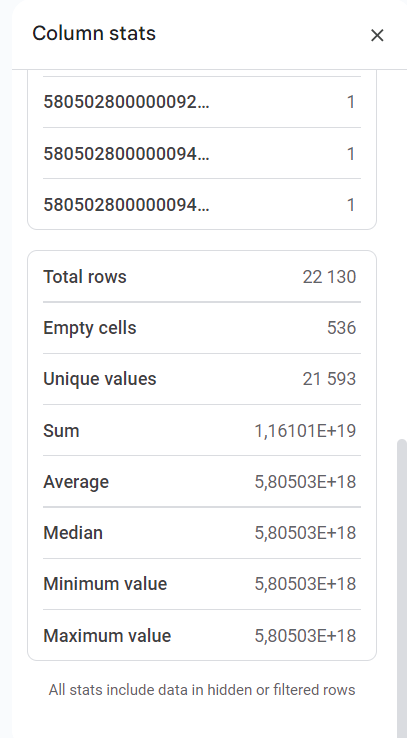

In [ ]:
#  Re-displaying the entire dataframe.

deals

,Id,Deal Owner Name,Closing Date,Quality,Stage,Lost Reason,Page,Campaign,SLA,Content,...,Product,Education Type,Created Time,Course duration,Months of study,Initial Amount Paid,Offer Total Amount,Contact Name,City,Level of Deutsch
0,5805028000056864768,Ben Hall,NaT,Unknown,New Lead,Non applicable,/eng/test,03.07.23women,Unknown,v16,...,Unknown,Unknown,2024-06-21 15:30:00,NaN,NaN,0,0,5805028000056849408,Unknown,Unknown
1,5805028000056859648,Ulysses Adams,NaT,Unknown,New Lead,Non applicable,/at-eng,Unknown,Unknown,Unknown,...,Web Developer,Morning,2024-06-21 15:23:00,6.0,NaN,0,2000,5805028000056834048,Unknown,Unknown
2,5805028000056832000,Ulysses Adams,2024-06-21,D - Non Target,Lost,Non target,/at-eng,engwien_AT,00:26:43,b1-at,...,Unknown,Unknown,2024-06-21 14:45:00,NaN,NaN,0,0,5805028000056854528,Unknown,Unknown
3,5805028000056823808,Eva Kent,2024-06-21,E - Non Qualified,Lost,Invalid number,/eng,04.07.23recentlymoved_DE,01:00:04,bloggersvideo14com,...,Unknown,Unknown,2024-06-21 13:32:00,NaN,NaN,0,0,5805028000056888320,Unknown,Unknown
4,5805028000056872960,Ben Hall,2024-06-21,D - Non Target,Lost,Non target,/eng,discovery_DE,00:53:12,website,...,Unknown,Unknown,2024-06-21 13:21:00,NaN,NaN,0,0,5805028000056876032,Unknown,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21585,5805028000000969728,Jane Smith,2023-07-04,E - Non Qualified,Lost,Duplicate,eng/digital-marketing,03.07.23women,Unknown,b3,...,Unknown,Unknown,2023-07-04 07:10:00,NaN,NaN,0,0,5805028000000978944,Unknown,Unknown
21586,5805028000000948224,Jane Smith,2023-08-29,B - Medium,Lost,needs time to think,eng/digital-marketing,03.07.23women,Unknown,b3,...,Unknown,Unknown,2023-07-04 07:10:00,NaN,NaN,0,0,5805028000000978944,Unknown,Unknown
21587,5805028000000945152,Jane Smith,2023-08-29,A - High,Lost,Changed Decision,eng/digital-marketing,02.07.23wide_DE,"56 days, 19:01:59",b3,...,Unknown,Unknown,2023-07-03 20:39:00,NaN,NaN,0,0,5805028000000967680,Unknown,Unknown
21588,5805028000000926720,Bob Brown,2023-07-09,D - Non Target,Lost,Does not speak English,eng/digital-marketing,03.07.23women,Unknown,b3,...,Unknown,Unknown,2023-07-03 20:17:00,NaN,NaN,0,0,5805028000000960512,Unknown,Unknown


In [ ]:
# Re-displaying the information to verify that the data types have been changed.

deals.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21590 entries, 0 to 21589
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Id                   21590 non-null  int64         
 1   Deal Owner Name      21590 non-null  object        
 2   Closing Date         14643 non-null  datetime64[ns]
 3   Quality              21590 non-null  object        
 4   Stage                21590 non-null  object        
 5   Lost Reason          21590 non-null  object        
 6   Page                 21590 non-null  object        
 7   Campaign             21590 non-null  object        
 8   SLA                  21590 non-null  object        
 9   Content              21590 non-null  object        
 10  Term                 21590 non-null  object        
 11  Source               21590 non-null  object        
 12  Payment Type         21590 non-null  object        
 13  Product              21590 non-

In [ ]:
# Checking the mean and ranges of the numerical columns. This dataframe contains errors, particularly the first date in 2022, where the closing date is earlier
# than the creation date.

deals.describe()

,Id,Closing Date,Created Time,Course duration,Months of study,Initial Amount Paid,Offer Total Amount,Contact Name
count,2.159000e+04,14643,21590,3587.000000,840.000000,21590.000000,21590.000000,2.159000e+04
mean,5.805028e+18,2024-01-27 17:01:33.669330176,2024-01-27 01:51:24.016674560,10.198495,5.442857,183.284484,1381.830060,5.788627e+18
min,5.805028e+18,2022-10-11 00:00:00,2023-07-03 17:03:00,6.000000,0.000000,0.000000,0.000000,0.000000e+00
25%,5.805028e+18,2023-11-11 00:00:00,2023-11-18 13:33:15,11.000000,3.000000,0.000000,0.000000,5.805028e+18
50%,5.805028e+18,2024-02-07 00:00:00,2024-02-05 08:03:30,11.000000,5.000000,0.000000,0.000000,5.805028e+18
75%,5.805028e+18,2024-04-17 00:00:00,2024-04-13 19:17:30,11.000000,8.000000,0.000000,0.000000,5.805028e+18
max,5.805028e+18,2024-12-11 00:00:00,2024-06-21 15:30:00,11.000000,11.000000,11500.000000,11500.000000,5.805028e+18
std,1.569607e+07,NaN,NaN,1.834681,2.919920,728.453618,3479.501922,3.081333e+17


In [ ]:
# Displaying the medians of the numerical columns.

median_Closing_Date = deals['Closing Date'].median()
median_Created_Time = deals['Created Time'].median()
median_Course_duration = deals['Course duration'].median()
median_Months_of_study = deals['Months of study'].median()
median_Initial_Amount_Paid = deals['Initial Amount Paid'].median()
median_Offer_Total_Amount = deals['Offer Total Amount'].median()
print(f'median_Closing_Date: {median_Closing_Date}')
print(f'median_Created_Time: {median_Created_Time}')
print(f'median_Course_duration: {median_Course_duration}')
print(f'median_Months_of_study: {median_Months_of_study}')
print(f'median_Initial_Amount_Paid: {median_Initial_Amount_Paid}')
print(f'median_Offer_Total_Amount: {median_Offer_Total_Amount}')

median_Closing_Date: 2024-02-07 00:00:00
median_Created_Time: 2024-02-05 08:03:30
median_Course_duration: 11.0
median_Months_of_study: 5.0
median_Initial_Amount_Paid: 0.0
median_Offer_Total_Amount: 0.0


In [ ]:
# Displaying the modes of the numerical columns.

mode_Closing_Date = deals['Closing Date'].mode()
mode_Created_Time = deals['Created Time'].mode()
mode_Course_duration = deals['Course duration'].mode()
mode_Months_of_study = deals['Months of study'].mode()
mode_Initial_Amount_Paid = deals['Initial Amount Paid'].mode()
mode_Offer_Total_Amount = deals['Offer Total Amount'].mode()
print(f'mode_Closing_Date: {mode_Closing_Date}')
print(f'mode_Created_Time: {mode_Created_Time}')
print(f'mode_Course_duration: {mode_Course_duration}')
print(f'mode_Months_of_study: {mode_Months_of_study}')
print(f'mode_Initial_Amount_Paid: {mode_Initial_Amount_Paid}')
print(f'mode_Offer_Total_Amount: {mode_Offer_Total_Amount}')

mode_Closing_Date: 0   2024-04-02
Name: Closing Date, dtype: datetime64[ns]
mode_Created_Time: 0   2024-01-01 21:46:00
Name: Created Time, dtype: datetime64[ns]
mode_Course_duration: 0    11.0
Name: Course duration, dtype: float64
mode_Months_of_study: 0    6.0
Name: Months of study, dtype: float64
mode_Initial_Amount_Paid: 0    0
Name: Initial Amount Paid, dtype: int32
mode_Offer_Total_Amount: 0    0
Name: Offer Total Amount, dtype: int32


In [ ]:
# After displaying the descriptive statistics, I replace nulls with zeros in some columns to make future work easier.

deals['Course duration'] = deals['Course duration'].fillna('0').astype('int32')
deals['Months of study'] = deals['Months of study'].fillna('0').astype('int32')


<ipython-input-111-31cb506fa491>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-111-31cb506fa491>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Removing rows from the table where the deal status is not "Payment Done" and creating a new dataframe.

mask = deals['Stage'] == 'Payment Done'
payment_done_deals = deals.loc[mask].reset_index(drop=True)
payment_done_deals

,Id,Deal Owner Name,Closing Date,Quality,Stage,Lost Reason,Page,Campaign,SLA,Content,...,Product,Education Type,Created Time,Course duration,Months of study,Initial Amount Paid,Offer Total Amount,Contact Name,City,Level of Deutsch
0,5805028000055502848,Eva Kent,2024-06-18,B - Medium,Payment Done,Non applicable,/pl-eng/web-developer,performancemax_wide_AT,14:35:20,_{region_name}_,...,Digital Marketing,Evening,2024-06-15 20:01:00,11,1,500,4500,5805028000055471104,Podskalie,Unknown
1,5805028000055524352,Ben Hall,2024-06-19,A - High,Payment Done,Non applicable,/eng,12.07.2023wide_DE,00:17:25,bloggersvideo11,...,Digital Marketing,Evening,2024-06-15 17:02:00,11,1,500,4500,5805028000055502848,Zinnowitz,Unknown
2,5805028000055524352,Ben Hall,NaT,B - Medium,Payment Done,Non applicable,/eng,Live_DE,00:23:42,b0,...,Web Developer,Morning,2024-06-15 12:20:00,6,1,1000,9000,5805028000055463936,Wolfsburg,B1
3,5805028000054664192,Ben Hall,NaT,D - Non Target,Payment Done,Non applicable,/eng,Unknown,16:31:52,Unknown,...,Web Developer,Morning,2024-06-11 19:39:00,6,1,1000,9000,5805028000054683648,Zwickau,A2
4,5805028000054256640,Quincy Vincent,2024-06-17,B - Medium,Payment Done,Non applicable,/eng,02.07.23wide_DE,00:45:55,bloggersvideo16com,...,Digital Marketing,Morning,2024-06-10 15:33:00,11,1,1000,11000,5805028000054284288,Leinfelden-Echterdingen,B1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853,5805028000002301952,Julia Nelson,2023-07-19,C - Low,Payment Done,Expensive,eng/digital-marketing,performancemax_digitalmarkt_ru_DE,15:24:52,_{region_name}_,...,Web Developer,Morning,2023-07-18 21:11:00,6,2,1000,5000,5805028000002301952,Wolfsburg,B1
854,5805028000001987584,Julia Nelson,2023-07-17,C - Low,Payment Done,Conditions are not suitable,eng/digital-marketing,12.07.2023wide_DE,00:49:16,v3com,...,Digital Marketing,Morning,2023-07-17 18:02:00,11,11,1000,11000,5805028000001985536,-,A2
855,5805028000001885184,Jane Smith,2023-08-31,A - High,Payment Done,Non applicable,eng/digital-marketing,04.07.23recentlymoved_DE,00:13:31,b2,...,Digital Marketing,Morning,2023-07-15 13:27:00,11,11,450,4000,5805028000001880064,Ingolstadt,Unknown
856,5805028000001400832,Oliver Taylor,NaT,B - Medium,Payment Done,Non applicable,eng/digital-marketing,02.07.23wide_DE,02:22:36,b3,...,Digital Marketing,Unknown,2023-07-08 08:56:00,11,8,1000,11500,5805028000001350656,Unknown,Unknown


In [ ]:
# I'd also like to point out that in the new dataframe, there are rows where the payment status is "Payment Done," but the payment amount is missing.
# This discrepancy mainly occurs with one manager.

payment_done_deals_filtered = payment_done_deals[payment_done_deals['Offer Total Amount'] == 0]
payment_done_deals_filtered

,Id,Deal Owner Name,Closing Date,Quality,Stage,Lost Reason,Page,Campaign,SLA,Content,...,Product,Education Type,Created Time,Course duration,Months of study,Initial Amount Paid,Offer Total Amount,Contact Name,City,Level of Deutsch
482,5805028000022036480,Unknown,2023-07-01,E - Non Qualified,Payment Done,Non applicable,/,Unknown,Unknown,Unknown,...,Unknown,Unknown,2023-12-19 10:37:00,0,0,0,0,0,Unknown,Unknown
554,5805028000019344384,John Doe,2024-05-01,E - Non Qualified,Payment Done,Non applicable,/,Unknown,01:56:22,Unknown,...,Unknown,Unknown,2023-12-01 07:51:00,0,0,0,0,0,Unknown,Unknown
612,5805028000017533952,Nina Scott,NaT,C - Low,Payment Done,Non applicable,eng/digital-marketing,work_DE,00:29:32,b14blackfriday,...,Unknown,Unknown,2023-11-17 15:21:00,0,0,0,0,5805028000017544192,Unknown,Unknown
663,5805028000014228480,Kevin Parker,NaT,C - Low,Payment Done,Next stream,/test,Unknown,00:34:42,Unknown,...,Unknown,Unknown,2023-10-29 17:04:00,0,0,0,0,5805028000014215168,Unknown,Unknown
677,5805028000013759488,Kevin Parker,NaT,B - Medium,Payment Done,Next stream,/eng/test,04.07.23recentlymoved_DE,16:58:25,bloggersvideo4com,...,Unknown,Unknown,2023-10-25 21:25:00,0,0,0,0,5805028000013785088,Unknown,Unknown
683,5805028000013172736,Kevin Parker,NaT,D - Non Target,Payment Done,Next stream,eng/digital-marketing,performancemax_digitalmarkt_ru_DE,13:28:40,_{region_name}_,...,Unknown,Unknown,2023-10-21 21:22:00,0,0,0,0,5805028000013175808,Unknown,Unknown
690,5805028000012719104,Kevin Parker,NaT,D - Non Target,Payment Done,Next stream,eng/digital-marketing,03.07.23women,01:06:43,bloggersvideo4com,...,Unknown,Unknown,2023-10-20 09:36:00,0,0,0,0,5805028000012719104,Unknown,Unknown
700,5805028000012017664,Kevin Parker,NaT,B - Medium,Payment Done,Expensive,/eng/ux-ui,Dis_DE,03:46:04,151836595805_{region_name}_673801336999,...,Unknown,Unknown,2023-10-17 08:44:00,0,0,0,0,5805028000012014592,Unknown,Unknown
704,5805028000011624448,Kevin Parker,NaT,C - Low,Payment Done,Next stream,/eng/test,performancemax_digitalmarkt_ru_DE,16:56:50,_{region_name}_,...,Unknown,Unknown,2023-10-15 18:22:00,0,0,0,0,5805028000011741184,Unknown,Unknown
730,5805028000010415104,Kevin Parker,NaT,C - Low,Payment Done,Next stream,eng/digital-marketing,15.07.23b_DE,07:54:19,bloggersvideo5,...,Unknown,Unknown,2023-10-08 11:07:00,0,0,0,0,5805028000010421248,Unknown,Unknown


In [ ]:
# Re-displaying the description of the dataframe containing only "Payment Done" status values.

payment_done_deals.describe()

,Id,Closing Date,Created Time,Course duration,Months of study,Initial Amount Paid,Offer Total Amount,Contact Name
count,8.580000e+02,521,858,858.000000,858.000000,858.000000,858.000000,8.580000e+02
mean,5.805028e+18,2024-02-03 23:29:35.815738880,2024-01-08 15:56:24.965034752,9.970862,5.328671,1140.618881,7374.476690,5.737370e+18
min,5.805028e+18,2023-07-01 00:00:00,2023-07-04 10:11:00,0.000000,0.000000,0.000000,0.000000,0.000000e+00
25%,5.805028e+18,2023-11-28 00:00:00,2023-11-05 21:24:30,11.000000,3.000000,500.000000,3500.000000,5.805028e+18
50%,5.805028e+18,2024-02-12 00:00:00,2024-01-08 09:14:00,11.000000,5.000000,1000.000000,11000.000000,5.805028e+18
75%,5.805028e+18,2024-04-17 00:00:00,2024-03-14 22:17:00,11.000000,8.000000,1000.000000,11000.000000,5.805028e+18
max,5.805028e+18,2024-06-20 00:00:00,2024-06-15 20:01:00,11.000000,11.000000,11500.000000,11500.000000,5.805028e+18
std,1.410846e+07,NaN,NaN,2.340419,2.992662,1476.160103,3865.497724,6.234020e+17


In [ ]:
# Re-displaying the medians of the numerical columns in the reduced dataframe.

new_median_Closing_Date = payment_done_deals['Closing Date'].median()
new_median_Created_Time = payment_done_deals['Created Time'].median()
new_median_Course_duration = payment_done_deals['Course duration'].median()
new_median_Months_of_study = payment_done_deals['Months of study'].median()
new_median_Initial_Amount_Paid = payment_done_deals['Initial Amount Paid'].median()
new_median_Offer_Total_Amount = payment_done_deals['Offer Total Amount'].median()
print(f'median_Closing_Date: {new_median_Closing_Date}')
print(f'median_Created_Time: {new_median_Created_Time}')
print(f'median_Course_duration: {new_median_Course_duration}')
print(f'median_Months_of_study: {new_median_Months_of_study}')
print(f'median_Initial_Amount_Paid: {new_median_Initial_Amount_Paid}')
print(f'median_Offer_Total_Amount: {new_median_Offer_Total_Amount}')

median_Closing_Date: 2024-02-12 00:00:00
median_Created_Time: 2024-01-08 09:14:00
median_Course_duration: 11.0
median_Months_of_study: 5.0
median_Initial_Amount_Paid: 1000.0
median_Offer_Total_Amount: 11000.0


In [ ]:
# Re-displaying the modes of the numerical columns in the reduced dataframe.

new_mode_Closing_Date = payment_done_deals['Closing Date'].mode()
new_mode_Created_Time = payment_done_deals['Created Time'].mode()
new_mode_Course_duration = payment_done_deals['Course duration'].mode()
new_mode_Months_of_study = payment_done_deals['Months of study'].mode()
new_mode_Initial_Amount_Paid = payment_done_deals['Initial Amount Paid'].mode()
new_mode_Offer_Total_Amount = payment_done_deals['Offer Total Amount'].mode()
print(f'mode_Closing_Date: {new_mode_Closing_Date}')
print(f'mode_Created_Time: {new_mode_Created_Time}')
print(f'mode_Course_duration: {new_mode_Course_duration}')
print(f'mode_Months_of_study: {new_mode_Months_of_study}')
print(f'mode_Initial_Amount_Paid: {new_mode_Initial_Amount_Paid}')
print(f'mode_Offer_Total_Amount: {new_mode_Offer_Total_Amount}')

mode_Closing_Date: 0   2024-04-30
Name: Closing Date, dtype: datetime64[ns]
mode_Created_Time: 0   2024-01-01 21:46:00
Name: Created Time, dtype: datetime64[ns]
mode_Course_duration: 0    11
Name: Course duration, dtype: int32
mode_Months_of_study: 0    6
Name: Months of study, dtype: int32
mode_Initial_Amount_Paid: 0    1000
Name: Initial Amount Paid, dtype: int32
mode_Offer_Total_Amount: 0    11000
Name: Offer Total Amount, dtype: int32


In [ ]:
fig = px.histogram(deals, x='Created Time', nbins=100, title='Amount of Deals by Time', template='plotly_white')
fig.update_layout(xaxis_title='Created Time', yaxis_title='Amount of Deals', bargap=0.1)
fig.show()

# Created a histogram of contract creation dates for the full dataframe. As with calls, there's a drop in the number of contracts during the Christmas holidays.
# There's also a drop at the end of Spring, though the reason is unknown.

In [ ]:
fig = px.histogram(deals, x='Closing Date', nbins=100, title='Amount of Closing Deals by Time', template='plotly_white')
fig.update_layout(xaxis_title='Closing Date', yaxis_title='Amount of Closing Deals', bargap=0.1)
fig.show()

# Created a histogram of contract closings. Noticed some outliers, which will be handled in the analysis below. As with calls, we see a drop in contract
# creation during the Christmas holidays and a slight drop at the end of Spring.

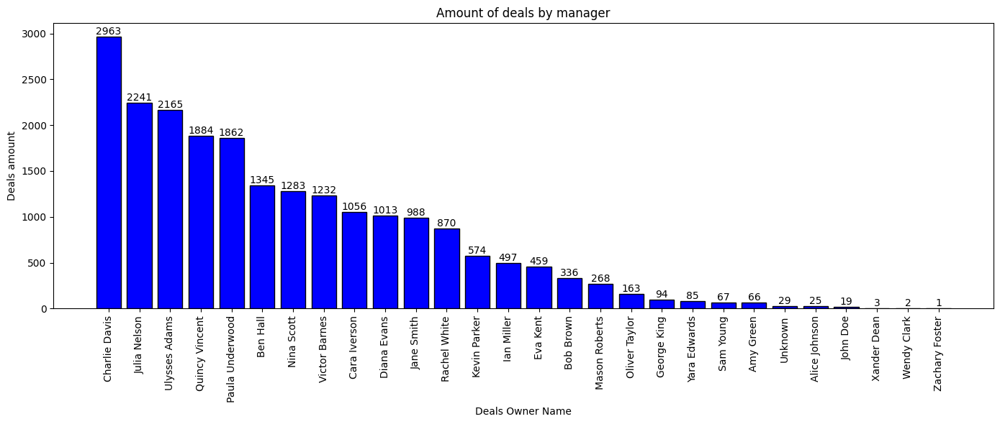

In [ ]:
deals_by_manager = deals['Deal Owner Name'].value_counts()

plt.figure(figsize=(14, 6))

bars = plt.bar(deals_by_manager.index, deals_by_manager.values, color='blue', edgecolor='black')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

plt.title('Amount of deals by manager')
plt.xlabel('Deals Owner Name')
plt.ylabel('Deals amount')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Total number of deals by manager. Paying attention to familiar names, especially Yara Edwards & John Doe, who have the fewest contracts. There may be a pattern
# related to their responsibilities, which I'm unaware of.

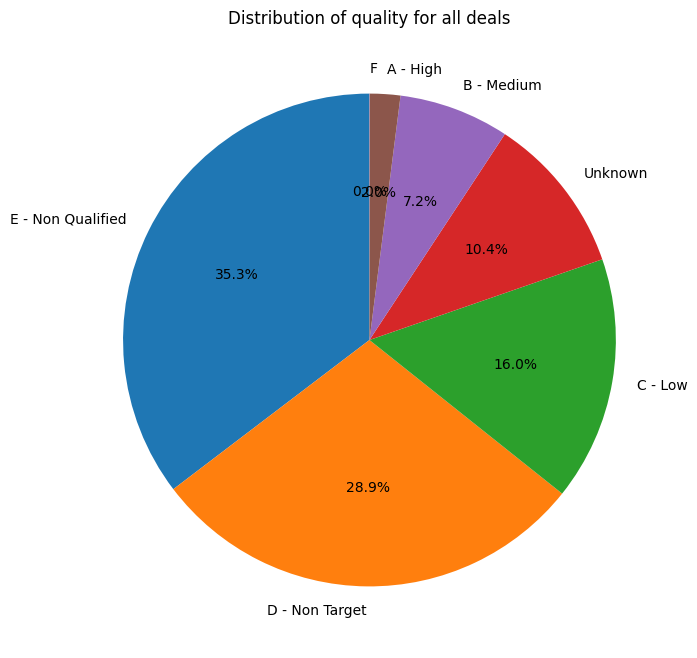

In [ ]:
deals_quality = deals['Quality'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(deals_quality, labels=deals_quality.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of quality for all deals')
plt.show()

# Created a pie chart based on the "Quality" column. From this chart, we can see that a large number of deals involve clients who aren't our target audience or are
# of low quality (the description is vague, so it's hard to understand the purpose of this column). I will conduct further analysis below, focusing only on deals where
# payment has been made to determine whether we need to reevaluate our target audience or adjust the quality of our deals.

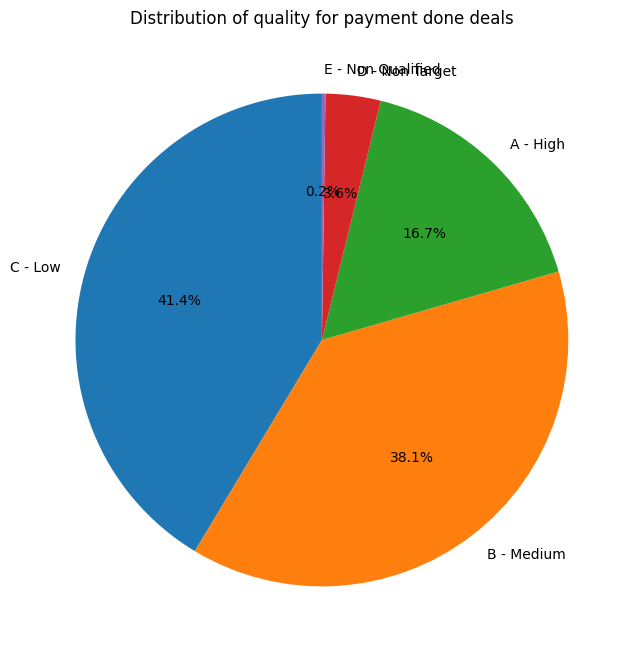

In [ ]:
deals_payment_done_quality = payment_done_deals['Quality'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(deals_payment_done_quality, labels=deals_payment_done_quality.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of quality for payment done deals')
plt.show()

# Yes, predominantly, the quality of our target audience or deals doesn't align with our understanding of high quality, which is a concern.

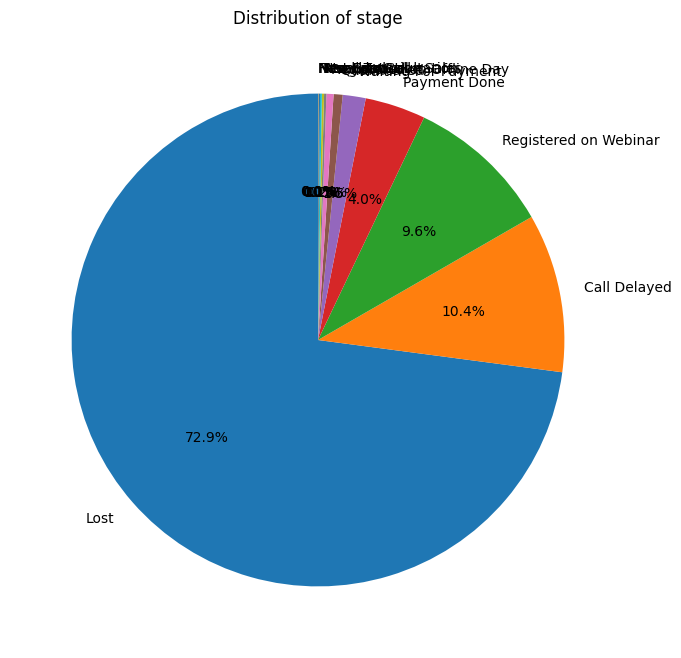

In [ ]:
deals_stage = deals['Stage'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(deals_stage, labels=deals_stage.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of stage')
plt.show()

# Created a pie chart based on the "Status" column. The data isn't very legible, but I kept the chart as it shows clearly that 72% are lost clients.

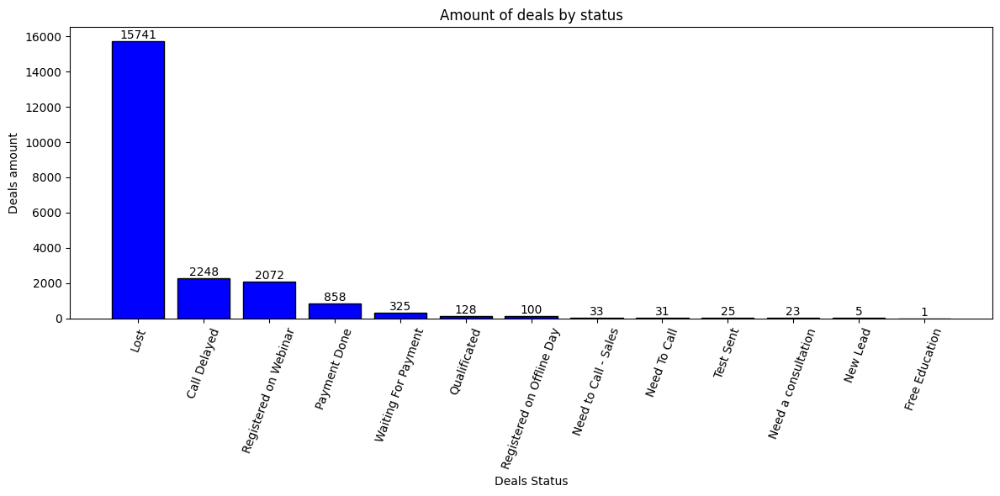

In [ ]:
deals_status = deals['Stage'].value_counts()

plt.figure(figsize=(12, 6))
bars_s = plt.bar(deals_status.index, deals_status.values, color='blue', edgecolor='black')

for bar in bars_s:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.title('Amount of deals by status')
plt.xlabel('Deals Status')
plt.ylabel('Deals amount')
plt.xticks(rotation=70)
plt.tight_layout()
plt.show()

# The same data as above, but in bar form for better visualization.

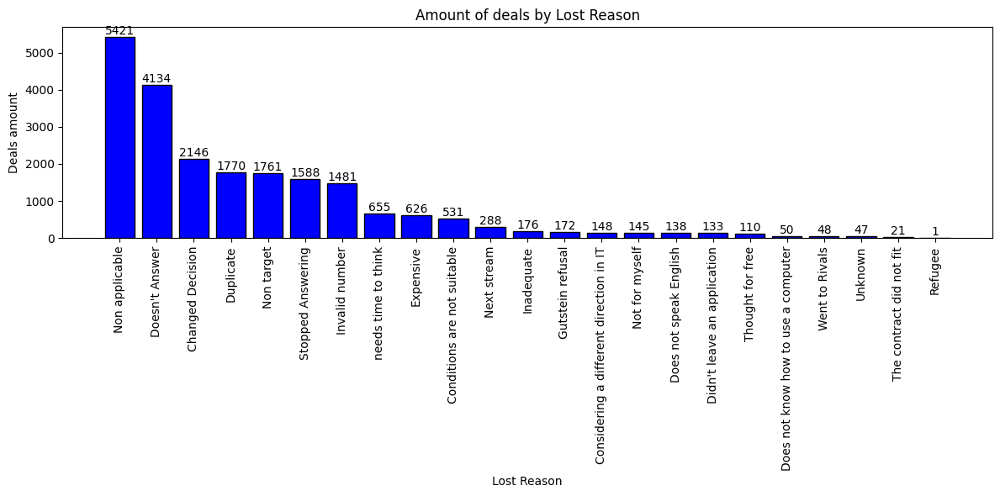

In [ ]:
deals_l_reason = deals['Lost Reason'].value_counts()

plt.figure(figsize=(12, 6))
bars_r = plt.bar(deals_l_reason.index, deals_l_reason.values, color='blue', edgecolor='black')

for bar in bars_r:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.title('Amount of deals by Lost Reason')
plt.xlabel('Lost Reason')
plt.ylabel('Deals amount')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# The reasons for client loss in numbers. "Non-applicable" refers to those whose status isn't "Lost," and thus, there's no reason provided. From the chart, we can
# see that the main reason for client loss is that they stopped responding or changed their decision.

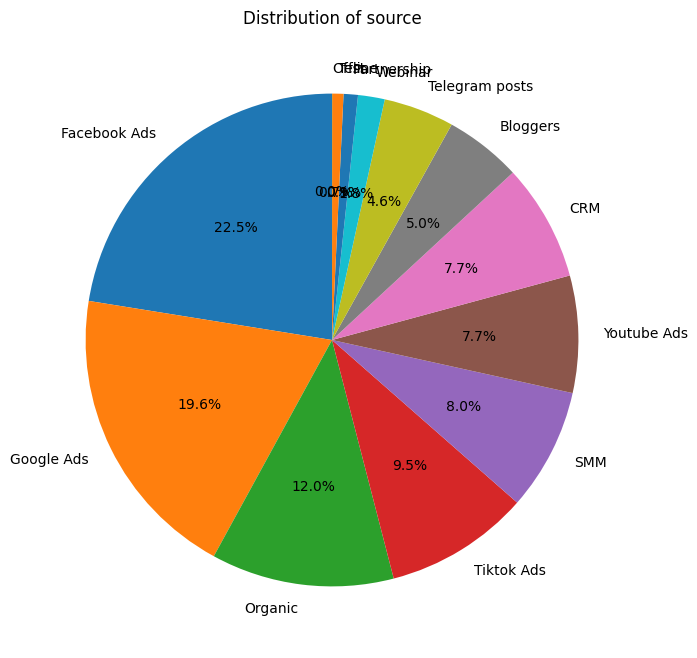

In [ ]:
deals_source = deals['Source'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(deals_source, labels=deals_source.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of source')
plt.show()

# Client sources in percentages. The chart shows that the majority of clients come from Google and Facebook. The small percentages and poor legibility prompted me to
# repeat it in bars below.

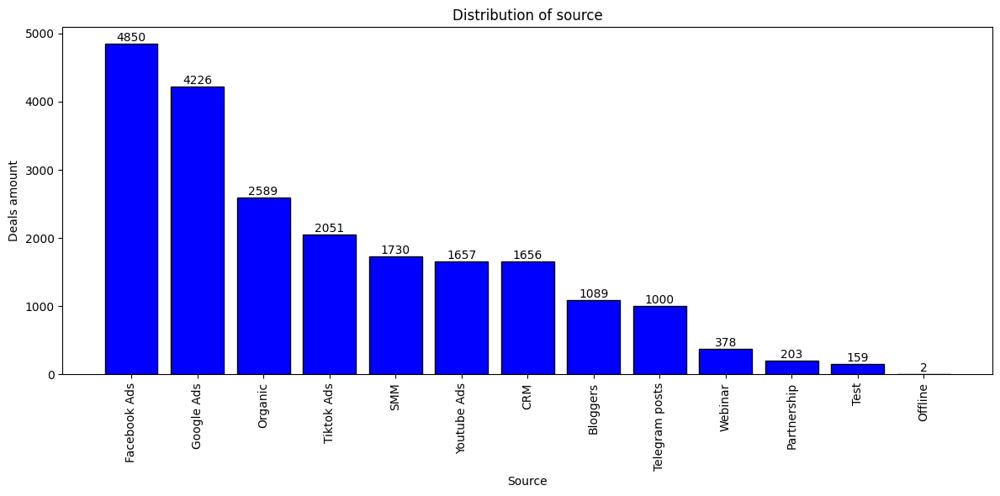

In [ ]:
plt.figure(figsize=(12, 6))
bars_r = plt.bar(deals_source.index, deals_source.values, color='blue', edgecolor='black')

for bar in bars_r:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.title('Distribution of source')
plt.xlabel('Source')
plt.ylabel('Deals amount')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# The same data as the chart above, but in bar form. Webinars and partnerships bring in the fewest clients.

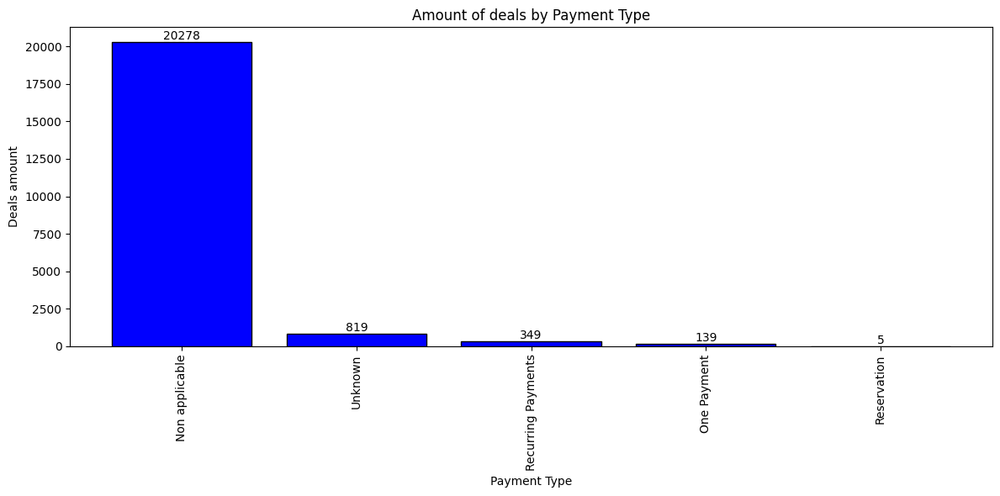

In [ ]:
deals_p_type = deals['Payment Type'].value_counts()

plt.figure(figsize=(12, 6))
bars_r = plt.bar(deals_p_type.index, deals_p_type.values, color='blue', edgecolor='black')

for bar in bars_r:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.title('Amount of deals by Payment Type')
plt.xlabel('Payment Type')
plt.ylabel('Deals amount')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Number of contracts by payment type. "Non-applicable" refers to those who didn't make a payment. Most clients prefer to pay monthly or in installments.

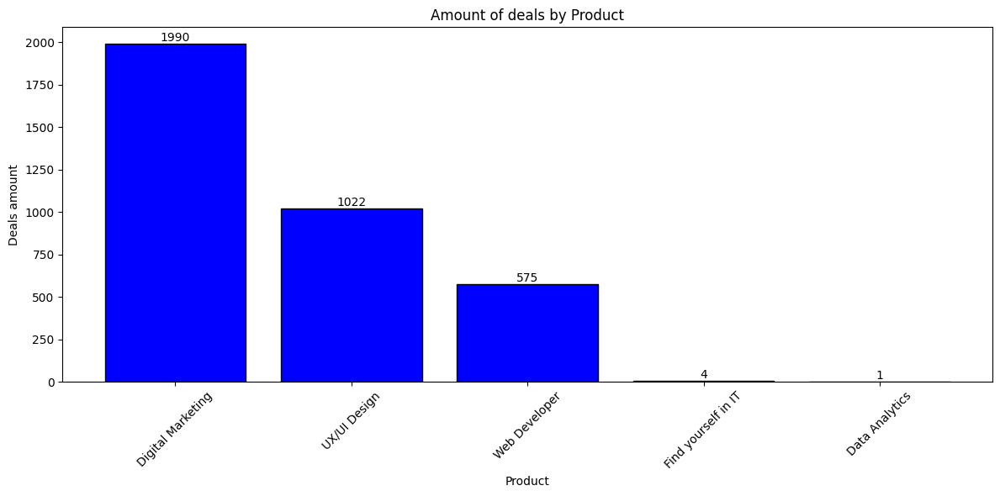

In [ ]:
deals_prod = deals[deals['Product'] != 'Unknown']['Product'].value_counts()

plt.figure(figsize=(12, 6))
bars_r = plt.bar(deals_prod.index, deals_prod.values, color='blue', edgecolor='black')

for bar in bars_r:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.title('Amount of deals by Product')
plt.xlabel('Product')
plt.ylabel('Deals amount')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Popularity of courses, after pre-processing missing values, as their presence makes other columns very small. Digital marketing is the leader, while data analytics
# is in low demand.

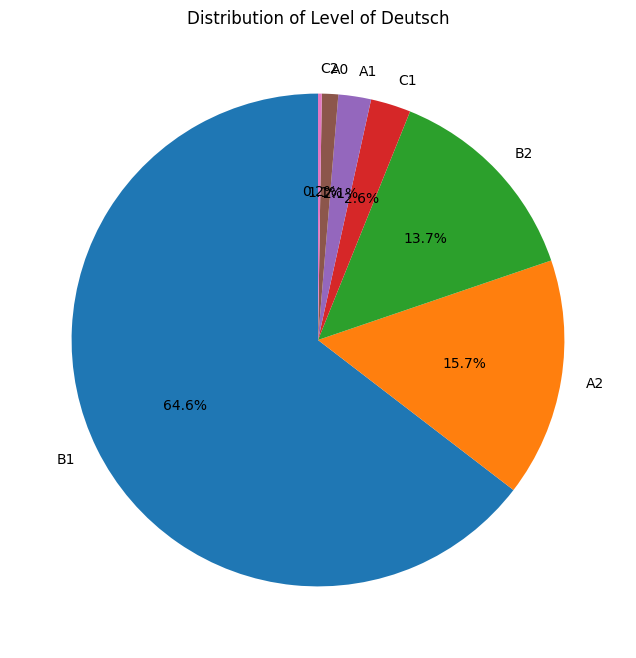

In [ ]:
deals_language = deals[deals['Level of Deutsch'] != 'Unknown']['Level of Deutsch'].value_counts()


plt.figure(figsize=(8, 8))
plt.pie(deals_language, labels=deals_language.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Level of Deutsch')
plt.show()

# Distribution of clients by German language proficiency. Also pre-processed missing values. Most clients have a B1 level of German, suggesting that many recently
# moved to Germany.

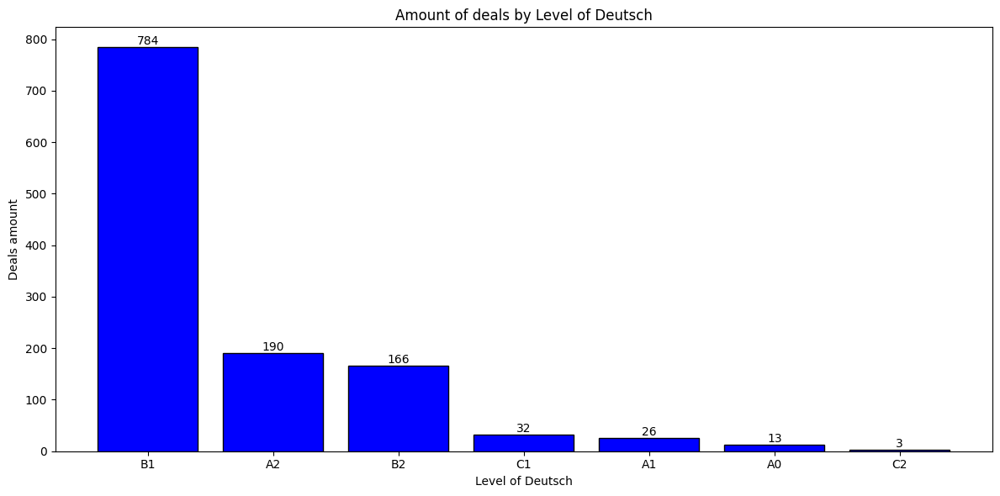

In [ ]:
plt.figure(figsize=(12, 6))
bars_r = plt.bar(deals_language.index, deals_language.values, color='blue', edgecolor='black')

for bar in bars_r:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.title('Amount of deals by Level of Deutsch')
plt.xlabel('Level of Deutsch')
plt.ylabel('Deals amount')
plt.tight_layout()
plt.show()

# Distribution of clients by German language proficiency, the same as above but in numbers rather than percentages. The average level of German proficiency prevails.

In [ ]:
# Downloading the transformed file.

deals.to_excel('cleaned_deals.xlsx', index=False)

In [ ]:
# Downloading the transformed file that contains only deals with "Payment Done" status.

payment_done_deals.to_excel('cleaned_deals_payment_done.xlsx', index=False)

# **Working with the Spend table**



In [ ]:
# Loading the original file

spend = pd.read_excel('/content/Spend (Done).xlsx')
spend

,Date,Source,Campaign,Impressions,Spend,Clicks,AdGroup,Ad
0,2023-07-03,Google Ads,gen_analyst_DE,6,0.00,0,NaN,NaN
1,2023-07-03,Google Ads,performancemax_eng_DE,4,0.01,1,NaN,NaN
2,2023-07-03,Facebook Ads,NaN,0,0.00,0,NaN,NaN
3,2023-07-03,Google Ads,NaN,0,0.00,0,NaN,NaN
4,2023-07-03,CRM,NaN,0,0.00,0,NaN,NaN
...,...,...,...,...,...,...,...,...
20774,2024-06-21,Facebook Ads,17.03.24wide_AT,7,0.07,0,wide,bloggersvideo16com_at
20775,2024-06-21,Tiktok Ads,12.07.2023wide_DE,61,0.16,0,wide,bloggersvideo14com
20776,2024-06-21,Partnership,NaN,0,0.00,0,NaN,NaN
20777,2024-06-21,Tiktok Ads,NaN,0,0.00,0,NaN,NaN


In [ ]:
# Removing duplicates, if any (there were slightly less than 1,000), replacing the indices.

spend = spend.drop_duplicates(ignore_index= True)
spend

,Date,Source,Campaign,Impressions,Spend,Clicks,AdGroup,Ad
0,2023-07-03,Google Ads,gen_analyst_DE,6,0.00,0,NaN,NaN
1,2023-07-03,Google Ads,performancemax_eng_DE,4,0.01,1,NaN,NaN
2,2023-07-03,Facebook Ads,NaN,0,0.00,0,NaN,NaN
3,2023-07-03,Google Ads,NaN,0,0.00,0,NaN,NaN
4,2023-07-03,CRM,NaN,0,0.00,0,NaN,NaN
...,...,...,...,...,...,...,...,...
19857,2024-06-21,Facebook Ads,17.03.24wide_AT,7,0.07,0,wide,bloggersvideo16com_at
19858,2024-06-21,Tiktok Ads,12.07.2023wide_DE,61,0.16,0,wide,bloggersvideo14com
19859,2024-06-21,Partnership,NaN,0,0.00,0,NaN,NaN
19860,2024-06-21,Tiktok Ads,NaN,0,0.00,0,NaN,NaN


In [ ]:
# Displaying information about the dataframe, the number of filled (non-empty) rows, and the column types.
# We see that the dataframe contains only a few nulls.

spend.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19862 entries, 0 to 19861
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         19862 non-null  datetime64[ns]
 1   Source       19862 non-null  object        
 2   Campaign     14785 non-null  object        
 3   Impressions  19862 non-null  int64         
 4   Spend        19862 non-null  float64       
 5   Clicks       19862 non-null  int64         
 6   AdGroup      13951 non-null  object        
 7   Ad           13951 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(2), object(4)
memory usage: 1.2+ MB


In [ ]:
# Total rows in the dataframe: 19,862.
# In the "Campaign" column, the data type is fine, but there are nulls, which I fill with "Unknown."
# In the "Impressions" column, I change the data type to a smaller int.
# In the "Clicks" column, I change the data type to a smaller int.
# In the "AdGroup" column, the data type is fine, but there are nulls, which I fill with "Unknown."
# In the "Ad" column, the data type is fine, but there are nulls, which I fill with "Unknown."

spend['Campaign'] = spend['Campaign'].fillna('Unknown')
spend['Impressions'] = spend['Impressions'].astype('int32')
spend['Clicks'] = spend['Clicks'].astype('int32')
spend['AdGroup'] = spend['AdGroup'].fillna('Unknown')
spend['Ad'] = spend['Ad'].fillna('Unknown')

<ipython-input-137-7d71defff709>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-137-7d71defff709>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-137-7d71defff709>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-137-7d

In [ ]:
# Loading the dataframe and checking the changes.

spend

,Date,Source,Campaign,Impressions,Spend,Clicks,AdGroup,Ad
0,2023-07-03,Google Ads,gen_analyst_DE,6,0.00,0,Unknown,Unknown
1,2023-07-03,Google Ads,performancemax_eng_DE,4,0.01,1,Unknown,Unknown
2,2023-07-03,Facebook Ads,Unknown,0,0.00,0,Unknown,Unknown
3,2023-07-03,Google Ads,Unknown,0,0.00,0,Unknown,Unknown
4,2023-07-03,CRM,Unknown,0,0.00,0,Unknown,Unknown
...,...,...,...,...,...,...,...,...
19857,2024-06-21,Facebook Ads,17.03.24wide_AT,7,0.07,0,wide,bloggersvideo16com_at
19858,2024-06-21,Tiktok Ads,12.07.2023wide_DE,61,0.16,0,wide,bloggersvideo14com
19859,2024-06-21,Partnership,Unknown,0,0.00,0,Unknown,Unknown
19860,2024-06-21,Tiktok Ads,Unknown,0,0.00,0,Unknown,Unknown


In [ ]:
# Re-checking the dataframe information and verifying data type changes.

spend.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19862 entries, 0 to 19861
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         19862 non-null  datetime64[ns]
 1   Source       19862 non-null  object        
 2   Campaign     19862 non-null  object        
 3   Impressions  19862 non-null  int32         
 4   Spend        19862 non-null  float64       
 5   Clicks       19862 non-null  int32         
 6   AdGroup      19862 non-null  object        
 7   Ad           19862 non-null  object        
dtypes: datetime64[ns](1), float64(1), int32(2), object(4)
memory usage: 1.1+ MB


In [ ]:
# Reviewing unique values in the dataframe.

spend.nunique()

,0
Date,355
Source,14
Campaign,52
Impressions,4003
Spend,2859
Clicks,552
AdGroup,25
Ad,177


In [ ]:
# Displaying descriptive statistics for numeric values. The dataframe spans almost a year. The average cost is €7.5, the average number of clicks is 25, and the
# average advertising reach is 2,571 impressions. The maximum cost is €774, the maximum number of clicks is 2,415, and the maximum reach is 431,445 impressions.

spend.describe()

,Date,Impressions,Spend,Clicks
count,19862,19862.000000,19862.000000,19862.000000
mean,2024-01-10 18:21:55.879568896,2571.695197,7.528117,25.095912
min,2023-07-03 00:00:00,0.000000,0.000000,0.000000
25%,2023-10-09 00:00:00,1.000000,0.000000,0.000000
50%,2024-01-20 00:00:00,82.000000,0.740000,2.000000
75%,2024-04-12 00:00:00,760.750000,6.160000,13.000000
max,2024-06-21 00:00:00,431445.000000,774.000000,2415.000000
std,NaN,11691.227016,27.325150,87.032314


In [ ]:
# Displaying median values.

median_Date = spend['Date'].median()
median_Impressions = spend['Impressions'].median()
median_Spend = spend['Spend'].median()
median_Clicks = spend['Clicks'].median()

print(f'median_Date: {median_Date}')
print(f'median_Impressions: {median_Impressions}')
print(f'median_Spend: {median_Spend}')
print(f'median_Clicks: {median_Clicks}')

median_Date: 2024-01-20 00:00:00
median_Impressions: 82.0
median_Spend: 0.74
median_Clicks: 2.0


In [ ]:
# Displaying mode values.

mode_Date = spend['Date'].mode()
mode_Impressions = spend['Impressions'].mode()
mode_Spend = spend['Spend'].mode()
mode_Clicks = spend['Clicks'].mode()

print(f'mode_Date: {mode_Date}')
print(f'mode_Impressions: {mode_Impressions}')
print(f'mode_Spend: {mode_Spend}')
print(f'mode_Clicks: {mode_Clicks}')


mode_Date: 0   2024-04-15
1   2024-04-25
Name: Date, dtype: datetime64[ns]
mode_Impressions: 0    0
Name: Impressions, dtype: int32
mode_Spend: 0    0.0
Name: Spend, dtype: float64
mode_Clicks: 0    0
Name: Clicks, dtype: int32


In [ ]:
fig = px.histogram(spend, x='Date', nbins=100, title='Amount of campaign by Time', template='plotly_white')
fig.update_layout(xaxis_title='Date', yaxis_title='Amount of campaign', bargap=0.1)
fig.show()

# Created a histogram of campaign counts over time. It seems that the number of potential new clients dropped in early summer due to the decrease in the number
# of advertising campaigns.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



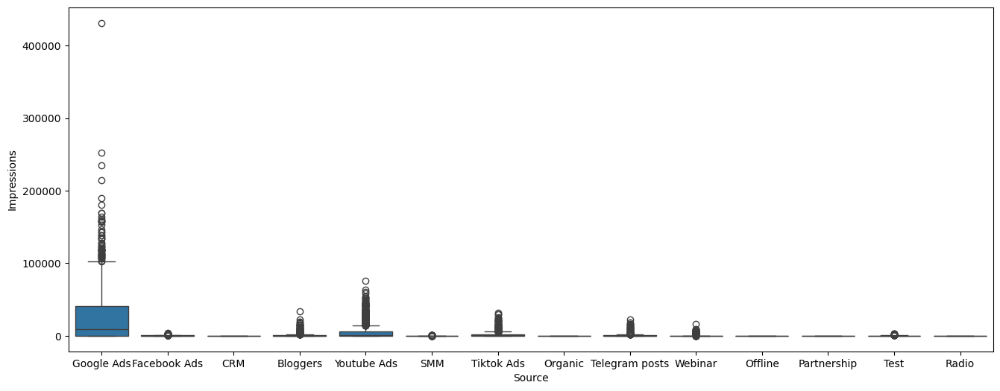

In [ ]:
plt.figure(figsize=(16, 6))
sns.boxplot(data=spend, x='Source', y='Impressions')
plt.show()

# Reviewed "Impressions" by sources. Google Ads is the absolute leader.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



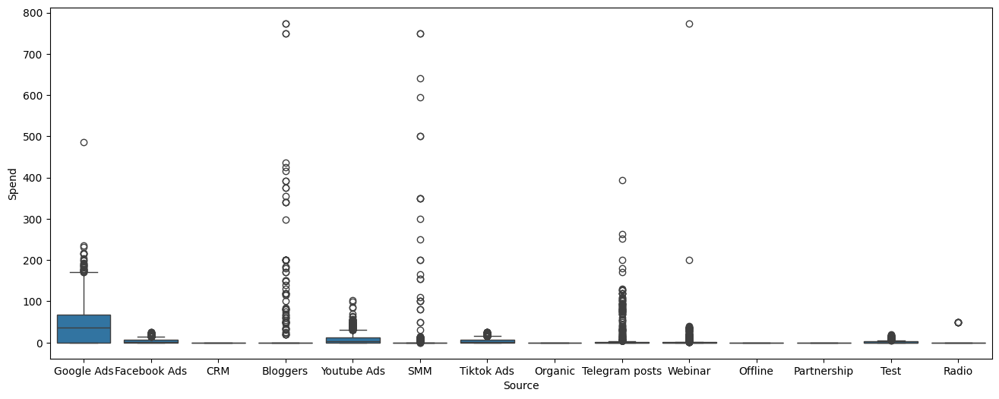

In [ ]:
plt.figure(figsize=(16, 6))
sns.boxplot(data=spend, x='Source', y='Spend')
plt.show()

# Reviewed "Costs" by sources. Google Ads is the leader, but there are significant costs attributed to bloggers, SMM, and webinars, which appear more like outliers.

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning:

SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.



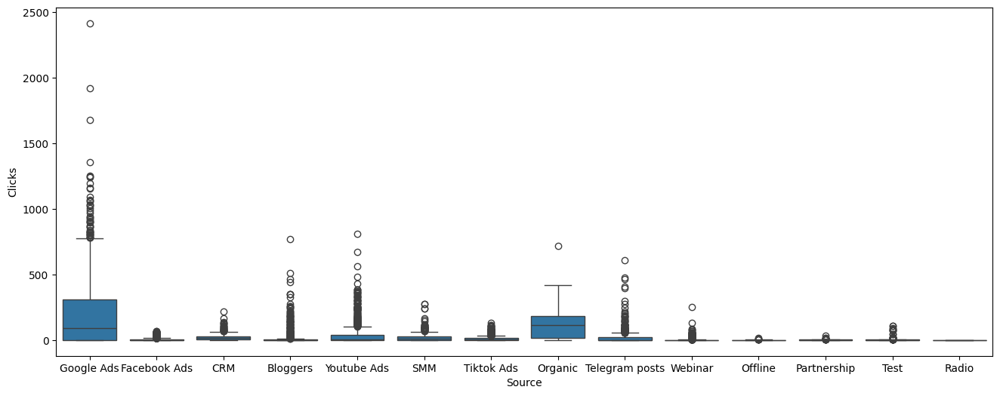

In [ ]:
plt.figure(figsize=(16, 6))
sns.boxplot(data=spend, x='Source', y='Clicks')
plt.show()

# Reviewed "Clicks" by sources. Google Ads is the leader. The cost-per-click for SMM is relatively low compared to bloggers.

In [ ]:
# I don’t use the "Ad" and "AdGroup" columns for analysis, so I delete them.

spend = spend.drop(columns=['AdGroup', 'Ad'])
spend

,Date,Source,Campaign,Impressions,Spend,Clicks
0,2023-07-03,Google Ads,gen_analyst_DE,6,0.00,0
1,2023-07-03,Google Ads,performancemax_eng_DE,4,0.01,1
2,2023-07-03,Facebook Ads,Unknown,0,0.00,0
3,2023-07-03,Google Ads,Unknown,0,0.00,0
4,2023-07-03,CRM,Unknown,0,0.00,0
...,...,...,...,...,...,...
19857,2024-06-21,Facebook Ads,17.03.24wide_AT,7,0.07,0
19858,2024-06-21,Tiktok Ads,12.07.2023wide_DE,61,0.16,0
19859,2024-06-21,Partnership,Unknown,0,0.00,0
19860,2024-06-21,Tiktok Ads,Unknown,0,0.00,0


In [ ]:
# Downloading the transformed dataset.

spend.to_excel('cleaned_spend.xlsx', index=False)

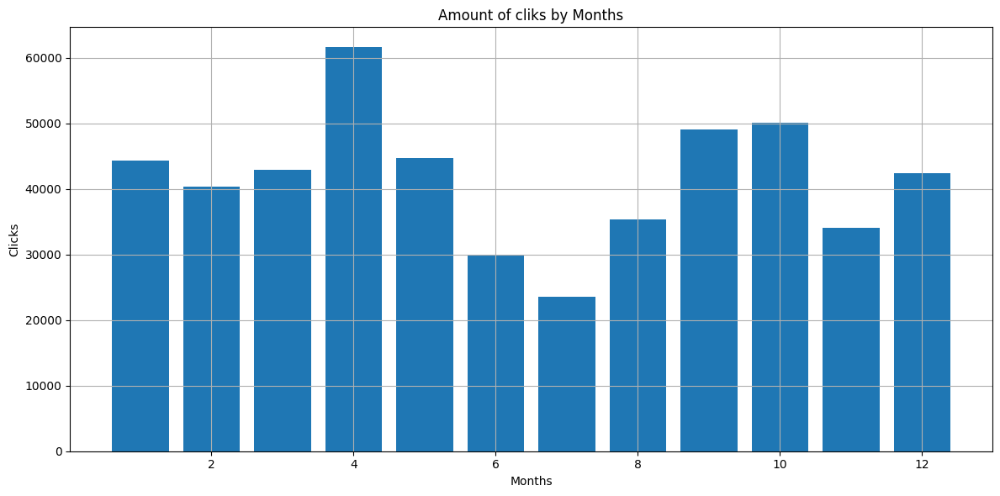

In [ ]:
spend['Month'] = spend['Date'].dt.month

monthly_clicks = spend.groupby('Month')['Clicks'].sum()

plt.figure(figsize=(12, 6))
plt.bar(monthly_clicks.index, monthly_clicks.values)
plt.title('Amount of cliks by Months')
plt.xlabel('Months')
plt.ylabel('Clicks')
plt.grid(True)
plt.tight_layout()
plt.show()

# Decided to check the number of clicks by month (after downloading the dataset, as this column isn't needed for my analysis). In July, the school had just started
# operations, so it’s reasonable that the number of clicks is low.

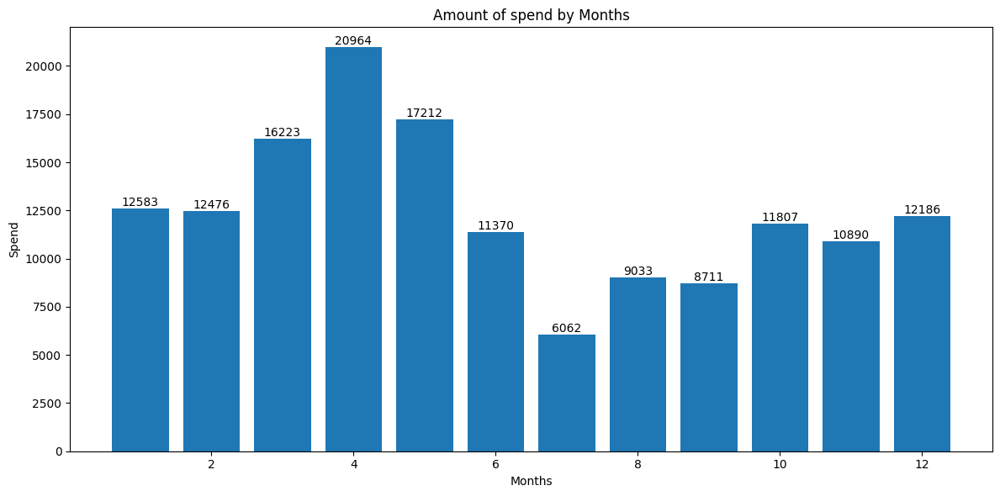

In [ ]:
monthly_spend = spend.groupby('Month')['Spend'].sum()

plt.figure(figsize=(12, 6))
bars_s = plt.bar(monthly_spend.index, monthly_spend.values)

for bar in bars_s:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.title('Amount of spend by Months')
plt.xlabel('Months')
plt.ylabel('Spend')
plt.tight_layout()
plt.show()

# Also reviewed marketing expenses by month, and as expected, marketing costs increased as the school’s activities ramped up.

# **Analysis**

## **Preparation for Analysis**

In [ ]:
# Loading the processed file.

new_calls = pd.read_excel('/content/cleaned_calls.xlsx')
new_calls

,Id,Call Start Time,Call Owner Name,CONTACTID,Call Type,Call Duration (in seconds),Call Status,Outgoing Call Status,Scheduled in CRM
0,5805028000000804864,2023-06-30 08:43:00,John Doe,0,Inbound,171,Received,Type call is not Outbound,Unknown
1,5805028000000768000,2023-06-30 08:46:00,John Doe,0,Outbound,28,Attended Dialled,Completed,NO
2,5805028000000763904,2023-06-30 08:59:00,John Doe,0,Outbound,24,Attended Dialled,Completed,NO
3,5805028000000787456,2023-06-30 09:20:00,John Doe,5805028000000645120,Outbound,6,Attended Dialled,Completed,NO
4,5805028000000768000,2023-06-30 09:30:00,John Doe,5805028000000645120,Outbound,11,Attended Dialled,Completed,NO
...,...,...,...,...,...,...,...,...,...
95869,5805028000056889344,2024-06-21 15:30:00,Ulysses Adams,5805028000056563712,Outbound,6,Attended Dialled,Completed,NO
95870,5805028000056875008,2024-06-21 15:30:00,Victor Barnes,5805028000054866944,Outbound,8,Attended Dialled,Completed,NO
95871,5805028000056832000,2024-06-21 15:30:00,Kevin Parker,5805028000010616832,Outbound,5,Attended Dialled,Completed,NO
95872,5805028000056893440,2024-06-21 15:30:00,Victor Barnes,5805028000056839168,Outbound,0,Unattended Dialled,Completed,NO


Before saving, the dataframe had the following data types.


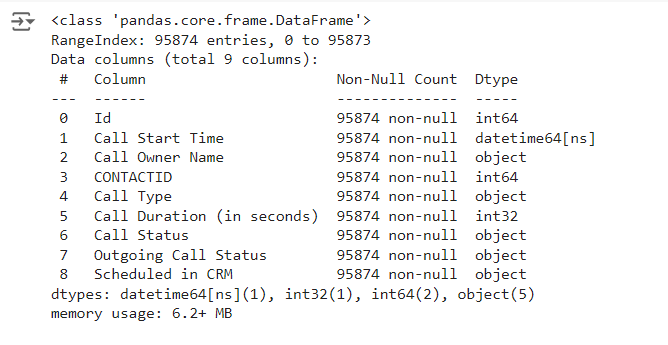

In [ ]:
# Displaying the information to verify if the data types have changed.

new_calls.info()

# Call Duration (in seconds) was changed to int64, but I think we can live with that.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95874 entries, 0 to 95873
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Id                          95874 non-null  int64         
 1   Call Start Time             95874 non-null  datetime64[ns]
 2   Call Owner Name             95874 non-null  object        
 3   CONTACTID                   95874 non-null  int64         
 4   Call Type                   95874 non-null  object        
 5   Call Duration (in seconds)  95874 non-null  int64         
 6   Call Status                 95874 non-null  object        
 7   Outgoing Call Status        95874 non-null  object        
 8   Scheduled in CRM            95874 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(5)
memory usage: 6.6+ MB


In [ ]:
# Loading the processed file.

new_deals = pd.read_excel('/content/cleaned_deals.xlsx')
new_deals

,Id,Deal Owner Name,Closing Date,Quality,Stage,Lost Reason,Page,Campaign,SLA,Content,...,Product,Education Type,Created Time,Course duration,Months of study,Initial Amount Paid,Offer Total Amount,Contact Name,City,Level of Deutsch
0,5805028000056864768,Ben Hall,NaT,Unknown,New Lead,Non applicable,/eng/test,03.07.23women,Unknown,v16,...,Unknown,Unknown,2024-06-21 15:30:00,0,0,0,0,5805028000056849408,Unknown,Unknown
1,5805028000056859648,Ulysses Adams,NaT,Unknown,New Lead,Non applicable,/at-eng,Unknown,Unknown,Unknown,...,Web Developer,Morning,2024-06-21 15:23:00,6,0,0,2000,5805028000056834048,Unknown,Unknown
2,5805028000056832000,Ulysses Adams,2024-06-21,D - Non Target,Lost,Non target,/at-eng,engwien_AT,00:26:43,b1-at,...,Unknown,Unknown,2024-06-21 14:45:00,0,0,0,0,5805028000056854528,Unknown,Unknown
3,5805028000056823808,Eva Kent,2024-06-21,E - Non Qualified,Lost,Invalid number,/eng,04.07.23recentlymoved_DE,01:00:04,bloggersvideo14com,...,Unknown,Unknown,2024-06-21 13:32:00,0,0,0,0,5805028000056888320,Unknown,Unknown
4,5805028000056872960,Ben Hall,2024-06-21,D - Non Target,Lost,Non target,/eng,discovery_DE,00:53:12,website,...,Unknown,Unknown,2024-06-21 13:21:00,0,0,0,0,5805028000056876032,Unknown,Unknown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21585,5805028000000969728,Jane Smith,2023-07-04,E - Non Qualified,Lost,Duplicate,eng/digital-marketing,03.07.23women,Unknown,b3,...,Unknown,Unknown,2023-07-04 07:10:00,0,0,0,0,5805028000000978944,Unknown,Unknown
21586,5805028000000948224,Jane Smith,2023-08-29,B - Medium,Lost,needs time to think,eng/digital-marketing,03.07.23women,Unknown,b3,...,Unknown,Unknown,2023-07-04 07:10:00,0,0,0,0,5805028000000978944,Unknown,Unknown
21587,5805028000000945152,Jane Smith,2023-08-29,A - High,Lost,Changed Decision,eng/digital-marketing,02.07.23wide_DE,56.793044,b3,...,Unknown,Unknown,2023-07-03 20:39:00,0,0,0,0,5805028000000967680,Unknown,Unknown
21588,5805028000000926720,Bob Brown,2023-07-09,D - Non Target,Lost,Does not speak English,eng/digital-marketing,03.07.23women,Unknown,b3,...,Unknown,Unknown,2023-07-03 20:17:00,0,0,0,0,5805028000000960512,Unknown,Unknown


Before saving, the dataframe had the following data types.

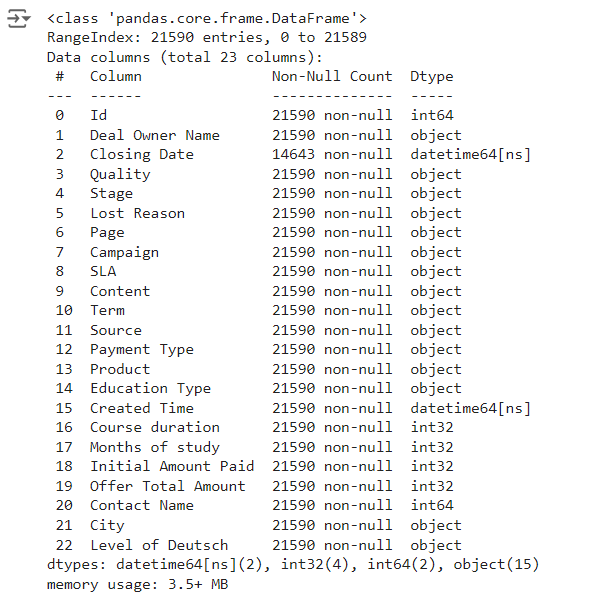

In [ ]:
# Displaying the information to verify if the data types have changed.

new_deals.info()

# All int32 types changed to int64, but I think we can live with that as well.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21590 entries, 0 to 21589
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Id                   21590 non-null  int64         
 1   Deal Owner Name      21590 non-null  object        
 2   Closing Date         14643 non-null  datetime64[ns]
 3   Quality              21590 non-null  object        
 4   Stage                21590 non-null  object        
 5   Lost Reason          21590 non-null  object        
 6   Page                 21590 non-null  object        
 7   Campaign             21590 non-null  object        
 8   SLA                  21590 non-null  object        
 9   Content              21590 non-null  object        
 10  Term                 21590 non-null  object        
 11  Source               21590 non-null  object        
 12  Payment Type         21590 non-null  object        
 13  Product              21590 non-

In [ ]:
# Loading the processed file.

new_deals_payment_done = pd.read_excel('/content/cleaned_deals_payment_done.xlsx')
new_deals_payment_done

,Id,Deal Owner Name,Closing Date,Quality,Stage,Lost Reason,Page,Campaign,SLA,Content,...,Product,Education Type,Created Time,Course duration,Months of study,Initial Amount Paid,Offer Total Amount,Contact Name,City,Level of Deutsch
0,5805028000055502848,Eva Kent,2024-06-18,B - Medium,Payment Done,Non applicable,/pl-eng/web-developer,performancemax_wide_AT,14:35:20,_{region_name}_,...,Digital Marketing,Evening,2024-06-15 20:01:00,11,1,500,4500,5805028000055471104,Podskalie,Unknown
1,5805028000055524352,Ben Hall,2024-06-19,A - High,Payment Done,Non applicable,/eng,12.07.2023wide_DE,00:17:25,bloggersvideo11,...,Digital Marketing,Evening,2024-06-15 17:02:00,11,1,500,4500,5805028000055502848,Zinnowitz,Unknown
2,5805028000055524352,Ben Hall,NaT,B - Medium,Payment Done,Non applicable,/eng,Live_DE,00:23:42,b0,...,Web Developer,Morning,2024-06-15 12:20:00,6,1,1000,9000,5805028000055463936,Wolfsburg,B1
3,5805028000054664192,Ben Hall,NaT,D - Non Target,Payment Done,Non applicable,/eng,Unknown,16:31:52,Unknown,...,Web Developer,Morning,2024-06-11 19:39:00,6,1,1000,9000,5805028000054683648,Zwickau,A2
4,5805028000054256640,Quincy Vincent,2024-06-17,B - Medium,Payment Done,Non applicable,/eng,02.07.23wide_DE,00:45:55,bloggersvideo16com,...,Digital Marketing,Morning,2024-06-10 15:33:00,11,1,1000,11000,5805028000054284288,Leinfelden-Echterdingen,B1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853,5805028000002301952,Julia Nelson,2023-07-19,C - Low,Payment Done,Expensive,eng/digital-marketing,performancemax_digitalmarkt_ru_DE,15:24:52,_{region_name}_,...,Web Developer,Morning,2023-07-18 21:11:00,6,2,1000,5000,5805028000002301952,Wolfsburg,B1
854,5805028000001987584,Julia Nelson,2023-07-17,C - Low,Payment Done,Conditions are not suitable,eng/digital-marketing,12.07.2023wide_DE,00:49:16,v3com,...,Digital Marketing,Morning,2023-07-17 18:02:00,11,11,1000,11000,5805028000001985536,-,A2
855,5805028000001885184,Jane Smith,2023-08-31,A - High,Payment Done,Non applicable,eng/digital-marketing,04.07.23recentlymoved_DE,00:13:31,b2,...,Digital Marketing,Morning,2023-07-15 13:27:00,11,11,450,4000,5805028000001880064,Ingolstadt,Unknown
856,5805028000001400832,Oliver Taylor,NaT,B - Medium,Payment Done,Non applicable,eng/digital-marketing,02.07.23wide_DE,02:22:36,b3,...,Digital Marketing,Unknown,2023-07-08 08:56:00,11,8,1000,11500,5805028000001350656,Unknown,Unknown


In [ ]:
# Loading the processed file.

new_contacts = pd.read_excel('/content/cleaned_contacts.xlsx')
new_contacts

,Id,Contact Owner Name,Created Time,Modified Time
0,5805028000000645120,Rachel White,2023-06-27 11:28:00,2023-12-22 13:34:00
1,5805028000000872448,Charlie Davis,2023-07-03 11:31:00,2024-05-21 10:23:00
2,5805028000000888832,Bob Brown,2023-07-02 22:37:00,2023-12-21 13:17:00
3,5805028000000907264,Bob Brown,2023-07-03 05:44:00,2023-12-29 15:20:00
4,5805028000000939008,Nina Scott,2023-07-04 10:11:00,2024-04-16 16:14:00
...,...,...,...,...
18543,5805028000056889344,Ulysses Adams,2024-06-21 12:11:00,2024-06-21 14:11:00
18544,5805028000056889344,Eva Kent,2024-06-21 13:32:00,2024-06-21 15:32:00
18545,5805028000056892416,Eva Kent,2024-06-21 10:21:00,2024-06-21 12:21:00
18546,5805028000056892416,Yara Edwards,2024-06-21 10:22:00,2024-06-21 12:23:00


Before saving, the dataframe had the following data types.

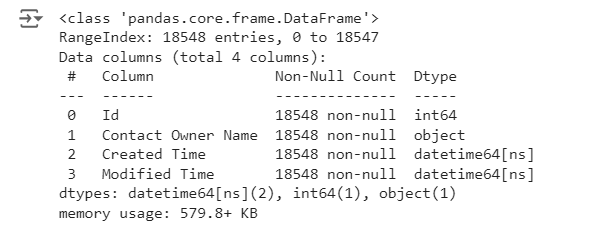

In [ ]:
# Displaying the information to verify if the data types have changed.

new_contacts.info()

# Nothing else has changed.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18548 entries, 0 to 18547
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Id                  18548 non-null  int64         
 1   Contact Owner Name  18548 non-null  object        
 2   Created Time        18548 non-null  datetime64[ns]
 3   Modified Time       18548 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(1)
memory usage: 579.8+ KB


In [ ]:
# Loading the processed file.

new_spend = pd.read_excel('/content/cleaned_spend.xlsx')
new_spend

,Date,Source,Campaign,Impressions,Spend,Clicks
0,2023-07-03,Google Ads,gen_analyst_DE,6,0.00,0
1,2023-07-03,Google Ads,performancemax_eng_DE,4,0.01,1
2,2023-07-03,Facebook Ads,Unknown,0,0.00,0
3,2023-07-03,Google Ads,Unknown,0,0.00,0
4,2023-07-03,CRM,Unknown,0,0.00,0
...,...,...,...,...,...,...
19857,2024-06-21,Facebook Ads,17.03.24wide_AT,7,0.07,0
19858,2024-06-21,Tiktok Ads,12.07.2023wide_DE,61,0.16,0
19859,2024-06-21,Partnership,Unknown,0,0.00,0
19860,2024-06-21,Tiktok Ads,Unknown,0,0.00,0


Before saving, the dataframe had the following data types.

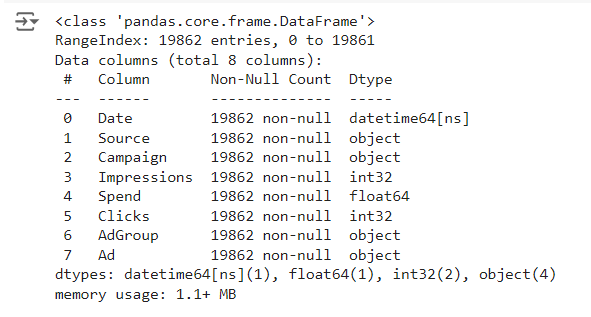

In [ ]:
# Displaying the information to verify if the data types have changed.

new_spend.info()

# All int32 types changed to int64, but I think we can live with that as well.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19862 entries, 0 to 19861
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Date         19862 non-null  datetime64[ns]
 1   Source       19862 non-null  object        
 2   Campaign     19862 non-null  object        
 3   Impressions  19862 non-null  int64         
 4   Spend        19862 non-null  float64       
 5   Clicks       19862 non-null  int64         
dtypes: datetime64[ns](1), float64(1), int64(2), object(2)
memory usage: 931.2+ KB


## **Analyzing the Timelines**

Analyzing the trend of deal creation over time and its relationship with calls.

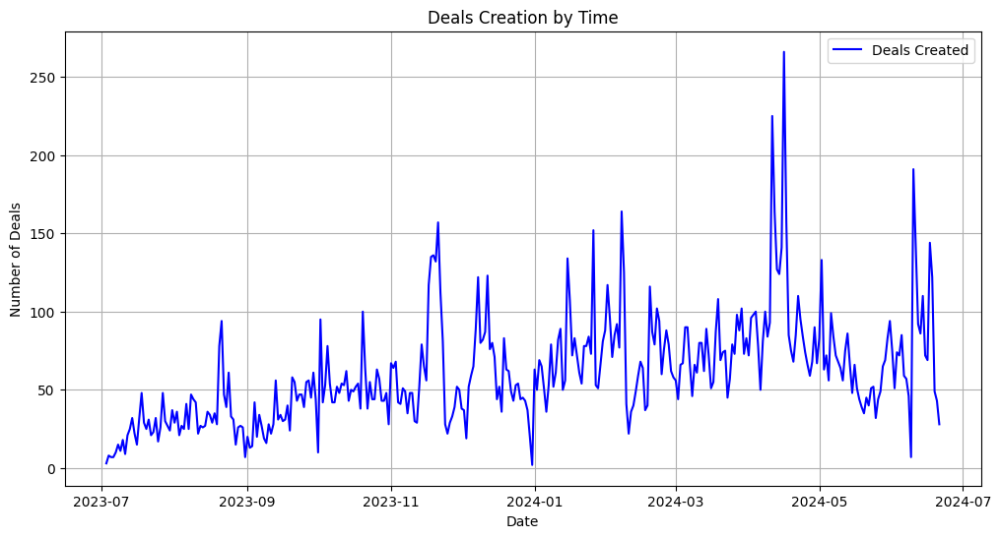

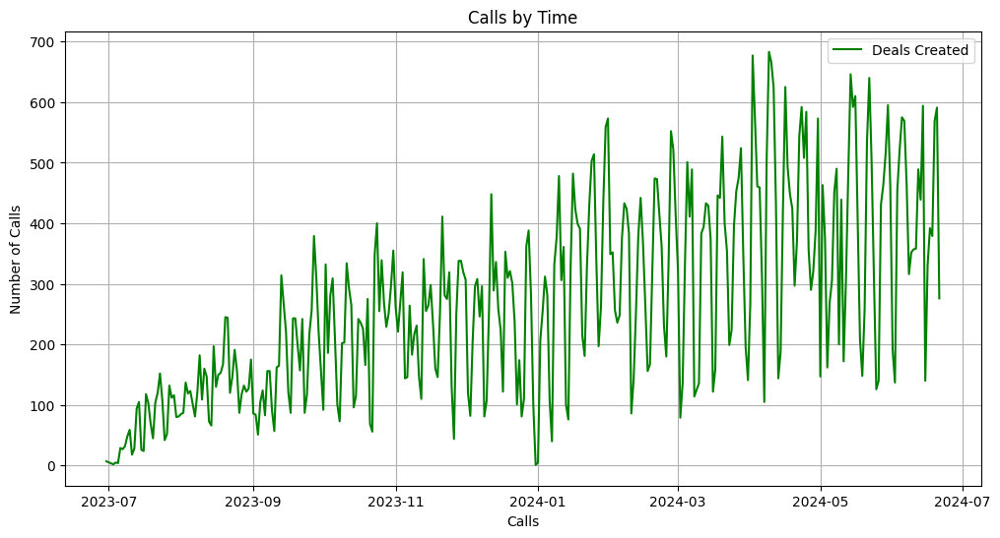

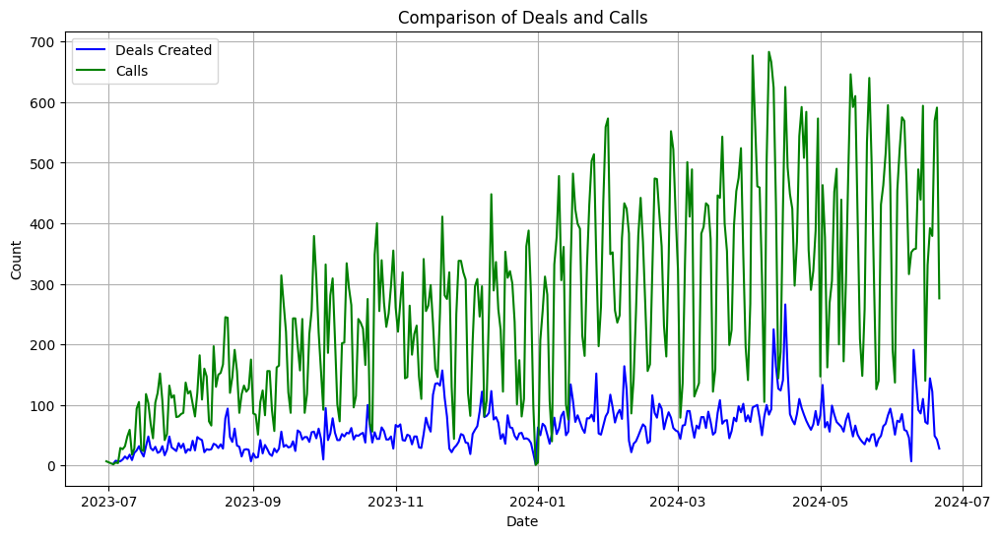

In [ ]:
# Created a Created Date column without the time component for further graph plotting.

new_deals['Created Date'] = pd.to_datetime(new_deals['Created Time']).dt.date
deals_created_by_date = new_deals.groupby('Created Date').size()

# Created a diagram of deal creation over days.

plt.figure(figsize=(12, 6))
plt.plot(deals_created_by_date.index, deals_created_by_date.values, label='Deals Created', color='blue')
plt.title('Deals Creation by Time')
plt.xlabel('Date')
plt.ylabel('Number of Deals')
plt.grid(True)
plt.legend()
plt.show()

# Created a diagram of calls over days.

new_calls['Call Date'] = pd.to_datetime(new_calls['Call Start Time']).dt.date
calls_by_date = new_calls.groupby('Call Date').size()

plt.figure(figsize=(12, 6))
plt.plot(calls_by_date.index, calls_by_date.values, label='Deals Created', color='green')
plt.title('Calls by Time')
plt.xlabel('Calls')
plt.ylabel('Number of Calls')
plt.grid(True)
plt.legend()
plt.show()

# Plotted the relationship between deals and calls over days on the same graph.
plt.figure(figsize=(12, 6))
plt.plot(deals_created_by_date.index, deals_created_by_date.values, label='Deals Created', color='blue')
plt.plot(calls_by_date.index, calls_by_date.values, label='Calls', color='green')
plt.title('Comparison of Deals and Calls')
plt.xlabel('Date')
plt.ylabel('Count')
plt.grid(True)
plt.legend()
plt.show()

# There is a correlation between calls and deals, but occasionally a small delay can be observed.

Study the distribution of deal closing times and the duration between creation and closing.

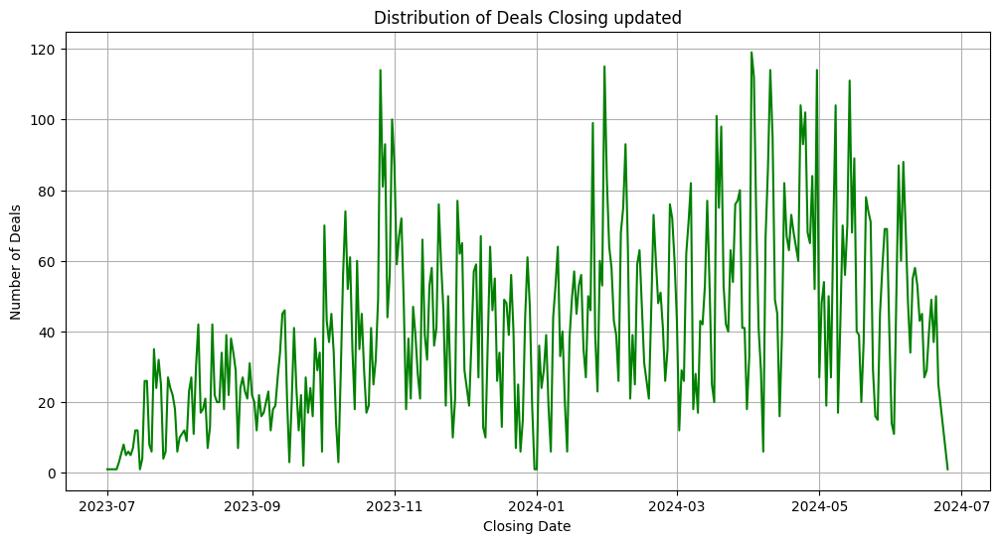

<ipython-input-164-7c2c617bfa03>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



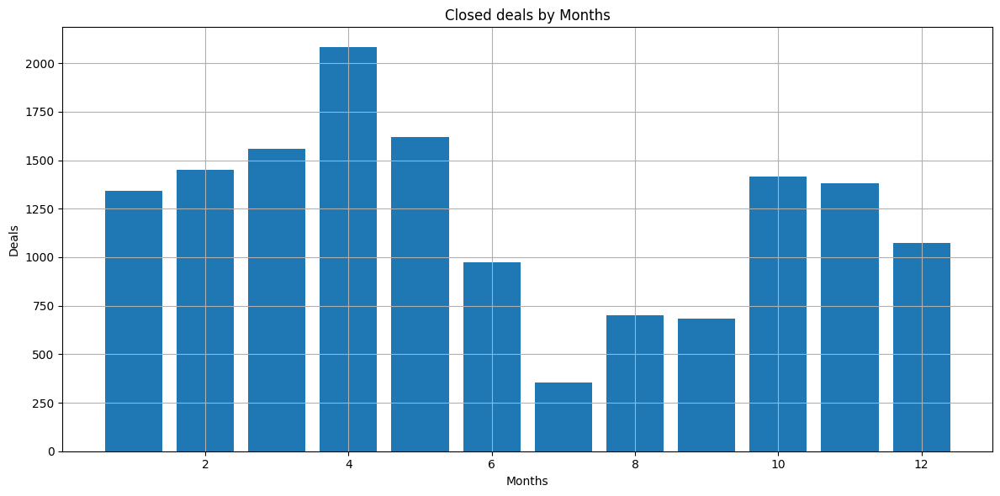

<ipython-input-164-7c2c617bfa03>:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



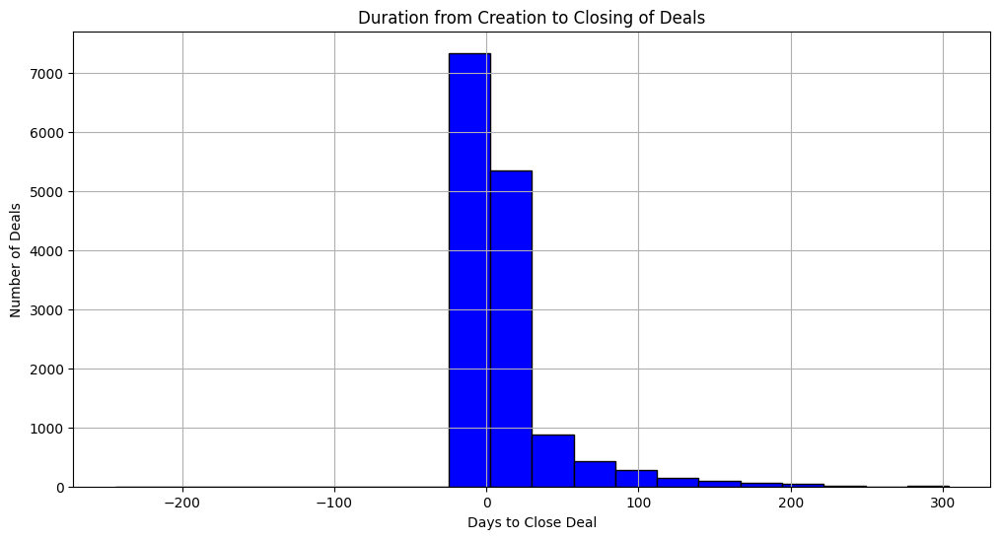

In [ ]:
# Handling date outliers.
start_date = pd.to_datetime('2023-07-01')
end_date = pd.to_datetime('2024-07-01')

# Filtering data based on processed outliers.
filtered_deals = new_deals[(deals['Closing Date'] >= start_date) & (deals['Closing Date'] <= end_date)]

plt.figure(figsize=(12, 6))
deals_closed_by_date = filtered_deals.groupby(filtered_deals['Closing Date'].dt.date).size()
plt.plot(deals_closed_by_date.index, deals_closed_by_date.values, label='Deals Closed', color='green')
plt.title('Distribution of Deals Closing updated')
plt.xlabel('Closing Date')
plt.ylabel('Number of Deals')
plt.grid(True)
plt.show()

# Displaying deal closings by month.
filtered_deals['Month'] = filtered_deals['Closing Date'].dt.month

monthly_close = filtered_deals.groupby('Month').size()

plt.figure(figsize=(12, 6))
plt.bar(monthly_close.index, monthly_close.values)
plt.title('Closed deals by Months')
plt.xlabel('Months')
plt.ylabel('Deals')
plt.grid(True)
plt.tight_layout()
plt.show()

# Analyzing the deal lifecycle duration.

filtered_deals['Duration'] = (filtered_deals['Closing Date'] - filtered_deals['Created Time']).dt.days

plt.figure(figsize=(12, 6))
plt.hist(filtered_deals['Duration'], bins=20, color='blue', edgecolor='black')
plt.title('Duration from Creation to Closing of Deals')
plt.xlabel('Days to Close Deal')
plt.ylabel('Number of Deals')
plt.grid(True)
plt.show()

# Calculating the duration of deals (in days). There were many negative calculated values.

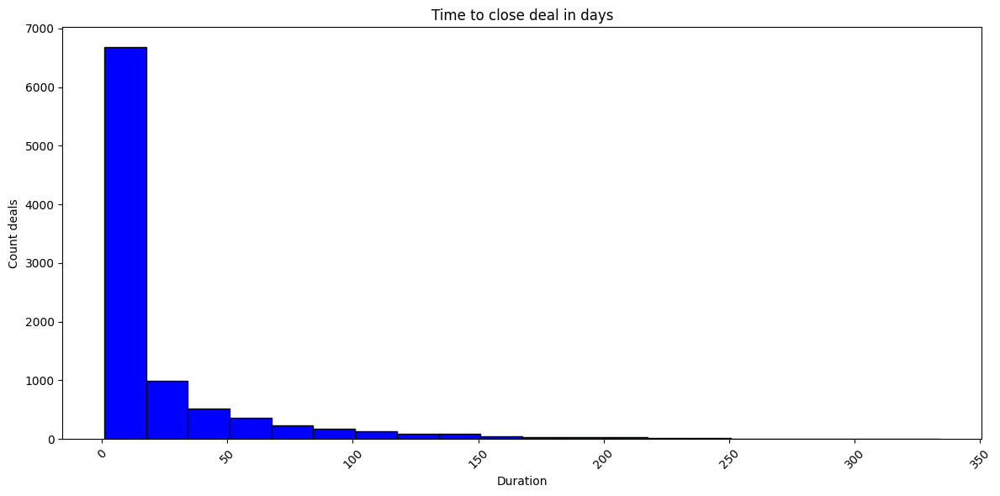

In [ ]:
# Removed rows where the Closing Date is missing and split the Created column into Creation Date and Creation Time. I replaced -1 values for same-day closures with 0.

mask = new_deals['Closing Date'].notna()
new_deals_date = deals.loc[mask].reset_index(drop=True)
new_deals_date['Create Date'] = pd.to_datetime(new_deals_date['Created Time'])
new_deals_date['Create Time'] = new_deals_date['Created Time'].dt.time

new_deals_date['Duration1'] = (new_deals_date['Closing Date'] - new_deals_date['Create Date']).dt.days
new_deals_date['Duration1'] = new_deals_date['Duration1'].apply(lambda x: x if x > 0 else np.nan)

plt.figure(figsize=(12, 6))
plt.hist(new_deals_date['Duration1'], bins=20, color='blue', edgecolor='black')
plt.title('Time to close deal in days')
plt.xlabel('Duration')
plt.ylabel('Count deals')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Calculated the duration of deals (in days). Handled negative values by replacing them with null.

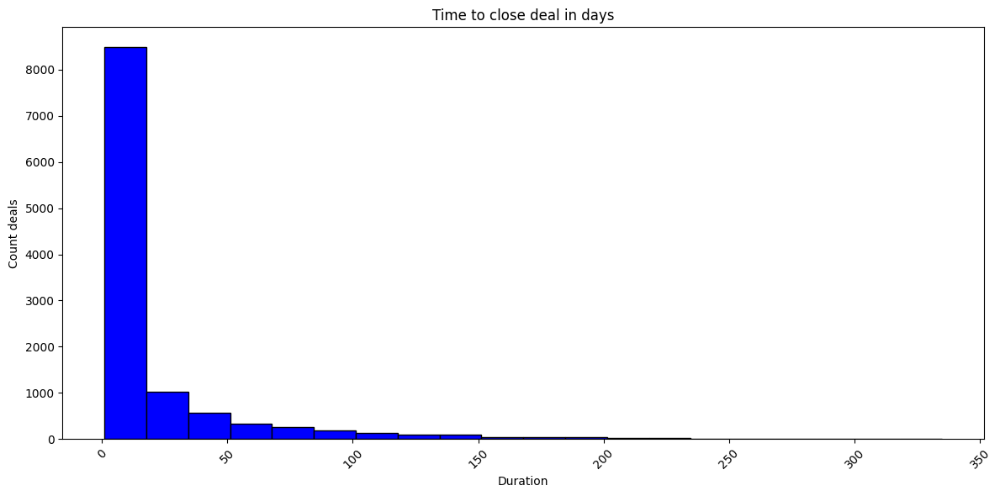

In [ ]:
# Removed rows where Closing Date is missing and split the Created column into Creation Date and Creation Time, forcibly adding a day to the calculated values so that
# same-day closures are displayed as 0 instead of -1.

mask = new_deals['Closing Date'].notna()
new_deals_date_1 = deals.loc[mask].reset_index(drop=True)
new_deals_date_1['Create Date'] = pd.to_datetime(new_deals_date_1['Created Time'])
new_deals_date_1['Create Time'] = new_deals_date_1['Created Time'].dt.time

new_deals_date_1['Duration1'] = (new_deals_date_1['Closing Date'] - new_deals_date_1['Create Date'])+ pd.Timedelta(days=1)
new_deals_date_1['Duration1'] = new_deals_date_1['Duration1'].dt.days
new_deals_date_1['Duration1'] = new_deals_date_1['Duration1'].apply(lambda x: x if x > 0 else np.nan)

plt.figure(figsize=(12, 6))
plt.hist(new_deals_date_1['Duration1'], bins=20, color='blue', edgecolor='black')

plt.title('Time to close deal in days')
plt.xlabel('Duration')
plt.ylabel('Count deals')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Calculated the duration of deals (in days). Handled negative values by adding 1, and if negative values remained, converted them to null.

Got bored and entertained myself with ACF and PACF analysis.

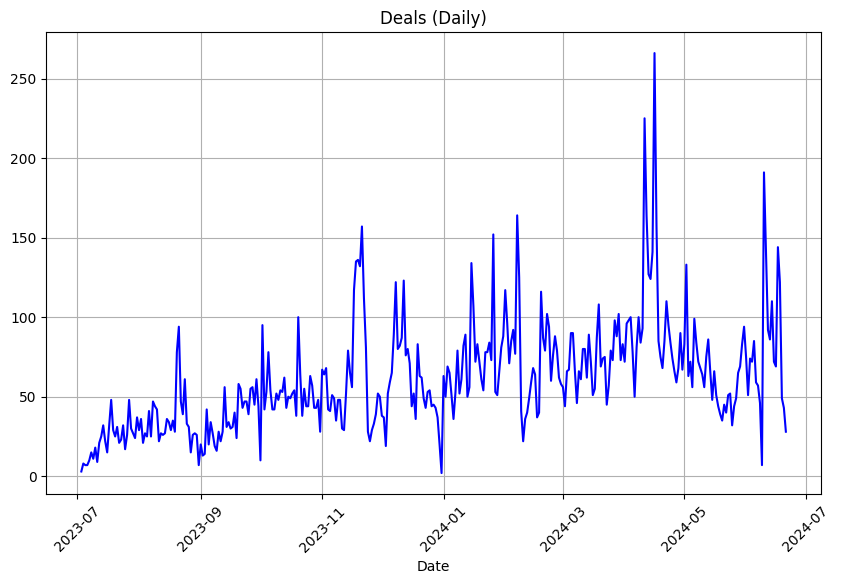

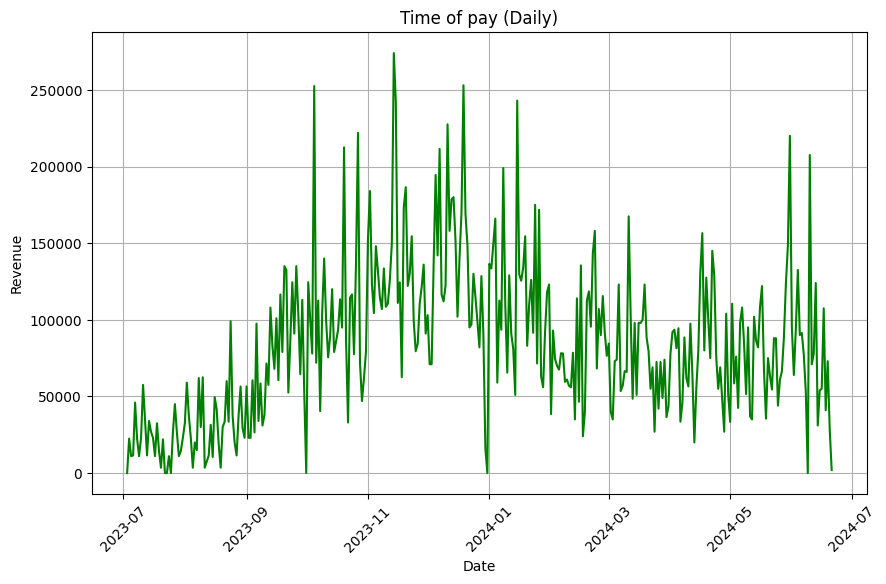

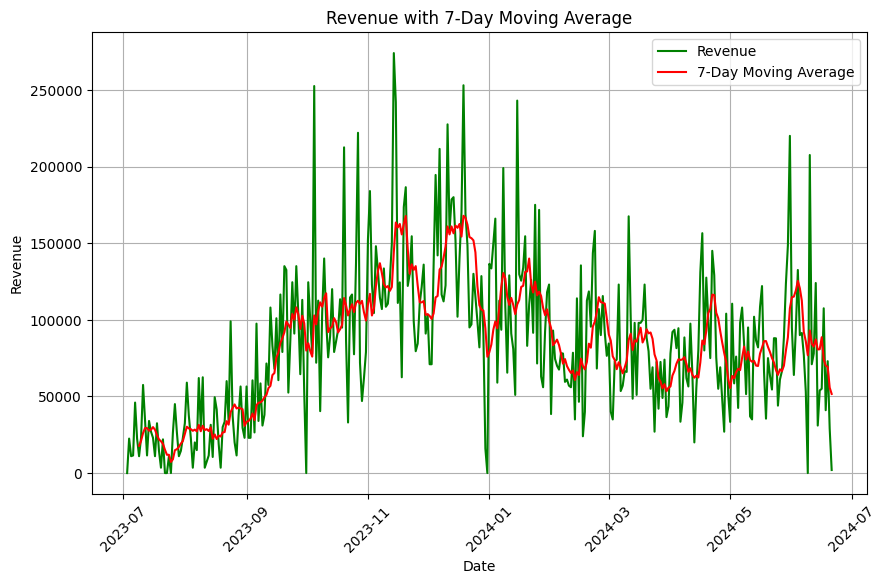

In [ ]:
# Bringing the date column to datetime format, counting deals by Closing Date
new_deals['Created Date'] = pd.to_datetime(new_deals['Created Date'])

daily_deals = deals.groupby(new_deals['Created Date'].dt.date).size()

# Visualized the number of deals by day.
plt.figure(figsize=(10, 6))
plt.plot(daily_deals.index, daily_deals.values, label='Number of Deals', color='blue')
plt.title('Deals (Daily)')
plt.xlabel('Date')
# plt.ylabel('Number of Deals')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# # Analyzed daily revenue. I don’t have payment dates, so I assumed that payments were made on the creation day, even though that might not be correct, but I needed
# some reference.

daily_revenue = deals.groupby(new_deals['Created Date'].dt.date)['Offer Total Amount'].sum()

plt.figure(figsize=(10, 6))
plt.plot(daily_revenue.index, daily_revenue.values, label='Revenue', color='green')
plt.title('Time of pay (Daily)')
plt.xlabel('Date')
plt.ylabel('Revenue')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# Added a moving average to identify the trend.

daily_revenue_average = daily_revenue.rolling(window=7).mean()

plt.figure(figsize=(10, 6))
plt.plot(daily_revenue.index, daily_revenue.values, label='Revenue', color='green')
plt.plot(daily_revenue_average.index, daily_revenue_average.values, label='7-Day Moving Average', color='red')
plt.title('Revenue with 7-Day Moving Average')
plt.xlabel('Date')
plt.ylabel('Revenue')
plt.legend()
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

# Displayed the number of deals per day and daily revenue, adding a moving average to detect trends. The graph shows that the trend is either slowly declining or
# stabilizing. The peak was in December last year, possibly linked to partial government funding restrictions.

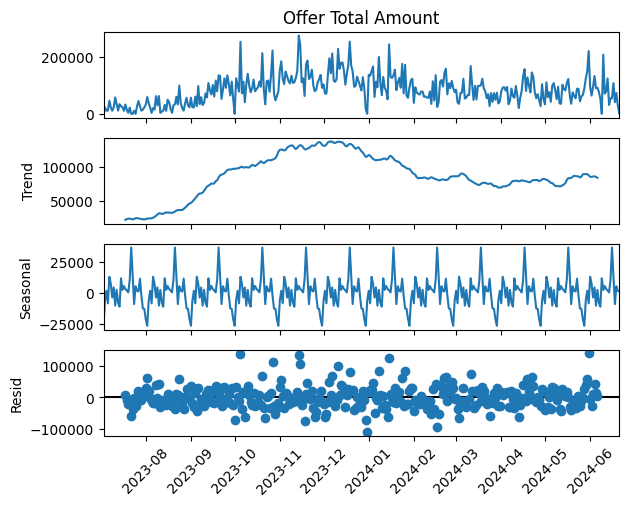

In [ ]:
# Decomposition of the time series into trend and seasonality.

decomposition = seasonal_decompose(daily_revenue, model='additive', period=30)
decomposition.plot()
plt.xticks(rotation=45)
plt.show()

# It’s hard for me to discuss trends and seasonality based on just one year; the decline in revenue since January is most likely caused by government restrictions.

In [ ]:
# Displayed a dataframe of the total number of deals, not just successful ones.

daily_deals

,0
Created Date,
2023-07-03,3
2023-07-04,8
2023-07-05,7
2023-07-06,7
2023-07-07,10
...,...
2024-06-17,144
2024-06-18,122
2024-06-19,49


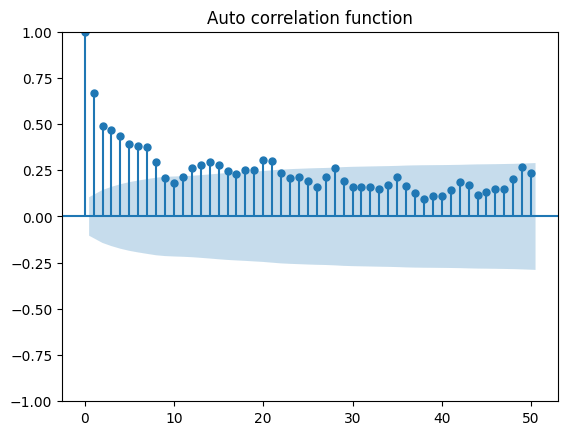

In [ ]:
plot_acf(daily_deals, lags=50)
plt.title('Auto correlation function')
plt.show()

# Built an ACF chart. It’s very interesting, and unsurprisingly, the closer we are to the current moment, the more accurate the forecast.

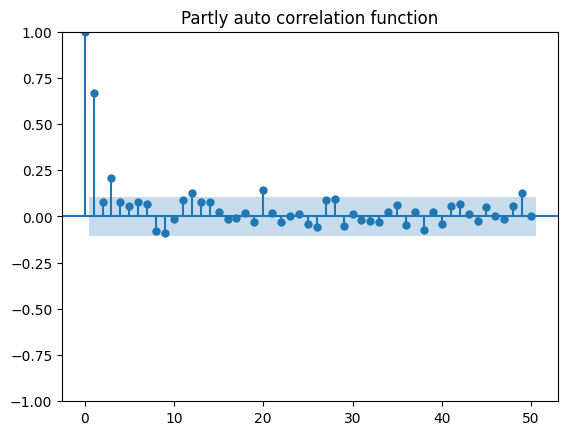

In [ ]:
plot_pacf(daily_deals, lags=50)
plt.title('Partly auto correlation function')
plt.show()

# Built a PACF chart. Similarly, the closer to the present, the more accurate the forecast becomes.

## **Campaign Effectiveness Analysis**

Comparing the effectiveness of different campaigns in terms of lead generation and conversion rate

In [ ]:
# Extracted unique data from the "Campaign" column for analysis.

new_spend['Campaign'].unique()

array(['gen_analyst_DE', 'performancemax_eng_DE', 'Unknown',
       '03.07.23women', '02.07.23wide_DE', '12.07.2023wide_DE',
       '05.07.23interests_DE', '04.07.23recentlymoved_DE',
       '07.07.23LAL_DE', '10.07.23wide_com_DE', '15.07.23b_DE',
       'youtube_shorts_DE', '24.07.2023wide_DE', 'comp_search_DE',
       'brand_search_eng_DE', '02.08.23interests_DE', 'web2408_DE',
       '05.09.2023wide_DE', '12.09.23interests_Uxui_DE', 'discovery_DE',
       '24.09.23retargeting_DE', '18.10.23wide_gos_DE',
       '14.11.23wide_webinar_DE', '15.11.23wide_webinar_DE', 'blog2_DE',
       '30.11.23wide_DE', '07.12.23test_DE', '01.02.24wide_webinar_DE',
       'bbo_DE', '09.02.24berlin_dd_DE', '17.03.24wide_AT',
       '15.03.24recentlymoved_AT', '15.03.2024wide_AT',
       'youtube_shortsin_AT', 'discovery_wide1_AT',
       'performancemax_wide_AT', '20.03.24_widde_PL', '20.03.2024wide_PL',
       '20.03.24interests_WebDev_AT', '20.03.24interests_WebDev_PL',
       'shorts_PL', '1performan

In [ ]:
# Split the campaign column into campaign date and campaign name where applicable, in the "Spend" dataframe.

new_spend['Campaign Date'] = new_spend['Campaign'].str.extract(r'(\d{1,2}\.\d{1,2}\.\d{2,4}|\d{1,2}\.\d{1,2}|\d{4})')
new_spend['Campaign Name'] = new_spend['Campaign'].str.replace(r'(\d{1,2}\.\d{1,2}\.\d{2,4}|\d{1,2}\.\d{1,2}|\d{4})', '', regex=True).str.strip()
new_spend

,Date,Source,Campaign,Impressions,Spend,Clicks,Campaign Date,Campaign Name
0,2023-07-03,Google Ads,gen_analyst_DE,6,0.00,0,NaN,gen_analyst_DE
1,2023-07-03,Google Ads,performancemax_eng_DE,4,0.01,1,NaN,performancemax_eng_DE
2,2023-07-03,Facebook Ads,Unknown,0,0.00,0,NaN,Unknown
3,2023-07-03,Google Ads,Unknown,0,0.00,0,NaN,Unknown
4,2023-07-03,CRM,Unknown,0,0.00,0,NaN,Unknown
...,...,...,...,...,...,...,...,...
19857,2024-06-21,Facebook Ads,17.03.24wide_AT,7,0.07,0,17.03.24,wide_AT
19858,2024-06-21,Tiktok Ads,12.07.2023wide_DE,61,0.16,0,12.07.2023,wide_DE
19859,2024-06-21,Partnership,Unknown,0,0.00,0,NaN,Unknown
19860,2024-06-21,Tiktok Ads,Unknown,0,0.00,0,NaN,Unknown


In [ ]:
# Split the campaign column into campaign date and campaign name where applicable, in the "Deals" dataframe.

new_deals['Campaign Date'] = new_deals['Campaign'].str.extract(r'(\d{1,2}\.\d{1,2}\.\d{2,4}|\d{1,2}\.\d{1,2}|\d{4})')
new_deals['Campaign Name'] = new_deals['Campaign'].str.replace(r'(\d{1,2}\.\d{1,2}\.\d{2,4}|\d{1,2}\.\d{1,2}|\d{4})', '', regex=True).str.strip()
new_deals

,Id,Deal Owner Name,Closing Date,Quality,Stage,Lost Reason,Page,Campaign,SLA,Content,...,Course duration,Months of study,Initial Amount Paid,Offer Total Amount,Contact Name,City,Level of Deutsch,Created Date,Campaign Date,Campaign Name
0,5805028000056864768,Ben Hall,NaT,Unknown,New Lead,Non applicable,/eng/test,03.07.23women,Unknown,v16,...,0,0,0,0,5805028000056849408,Unknown,Unknown,2024-06-21,03.07.23,women
1,5805028000056859648,Ulysses Adams,NaT,Unknown,New Lead,Non applicable,/at-eng,Unknown,Unknown,Unknown,...,6,0,0,2000,5805028000056834048,Unknown,Unknown,2024-06-21,NaN,Unknown
2,5805028000056832000,Ulysses Adams,2024-06-21,D - Non Target,Lost,Non target,/at-eng,engwien_AT,00:26:43,b1-at,...,0,0,0,0,5805028000056854528,Unknown,Unknown,2024-06-21,NaN,engwien_AT
3,5805028000056823808,Eva Kent,2024-06-21,E - Non Qualified,Lost,Invalid number,/eng,04.07.23recentlymoved_DE,01:00:04,bloggersvideo14com,...,0,0,0,0,5805028000056888320,Unknown,Unknown,2024-06-21,04.07.23,recentlymoved_DE
4,5805028000056872960,Ben Hall,2024-06-21,D - Non Target,Lost,Non target,/eng,discovery_DE,00:53:12,website,...,0,0,0,0,5805028000056876032,Unknown,Unknown,2024-06-21,NaN,discovery_DE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21585,5805028000000969728,Jane Smith,2023-07-04,E - Non Qualified,Lost,Duplicate,eng/digital-marketing,03.07.23women,Unknown,b3,...,0,0,0,0,5805028000000978944,Unknown,Unknown,2023-07-04,03.07.23,women
21586,5805028000000948224,Jane Smith,2023-08-29,B - Medium,Lost,needs time to think,eng/digital-marketing,03.07.23women,Unknown,b3,...,0,0,0,0,5805028000000978944,Unknown,Unknown,2023-07-04,03.07.23,women
21587,5805028000000945152,Jane Smith,2023-08-29,A - High,Lost,Changed Decision,eng/digital-marketing,02.07.23wide_DE,56.793044,b3,...,0,0,0,0,5805028000000967680,Unknown,Unknown,2023-07-03,02.07.23,wide_DE
21588,5805028000000926720,Bob Brown,2023-07-09,D - Non Target,Lost,Does not speak English,eng/digital-marketing,03.07.23women,Unknown,b3,...,0,0,0,0,5805028000000960512,Unknown,Unknown,2023-07-03,03.07.23,women


In [ ]:
# Created a new dataframe with aggregated statistics for advertising campaigns, including the number of contracts created per campaign, the number of contracts
# with "payment completed" status, and the conversion rate for each campaign.

leads_by_campaign = new_deals.groupby('Campaign Name').size()

won_deals_by_campaign = new_deals[deals['Stage'] == 'Payment Done'].groupby('Campaign Name').size()

conversion_rate_by_campaign = (won_deals_by_campaign / leads_by_campaign) * 100

income = new_deals[new_deals['Stage'] == 'Payment Done'].groupby('Campaign Name')['Offer Total Amount'].sum()

campaign_deals = pd.DataFrame({
    'Total Leads': leads_by_campaign,
    'Payment Done Deals': won_deals_by_campaign,
    'Conversion Rate (%)': conversion_rate_by_campaign,
    'Income' : income
})

campaign_deals

,Total Leads,Payment Done Deals,Conversion Rate (%),Income
Campaign Name,,,,
1performancemax_wide_PL,261,4.0,1.532567,15000.0
2day_DE,9,NaN,NaN,NaN
ASA_de_DE,112,5.0,4.464286,47500.0
Akademia,7,1.0,14.285714,11500.0
Aussiedler_DE,6,1.0,16.666667,5000.0
...,...,...,...,...
work_wr,6,NaN,NaN,NaN
workingin_DE,48,NaN,NaN,NaN
yo_DE,13,NaN,NaN,NaN


In [ ]:
# Processed null values in the new dataframe and changed the data type for "Payment Done Deals" to integer.

campaign_deals = campaign_deals.fillna(0)
campaign_deals['Payment Done Deals'] = campaign_deals['Payment Done Deals'].astype(int)
campaign_deals['Income'] = campaign_deals['Income'].astype(int)
campaign_deals

,Total Leads,Payment Done Deals,Conversion Rate (%),Income
Campaign Name,,,,
1performancemax_wide_PL,261,4,1.532567,15000
2day_DE,9,0,0.000000,0
ASA_de_DE,112,5,4.464286,47500
Akademia,7,1,14.285714,11500
Aussiedler_DE,6,1,16.666667,5000
...,...,...,...,...
work_wr,6,0,0.000000,0
workingin_DE,48,0,0.000000,0
yo_DE,13,0,0.000000,0


In [ ]:
# Filtered the dataframe to include only data where the conversion rate and total number of clients are greater than zero for accurate analysis.

mask_camp = (campaign_deals['Conversion Rate (%)'] > 0) & (campaign_deals['Total Leads'] > 0)
new_campaign_deals = campaign_deals.loc[mask_camp].reset_index()
new_campaign_deals

,Campaign Name,Total Leads,Payment Done Deals,Conversion Rate (%),Income
0,1performancemax_wide_PL,261,4,1.532567,15000
1,ASA_de_DE,112,5,4.464286,47500
2,Akademia,7,1,14.285714,11500
3,Aussiedler_DE,6,1,16.666667,5000
4,BloggerShina_DE,246,11,4.471545,108000
5,Bloggerel_DE,18,2,11.111111,15000
6,Bloggernina_DE,37,2,5.405405,13000
7,Dis_DE,581,30,5.163511,221500
8,Jobs_germany_DE,7,1,14.285714,3000
9,LAL_DE,542,28,5.166052,243000


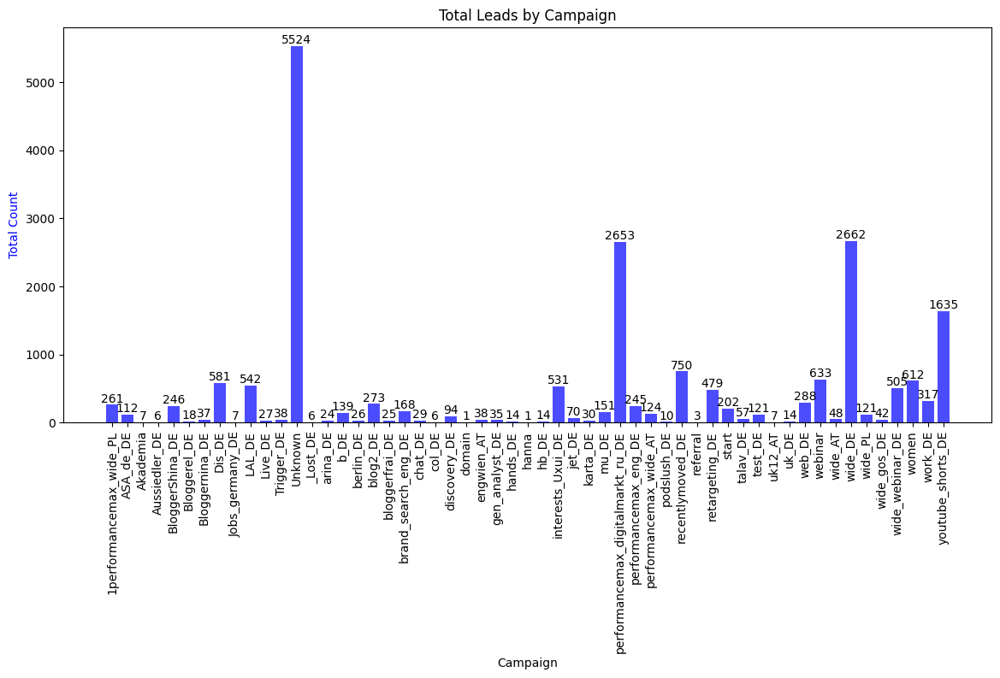

In [ ]:
fig, ax1 = plt.subplots(figsize=(14, 6))

bars = plt.bar(new_campaign_deals['Campaign Name'], new_campaign_deals['Total Leads'], color='blue', label='Total Count', alpha=0.7)
plt.title('Total Leads by Campaign')
plt.xlabel('Campaign')
plt.ylabel('Total Count', color='blue')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

plt.tick_params(axis='x', rotation=90)
plt.show()

# Generated a graph showing the number of clients attracted by various campaigns with numeric values displayed. The largest number of leads came from digitalmarkt,
# wide, and youtube_shorts.

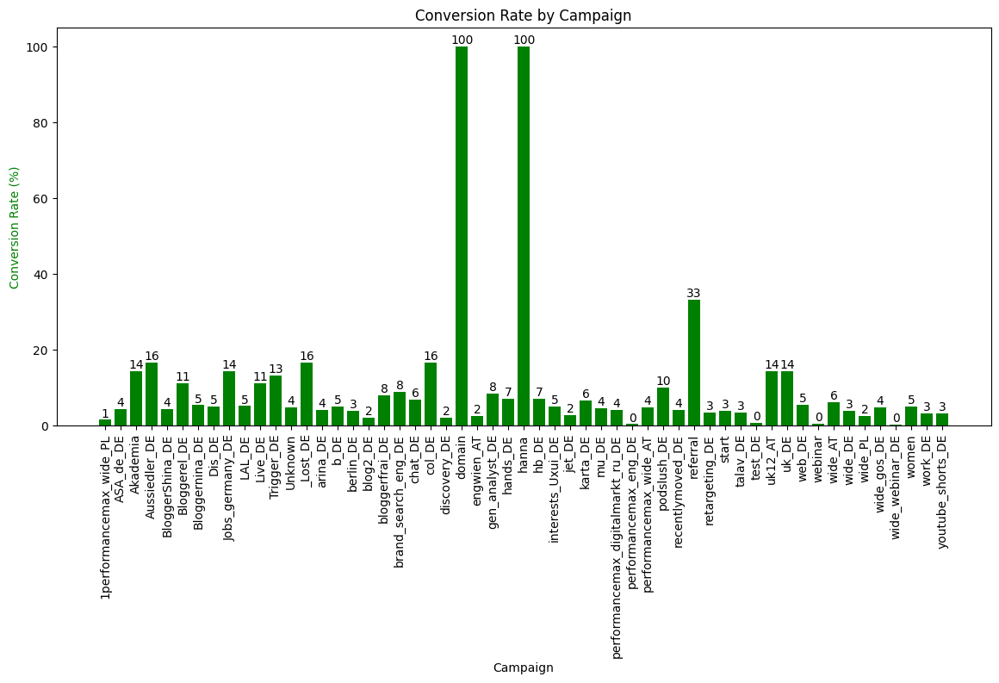

In [ ]:
fig, ax1 = plt.subplots(figsize=(14, 6))

bars = plt.bar(new_campaign_deals['Campaign Name'], new_campaign_deals['Conversion Rate (%)'], color='green', label='Conversion Rate')
plt.title('Conversion Rate by Campaign')
plt.xlabel('Campaign')
plt.ylabel('Conversion Rate (%)', color='green')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

plt.tick_params(axis='x', rotation=90)
plt.show()

# # Created a graph displaying the conversion rates for the campaigns, excluding Hanna and Domain (due to their low impact). Although digitalmarkt, wide, and youtube_shorts
# generate many leads, their conversion rate is lower than average. This is expected, as a large number of leads can often reduce the overall conversion percentage.

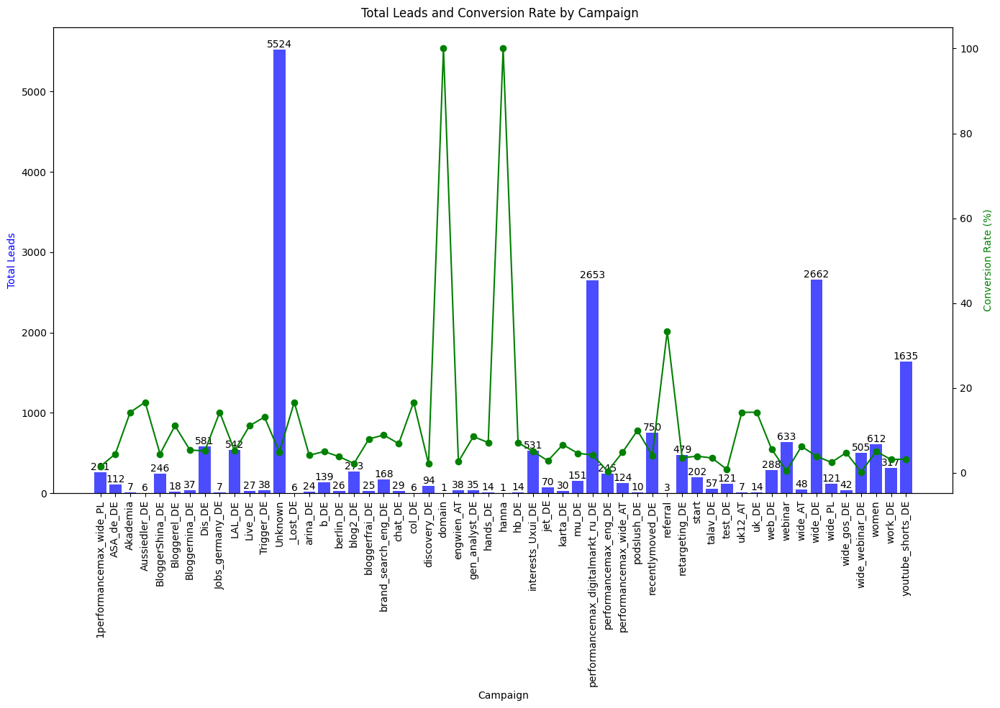

In [ ]:
fig, ax1 = plt.subplots(figsize=(14, 10))

bars = ax1.bar(new_campaign_deals['Campaign Name'], new_campaign_deals['Total Leads'], color='blue', label='Total Count', alpha=0.7)
ax1.set_xlabel('Campaign')
ax1.set_ylabel('Total Leads', color='blue')
ax1.tick_params(axis='x', rotation=90)

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

ax2 = ax1.twinx()
ax2.plot(new_campaign_deals['Campaign Name'], new_campaign_deals['Conversion Rate (%)'], color='green', marker='o', label='Conversion Rate')
ax2.set_ylabel('Conversion Rate (%)', color='green')

fig.suptitle('Total Leads and Conversion Rate by Campaign')
plt.tight_layout()
plt.show()

# Visualized a graph with lead generation by campaigns, focusing solely on the volume of leads without displaying conversion values to avoid overloading the graph
# with numeric labels.

Evaluating the effectiveness of various marketing sources (Source) in generating high-quality leads

In [ ]:
# To assess effectiveness, initially reviewed the number of sources.

new_deals['Source'].unique()

array(['Facebook Ads', 'Organic', 'Telegram posts', 'Google Ads',
       'Youtube Ads', 'CRM', 'Webinar', 'SMM', 'Tiktok Ads', 'Bloggers',
       'Partnership', 'Test', 'Offline'], dtype=object)

In [ ]:
# Grouped data by source and lead quality, and outputted a table.

grouped_source = new_deals.groupby(['Source', 'Quality']).size().unstack(fill_value=0)
grouped_source

Quality,A - High,B - Medium,C - Low,D - Non Target,E - Non Qualified,F,Unknown
Source,,,,,,,
Bloggers,22,83,200,327,358,0,99
CRM,10,30,96,220,333,0,967
Facebook Ads,110,474,896,1402,1596,0,372
Google Ads,93,312,692,1369,1735,0,25
Offline,0,0,1,1,0,0,0
Organic,66,210,318,479,1349,3,164
Partnership,0,6,7,19,5,0,166
SMM,38,127,344,588,453,0,180
Telegram posts,16,92,186,354,344,0,8


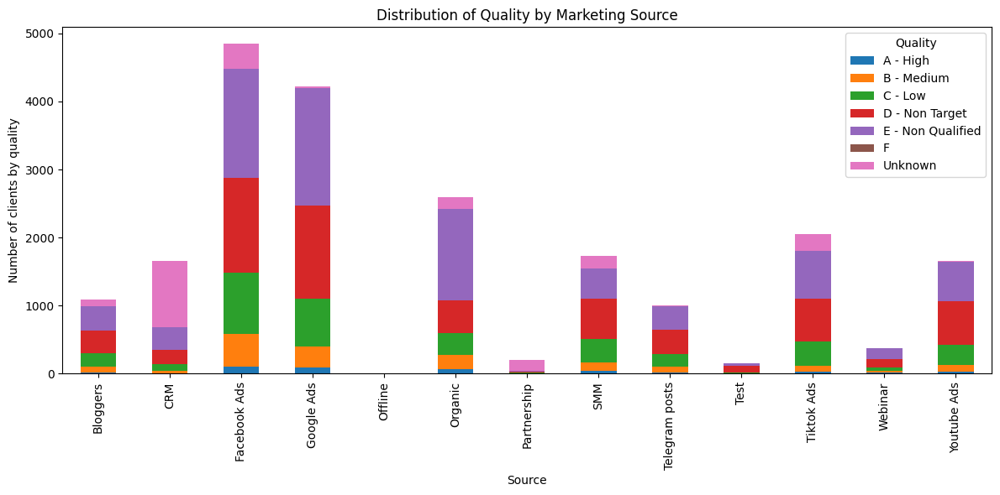

In [ ]:
grouped_source.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Distribution of Quality by Marketing Source')
plt.xlabel('Source')
plt.ylabel('Number of clients by quality')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# The table shows the number of clients from different sources on the x-axis, and the total number of clients on the y-axis, color-coded by lead quality.
# Based on the data. The highest quality leads come from Facebook and Google, as evidenced by their significant contribution to generating high-quality clients.

## **Sales Department Performance Analysis**

---



Evaluate the performance of individual deal owners and advertising campaigns in terms of the number of deals processed, conversion rates, and total sales.

In [ ]:
# Created a new dataframe with aggregated statistics by manager, including the number of contracts created, the number of contracts with completed payments, the
# conversion rate for each manager, and total revenue generated by each manager.

leads_by_manager = new_deals.groupby('Deal Owner Name').size()

won_deals_by_manager = new_deals[new_deals['Stage'] == 'Payment Done'].groupby('Deal Owner Name').size()

conversion_rate_by_manager = (won_deals_by_manager / leads_by_manager) * 100

income = new_deals[new_deals['Stage'] == 'Payment Done'].groupby('Deal Owner Name')['Offer Total Amount'].sum()

manager_deals = pd.DataFrame({
    'Total Deals': leads_by_manager,
    'Payment Done Deals': won_deals_by_manager,
    'Conversion Rate (%)': conversion_rate_by_manager,
    'Income' : income
})

manager_deals

,Total Deals,Payment Done Deals,Conversion Rate (%),Income
Deal Owner Name,,,,
Alice Johnson,25,NaN,NaN,NaN
Amy Green,66,NaN,NaN,NaN
Ben Hall,1345,46.0,3.420074,344500.0
Bob Brown,336,NaN,NaN,NaN
Cara Iverson,1056,27.0,2.556818,218000.0
Charlie Davis,2963,148.0,4.994938,1065600.0
Diana Evans,1013,1.0,0.098717,3500.0
Eva Kent,459,18.0,3.921569,132400.0
George King,94,2.0,2.127660,9000.0


In [ ]:
# Processed null values and changed the data type for "Payment Done Deals" to integer for accurate calculations.

manager_deals = manager_deals.fillna(0)
manager_deals['Payment Done Deals'] = manager_deals['Payment Done Deals'].astype(int)
manager_deals['Income'] = manager_deals['Income'].astype(int)
manager_deals

,Total Deals,Payment Done Deals,Conversion Rate (%),Income
Deal Owner Name,,,,
Alice Johnson,25,0,0.000000,0
Amy Green,66,0,0.000000,0
Ben Hall,1345,46,3.420074,344500
Bob Brown,336,0,0.000000,0
Cara Iverson,1056,27,2.556818,218000
Charlie Davis,2963,148,4.994938,1065600
Diana Evans,1013,1,0.098717,3500
Eva Kent,459,18,3.921569,132400
George King,94,2,2.127660,9000


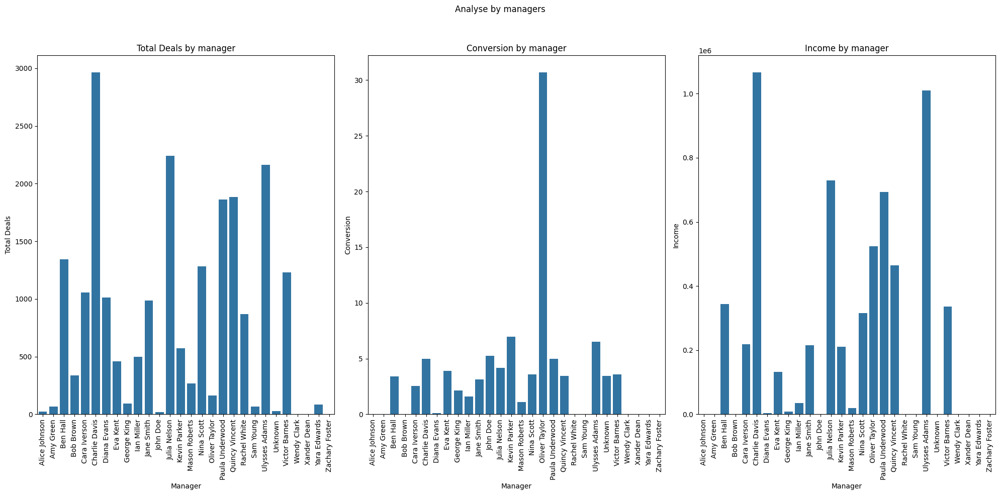

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(20, 10))

sns.barplot(data=manager_deals, x='Deal Owner Name', y ='Total Deals', ax=axes[0])
axes[0].set_title('Total Deals by manager')
axes[0].set_xlabel('Manager')
axes[0].set_ylabel('Total Deals')
axes[0].tick_params(axis='x', rotation=90)

sns.barplot(data=manager_deals, x='Deal Owner Name', y='Conversion Rate (%)', ax=axes[1])
axes[1].set_title('Conversion by manager')
axes[1].set_xlabel('Manager')
axes[1].set_ylabel('Conversion')
axes[1].tick_params(axis='x', rotation=90)

sns.barplot(data=manager_deals, x='Deal Owner Name', y='Income', ax=axes[2])
axes[2].set_title('Income by manager')
axes[2].set_xlabel('Manager')
axes[2].set_ylabel('Income')
axes[2].tick_params(axis='x', rotation=90)

plt.suptitle('Analyse by managers')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Generated bar plots to analyze manager performance: number of contracts, conversion rates, and revenue. Julia Nelson, Charlie Davis, and Ulysses Adams
# emerged as the top 3 managers across all key metrics.

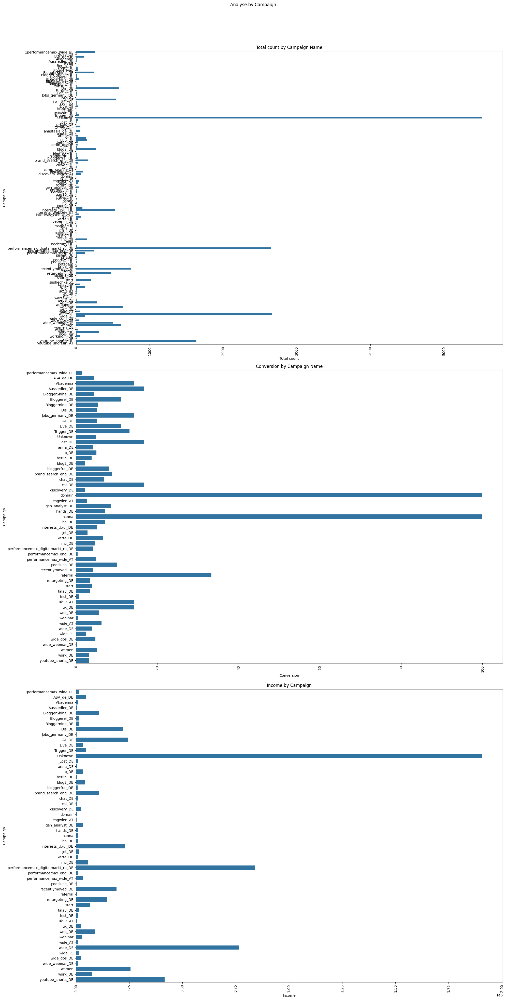

In [ ]:
filtered_total_campaign_deals = campaign_deals[campaign_deals['Total Leads'] > 0]
filtered_conversion_campaign_deals = campaign_deals[campaign_deals['Conversion Rate (%)'] > 0]
filtered_income_campaign_deals = campaign_deals[campaign_deals['Income'] > 0]

fig, axes = plt.subplots(3, 1, figsize=(20, 40))

sns.barplot(data=filtered_total_campaign_deals, x='Total Leads', y ='Campaign Name', ax=axes[0], orient='h')
axes[0].set_title('Total count by Campaign Name')
axes[0].set_xlabel('Total count')
axes[0].set_ylabel('Campaign')
axes[0].tick_params(axis='x', rotation=90)

sns.barplot(data=filtered_conversion_campaign_deals, x='Conversion Rate (%)', y='Campaign Name', ax=axes[1], orient='h')
axes[1].set_title('Conversion by Campaign Name')
axes[1].set_xlabel('Conversion')
axes[1].set_ylabel('Campaign')
axes[1].tick_params(axis='x', rotation=90)

sns.barplot(data=filtered_income_campaign_deals, x='Income', y='Campaign Name', ax=axes[2], orient='h')
axes[2].set_title('Income by Campaign')
axes[2].set_xlabel('Income')
axes[2].set_ylabel('Campaign')
axes[2].tick_params(axis='x', rotation=90)

plt.suptitle('Analyse by Campaign')
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Generated bar plots to assess campaign performance metrics. Initially, the graphs were cluttered, so a filter was added to display only values greater than zero.
# The campaigns digitalmarkt, wide, and youtube_shorts generate the most revenue, making them the most successful in terms of overall sales.

## **Payment and Product Analysis**

Examine the distribution of payment types and their impact on deal success.

In [ ]:
# I output a dataframe containing only rows where the deal status is marked as "Paid."

new_deals_payment_done

,Id,Deal Owner Name,Closing Date,Quality,Stage,Lost Reason,Page,Campaign,SLA,Content,...,Product,Education Type,Created Time,Course duration,Months of study,Initial Amount Paid,Offer Total Amount,Contact Name,City,Level of Deutsch
0,5805028000055502848,Eva Kent,2024-06-18,B - Medium,Payment Done,Non applicable,/pl-eng/web-developer,performancemax_wide_AT,14:35:20,_{region_name}_,...,Digital Marketing,Evening,2024-06-15 20:01:00,11,1,500,4500,5805028000055471104,Podskalie,Unknown
1,5805028000055524352,Ben Hall,2024-06-19,A - High,Payment Done,Non applicable,/eng,12.07.2023wide_DE,00:17:25,bloggersvideo11,...,Digital Marketing,Evening,2024-06-15 17:02:00,11,1,500,4500,5805028000055502848,Zinnowitz,Unknown
2,5805028000055524352,Ben Hall,NaT,B - Medium,Payment Done,Non applicable,/eng,Live_DE,00:23:42,b0,...,Web Developer,Morning,2024-06-15 12:20:00,6,1,1000,9000,5805028000055463936,Wolfsburg,B1
3,5805028000054664192,Ben Hall,NaT,D - Non Target,Payment Done,Non applicable,/eng,Unknown,16:31:52,Unknown,...,Web Developer,Morning,2024-06-11 19:39:00,6,1,1000,9000,5805028000054683648,Zwickau,A2
4,5805028000054256640,Quincy Vincent,2024-06-17,B - Medium,Payment Done,Non applicable,/eng,02.07.23wide_DE,00:45:55,bloggersvideo16com,...,Digital Marketing,Morning,2024-06-10 15:33:00,11,1,1000,11000,5805028000054284288,Leinfelden-Echterdingen,B1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853,5805028000002301952,Julia Nelson,2023-07-19,C - Low,Payment Done,Expensive,eng/digital-marketing,performancemax_digitalmarkt_ru_DE,15:24:52,_{region_name}_,...,Web Developer,Morning,2023-07-18 21:11:00,6,2,1000,5000,5805028000002301952,Wolfsburg,B1
854,5805028000001987584,Julia Nelson,2023-07-17,C - Low,Payment Done,Conditions are not suitable,eng/digital-marketing,12.07.2023wide_DE,00:49:16,v3com,...,Digital Marketing,Morning,2023-07-17 18:02:00,11,11,1000,11000,5805028000001985536,-,A2
855,5805028000001885184,Jane Smith,2023-08-31,A - High,Payment Done,Non applicable,eng/digital-marketing,04.07.23recentlymoved_DE,00:13:31,b2,...,Digital Marketing,Morning,2023-07-15 13:27:00,11,11,450,4000,5805028000001880064,Ingolstadt,Unknown
856,5805028000001400832,Oliver Taylor,NaT,B - Medium,Payment Done,Non applicable,eng/digital-marketing,02.07.23wide_DE,02:22:36,b3,...,Digital Marketing,Unknown,2023-07-08 08:56:00,11,8,1000,11500,5805028000001350656,Unknown,Unknown


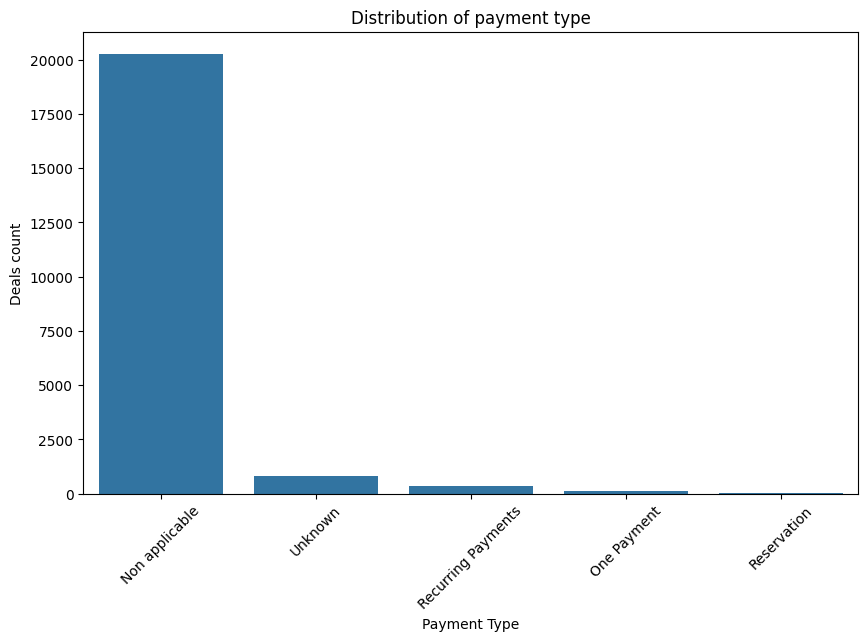

In [ ]:
payment_type_distribution = new_deals['Payment Type'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(x=payment_type_distribution.index, y=payment_type_distribution.values)
plt.title('Distribution of payment type')
plt.xlabel('Payment Type')
plt.ylabel('Deals count')
plt.xticks(rotation=45)
plt.show()

# Created a chart showing the distribution of payment types across the entire dataset. There are many deals that did not reach successful completion.

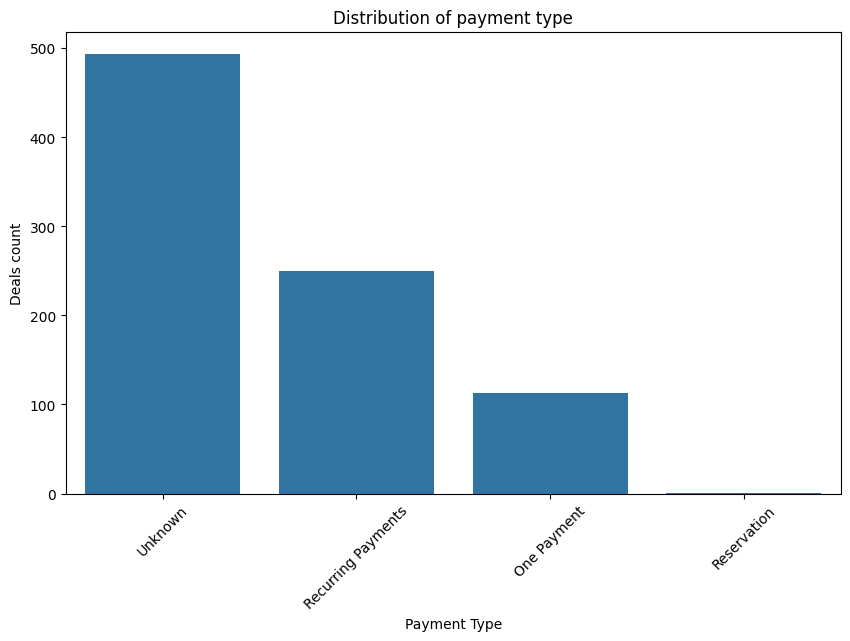

In [ ]:
payment_done_type_distribution = new_deals_payment_done['Payment Type'].value_counts()

plt.figure(figsize=(10, 6))
sns.barplot(x=payment_done_type_distribution.index, y=payment_done_type_distribution.values)
plt.title('Distribution of payment type')
plt.xlabel('Payment Type')
plt.ylabel('Deals count')
plt.xticks(rotation=45)
plt.show()

# Created a chart showing the distribution of payment types in the dataset with only successful payments. There are many deals where the payment type is not filled in.

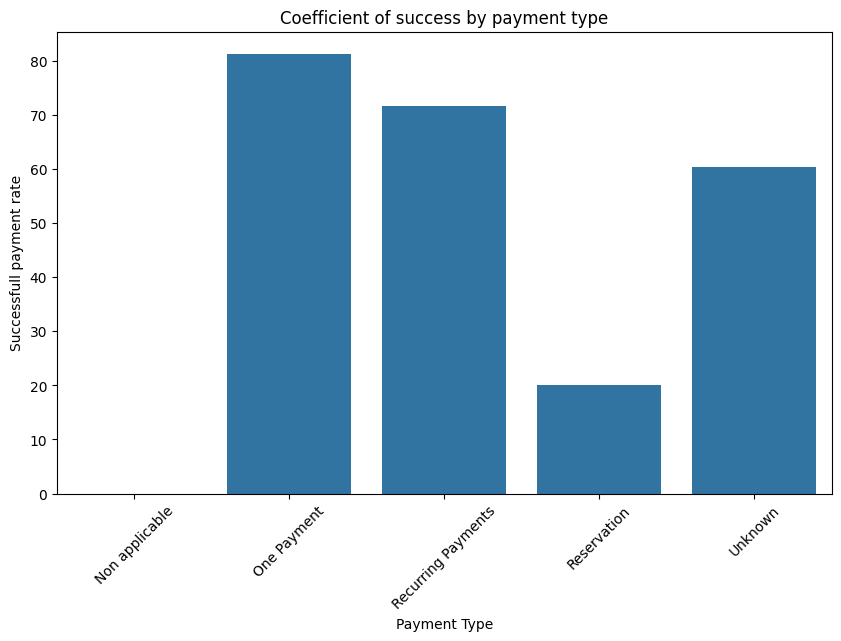

In [ ]:
# Counted the number of successful deals by payment type and calculated the success rate.

successful_deals = new_deals_payment_done.groupby('Payment Type').size()

total_by_payment = new_deals.groupby('Payment Type').size()

success_rate_by_payment = (successful_deals / total_by_payment) * 100

plt.figure(figsize=(10, 6))
sns.barplot(x=success_rate_by_payment.index, y=success_rate_by_payment.values)
plt.title('Coefficient of success by payment type')
plt.xlabel('Payment Type')
plt.ylabel('Successfull payment rate')
plt.xticks(rotation=45)
plt.show()

# Created a graph of the success rate by payment type. The highest success rate is with one-time payments.

Analyze the popularity and success of various products and training types

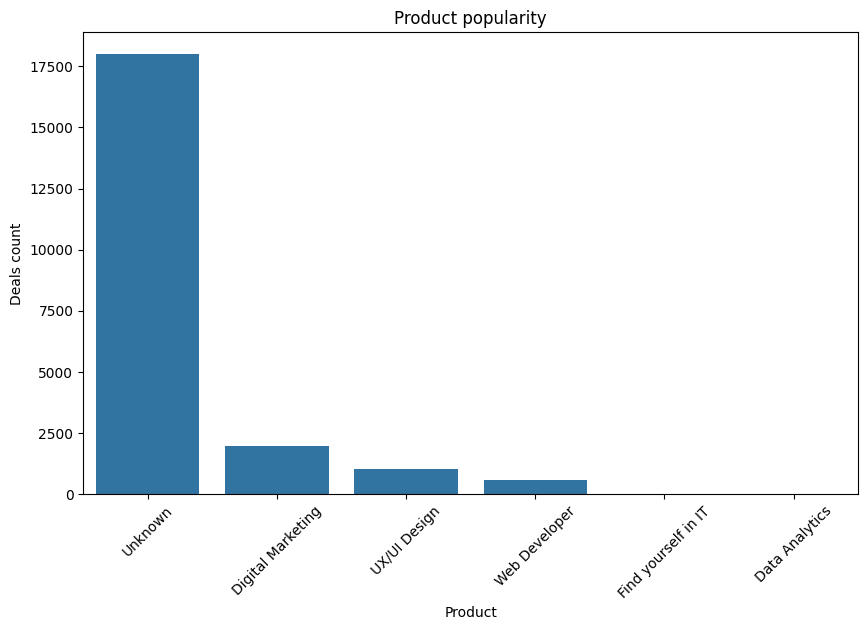

In [ ]:
# Counted the number of deals for each product.
product_popularity = new_deals['Product'].value_counts()


plt.figure(figsize=(10, 6))
sns.barplot(x=product_popularity.index, y=product_popularity.values)
plt.title('Product popularity')
plt.xlabel('Product')
plt.ylabel('Deals count')
plt.xticks(rotation=45)
plt.show()

# Created a chart showing product popularity.

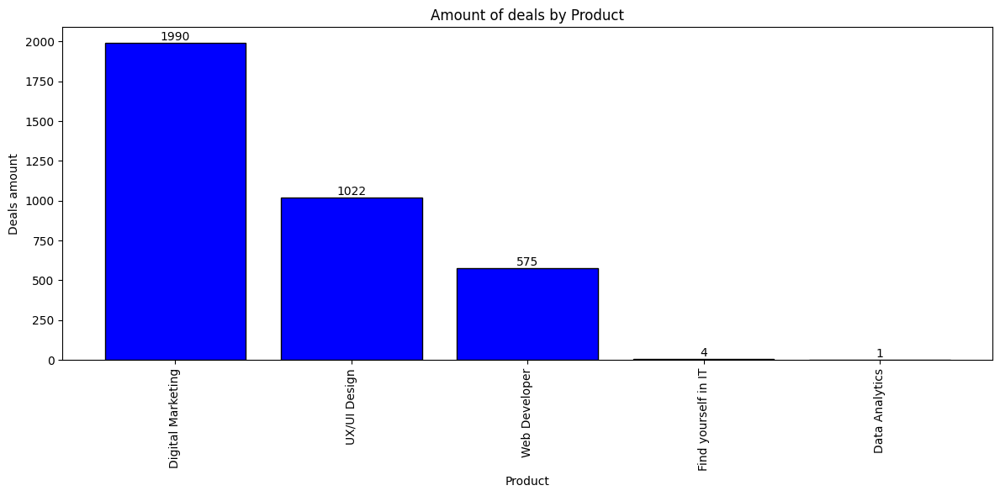

In [ ]:
deals_prod = deals[deals['Product'] != 'Unknown']['Product'].value_counts()

plt.figure(figsize=(12, 6))
bars_r = plt.bar(deals_prod.index, deals_prod.values, color='blue', edgecolor='black')

for bar in bars_r:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom', fontsize=10)

plt.title('Amount of deals by Product')
plt.xlabel('Product')
plt.ylabel('Deals amount')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# Preprocessed the missing values for course popularity. The most popular course is "Digital Marketing," while the "Data Analytics" course is not popular.

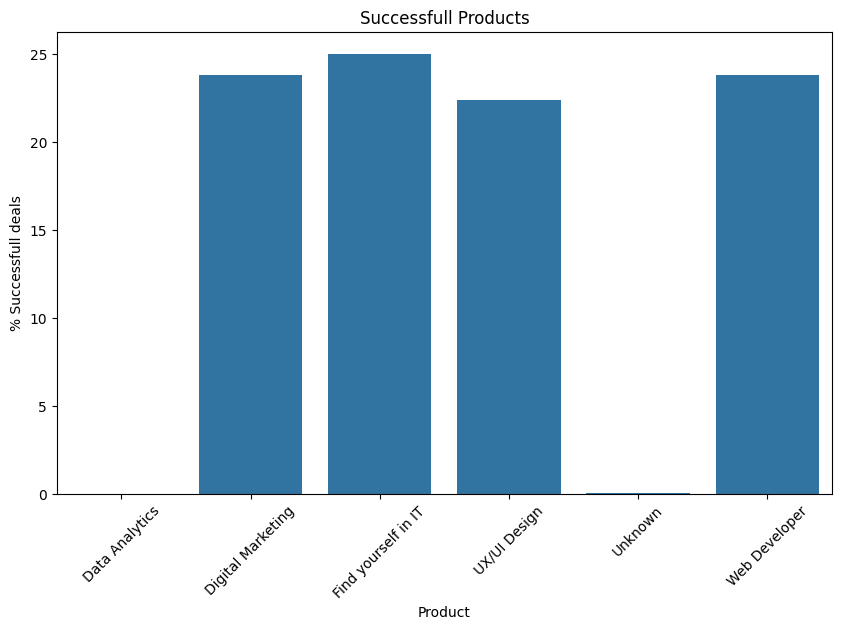

In [ ]:
# Counted successful deals for each product.
successful_product_deals = new_deals_payment_done.groupby('Product').size()

# Displayed total deals by product.
total_product_deals = new_deals.groupby('Product').size()

# Calculation of the success rate
product_success_rate = (successful_product_deals / total_product_deals) * 100

# Created a graph showing product success.
plt.figure(figsize=(10, 6))
sns.barplot(x=product_success_rate.index, y=product_success_rate.values)
plt.title('Successfull Products')
plt.xlabel('Product')
plt.ylabel('% Successfull deals')
plt.xticks(rotation=45)
plt.show()

# Although all products appear highly successful on the graph, in reality, the "Course" column is often not filled in. A large number of lost customers have no
# course listed.

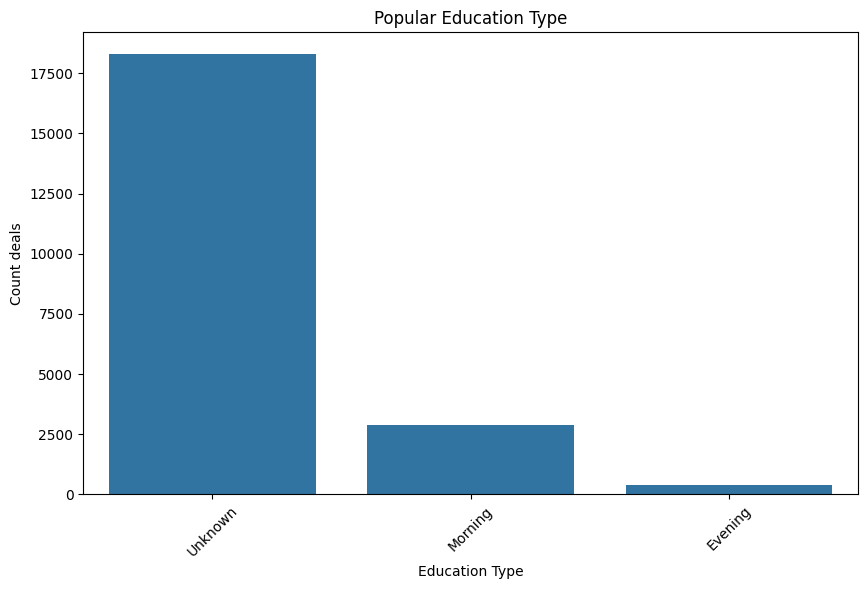

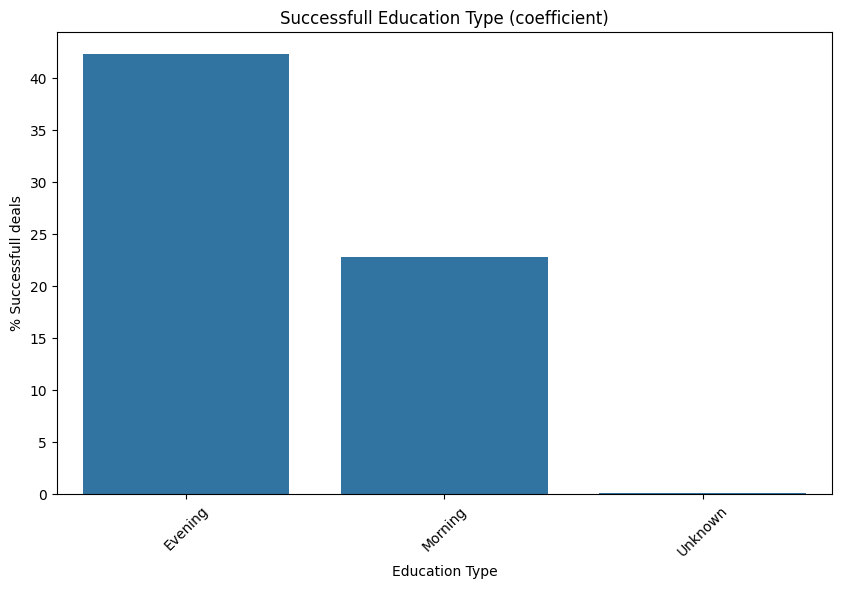

In [ ]:
learning_type_popularity = new_deals['Education Type'].value_counts()

# Created a chart showing the popularity of different types of education.
plt.figure(figsize=(10, 6))
sns.barplot(x=learning_type_popularity.index, y=learning_type_popularity.values)
plt.title('Popular Education Type')
plt.xlabel('Education Type')
plt.ylabel('Count deals')
plt.xticks(rotation=45)
plt.show()

successful_learning_deals = new_deals_payment_done.groupby('Education Type').size()
total_learning_deals = new_deals.groupby('Education Type').size()

# Calculated the success rate for each type of education.
learning_success_rate = (successful_learning_deals / total_learning_deals) * 100

# Created a graph showing the success rate of different education types.
plt.figure(figsize=(10, 6))
sns.barplot(x=learning_success_rate.index, y=learning_success_rate.values)
plt.title('Successfull Education Type (coefficient)')
plt.xlabel('Education Type')
plt.ylabel('% Successfull deals')
plt.xticks(rotation=45)
plt.show()

# Morning education is more popular, but evening training has the higher success rate in terms of completed deals.

## **Geographic Analysis**

Analyze the geographic distribution of deals by city.

In [ ]:
# Output unique city data.

deals['City'].unique()

array(['Unknown', 'Crailsheim', 'Dortmund', 'Stuttgart', 'München',
       'Berlin', 'Wien', 'Offenbach am Main', 'Eberbach', 'Görlitz',
       'Pfedelbach', 'Unterhaching',
       'Karl-Liebknecht str. 24, Hildburghausen, Thüringen',
       'Rüdesheim am Rhein', 'Dresden', 'Gummersbach', '-', 'Kassel',
       'Wenzenbach', 'Merseburg', 'Gommern', 'Pommelsbrunn', 'Duisburg',
       'Herzogenrath', 'Schwandorf', 'Mainz', 'Podskalie', 'Zinnowitz',
       'Quedlinburg', 'Poland , Gdansk , Al. Grunwaldzka 7, ap. 1a',
       'Wolfsburg', 'Weilburg', 'Dillenburg', 'Neu-Ulm',
       'Lauter-Bernsbach', 'Bonn', 'Riedstadt', 'Rosenheim',
       'Mönchengladbach', 'Neuburg', 'Rostock', 'Bad Oeynhausen',
       'Chemnitz', 'Diez', 'Nürnberg', 'Laubach', 'Düren', 'Düsseldorf',
       'Zwickau', 'Bremen', 'Halle', 'Erbach', 'Jünkerath', 'Magdeburg',
       'Celle', 'Germering', 'Kleve', 'Leinfelden-Echterdingen',
       'Garmisch-Partenkirchen', 'Leipzig', 'Hof', 'Lünen', 'Murr',
       'Bochum', '

In [ ]:
# Processed values written with errors or complete addresses, converting them to city names.

new_deals['City'] = new_deals['City'].replace('Karl-Liebknecht str. 24, Hildburghausen, Thüringen', 'Hildburghausen')
new_deals['City'] = new_deals['City'].replace('Vor Ebersbach 1, 77761 Schiltach', 'Schiltach')
new_deals['City'] = new_deals['City'].replace('Poland , Gdansk , Al. Grunwaldzka 7, ap. 1a', 'Gdansk')
new_deals['City'] = new_deals['City'].replace('-', 'Unknown')

<ipython-input-202-244daacf9ee3>:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.

/usr/local/lib/python3.10/dist-packages/seaborn/_base.py:949: FutureWarning:

When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warnin

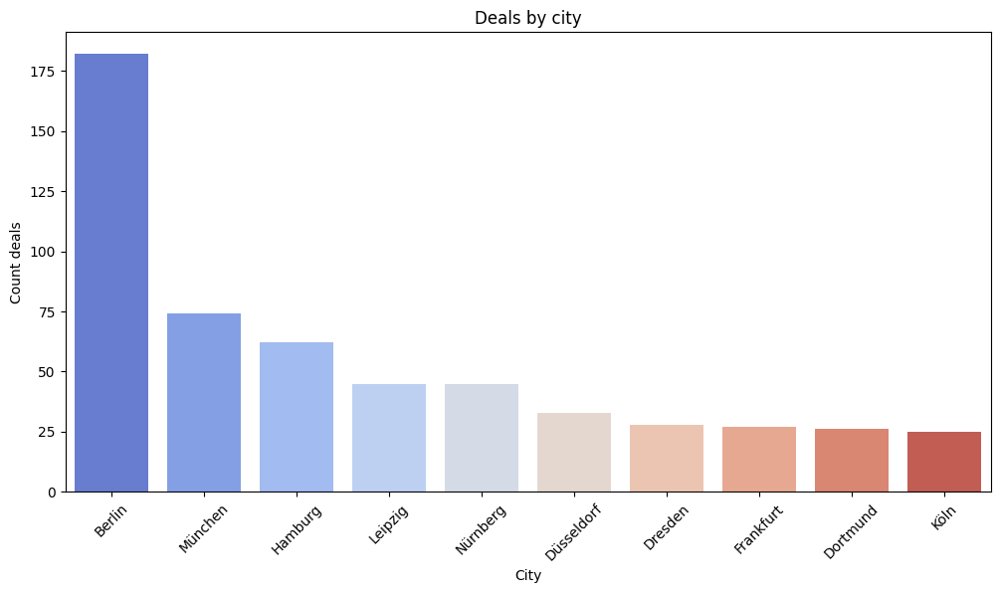

In [ ]:
# There are too many cities, making the graph unreadable, so I added filtering to show only cities with more than 20 deals and a specified city.
city_distribution = new_deals['City'].value_counts()
city_distribution_filtered = city_distribution[(city_distribution > 20) & (city_distribution.index != 'Unknown')]

# Created a graph of the geographic distribution of deals.
plt.figure(figsize=(12, 6))
sns.barplot(x=city_distribution_filtered.index, y=city_distribution_filtered.values, palette='coolwarm')
plt.title('Deals by city')
plt.xlabel('City')
plt.ylabel('Count deals')
plt.xticks(rotation=45)
plt.show()

# Berlin leads in the number of users.

In [ ]:
# This was all done to display cities on a map.

city = ['Crailsheim', 'Dortmund', 'Stuttgart', 'München', 'Berlin', 'Wien', 'Offenbach am Main', 'Eberbach', 'Görlitz', 'Pfedelbach',
        'Unterhaching', 'Hildburghausen', 'Rüdesheim am Rhein', 'Dresden', 'Gummersbach', 'Kassel', 'Wenzenbach', 'Merseburg', 'Gommern',
        'Pommelsbrunn', 'Duisburg', 'Herzogenrath', 'Schwandorf', 'Mainz', 'Podskalie', 'Zinnowitz', 'Quedlinburg', 'Gdansk', 'Wolfsburg',
        'Weilburg', 'Dillenburg', 'Neu-Ulm', 'Lauter-Bernsbach', 'Bonn', 'Riedstadt', 'Rosenheim', 'Mönchengladbach', 'Neuburg', 'Rostock',
        'Bad Oeynhausen', 'Chemnitz', 'Diez', 'Nürnberg', 'Laubach', 'Düren', 'Düsseldorf', 'Zwickau', 'Bremen', 'Halle', 'Erbach',
        'Jünkerath', 'Magdeburg', 'Celle', 'Germering', 'Kleve', 'Leinfelden-Echterdingen', 'Garmisch-Partenkirchen', 'Leipzig', 'Hof',
        'Lünen', 'Murr', 'Bochum', 'Leonberg', 'Bad Homburg vor der Höhe', 'Kiel', 'Theres', 'Lüchow', 'Stolberg', 'Bautzen', 'Weiden',
        'Osterode am Harz', 'Schiltach', 'Göppingen', 'Ansbach', 'Aachen', 'Menden', 'Iserlohn', 'Aying', 'Mannheim', 'Hamburg', 'Einhausen', 'Minden',
        'Igalo', 'Süßen', 'Flensburg', 'Tönning', 'Aschaffenburg', 'Holzwickede', 'Villingen‑Schwenningen', 'Ochtrup', 'Klosterlechfeld', 'Straubing',
        'Augsburg', 'Rheine', 'Singen', 'Werl', 'Schweinfurt', 'Ditzingen', 'Frankfurt', 'Waldbronn', 'Bad Wildbad im Schwarzwald', 'Essen',
        'Weil am Rhein', 'Lahnstein', 'Osnabrück', 'Lierschied', 'Eggenfelden', 'Trebgast', 'Verl', 'Wesel', 'Frammersbach', 'Grevesmühlen', 'Perleberg',
        'Michelfeld', 'Stralsund', 'Zeitz', 'Novi Sad', 'Münster', 'Helmstedt', 'Krefeld', 'Rastatt', 'Detmold', 'Weinstadt', 'Friedrichshafen',
        'Wächtersbach', 'Weißenburg in Bayern', 'Solingen', 'Worms', 'Schlangen', 'Schwarzenberg', 'Ludwigsburg', 'Büchen', 'Remscheid', 'Kulmbach',
        'Burghausen', 'Meinerzhagen', 'Torgau', 'Coesfeld', 'Hartmannsdorf', 'Adelschlag', 'Eisenberg', 'Kehl', 'Delbrück', 'Kempten', 'Marburg',
        'Oranienburg', 'Siegen', 'Castrop-Rauxel', 'Kalkar', 'Würzburg', 'Molsberg', 'Rust', 'Bad Hersfeld', 'Südlohn', 'Erfurt', 'Wiesenttal', 'Altenstadt',
        'Sankt Leon-Rot', 'Friedrichsdorf', 'Heinsberg', 'Passau', 'Darmstadt', 'Ruhla', 'Bad Nauheim', 'Bärnau', 'Erftstadt', 'Arnsberg', 'Pullach im Isartal',
        'Gelnhausen', 'Liederbach am Taunus', 'Gröditz', 'Trier', 'Buxtehude', 'Uelzen', 'Aldenhoven', 'Lutherstadt Wittenberg', 'Friedenweiler', 'Witzeeze',
        'Neuss', 'Pforzheim', 'Königswinter', 'Northeim', 'Rohrdorf', 'Filderstadt', 'Übelbach', 'Fürth', 'Kerpen', 'Warszawa', 'Markdorf', 'Piatek',
        'Hannover', 'Mülheim an der Ruhr', 'Erkner', 'Monschau', 'Bad Segeberg', 'Lauf an der Pegnitz', 'Oberasbach', 'Naumburg', 'Wandlitz',
        'Witten', 'Obernheim', 'Wilhelmshaven', 'Heimbuchenthal', 'Weiterstadt', 'Braunfels', 'Salzwedel', 'Rechitsa', 'Freiburg', 'Regensburg',
        'Leer', 'Höhenkirchen-Siegertsbrunn', 'Coburg', 'Wolfenbüttel', 'Niederorschel', 'Vierden', 'Ostbevern', 'Bad Pyrmont', 'Stelle', 'Wadgassen',
        'Leingarten', 'Obermarchtal', 'Güglingen', 'Linz', 'Sankt Ingbert', 'Staufen im Breisgau', 'Baku', 'Erlensee', 'Erkrath', 'Kornwestheim',
        'Wiesbaden', 'Leutershausen', 'Rees', 'Schwerin', 'Słupsk', 'Reutlingen', 'Hamm', 'Köln', 'Gdańsk', 'Allendorf', 'Gladenbach', 'Euskirchen',
        'Gerlingen', 'Lübeck', 'Büren', 'Ganderkesee', 'Ohrdruf', 'Beverungen', 'Oldenburg', 'Usingen', 'Geilenkirchen', 'Leichlingen', 'Veldenz',
        'Duschanbe', 'Ahad Al Masarihah', 'Werder', 'Morsbach', 'Herdecke', 'Gießen', 'Seevetal', 'Korschenbroich', 'Stendal', 'Teublitz', 'Meerbusch',
        'Obergünzburg', 'Eggolsheim', 'Limbach-Oberfrohna', 'Kraichtal', 'Rathenow', 'Śrem', 'Mülheim-Kärlich', 'Babenhausen', 'Heidenheim',
        'Rotterdam', 'Cremlingen', 'Hörstel', 'Rinteln', 'Gütersloh', 'Röttingen', 'Bayreuth', 'Ajman', 'Hagen', 'Rötgesbüttel',
        'Parchim', 'Emsdetten', 'Randersacker', 'Erding', 'Kressbronn am Bodensee', 'Essing', 'Nesselwang', 'Braunschweig', 'Zoetermeer', 'Karlsfeld',
        'Nuenchritz', 'Obergriesbach', 'Karlsruhe', 'Paderborn', 'Remchingen', 'Großrosseln', 'Neuhemsbach', 'Nebra (Unstrut)', 'Herford', 'Lubrza',
        'Kalanchak', 'Piotrków Trybunalski', 'Neumünster', 'Hennef', 'Wörthsee', 'Monheim am Rhein', 'Klasztorna', 'Taraz', 'Troisdorf',
        'Henstedt-Ulzburg', 'Achberg', 'Bialystok', 'Königsmoos', 'Warburg', 'Stade', 'Großbreitenbach', 'Bad Driburg', 'Sollstedt',
        'Esslingen am Neckar', 'Cloppenburg', 'Landshut', 'Karstädt', 'Steinfurt', 'Tatabanya', 'Gerolstein', 'Astana', 'Dabrowa Gornicza', 'Schwanewede',
        'Glendale', 'Hückelhoven', 'Cheremkhovo', 'Schwarzheide', 'Böhlen', 'Pleinfeld', 'Hettenshausen', 'Bünde', 'Sankt Georgen im Schwarzwald',
        'Lichtenfels', 'Fulda', 'Riesa', 'Löbau', 'Waren', 'Hameln', 'Aichwald', 'Eppelheim', 'Bad Berleburg', 'Aalen', 'Minsk', 'Oberding',
        'Wermelskirchen', 'Jindrichuv Hradec', 'Trossingen', 'Stein', 'Nizhny Novgorod', 'Murom', 'Bad Wörishofen', 'Twistringen', 'Langenselbold',
        'Alsfeld', 'Limeshain', 'Helmstidde', 'Schwalbach', 'Alfeld', 'Mainz-Kastel', 'Forchheim', 'Altenkirchen', 'Velden', 'Alzenau in Unterfranken',
        'Bühl', 'Bad Tölz', 'Schkeuditz', 'Poing', 'Tuttlingen', 'Semej', 'Cuxhaven', 'Kirchlauter', 'Speyer', 'Untersiemau', 'Słubice',
        'Pfalzgrafenweiler', 'Wetzlar', 'Reichenau', 'Scharbeutz', 'Kirchheim', 'Blankenfelde', 'Güstrow', 'Frechen', 'Vechta', 'Leuna', 'Coswig',
        'Kisslegg', 'Ebern', 'Weilheim in Oberbayern', 'Engen', 'Lippstadt', 'Konstanz', 'Saarbrücken', 'Aichach', 'Heilbronn', 'Sandersdorf',
        'Luckenwalde', 'Inchenhofen', 'Amberg', 'Oberhausen', 'Waiblingen', 'Appen', 'Chambon-sur-Lignon', 'Nettetal', 'Kirchlinteln', 'Ottobrunn',
        'Koblenz', 'Kusel', 'Massenbachhausen', 'Rangsdorf', 'Hildesheim', 'Heidelberg', 'Senden', 'Borna', 'Bad Saulgau', 'Cham', 'Herne', 'Lenningen',
        'Niederstetten', 'Olpe', 'Heinersreuth', 'Speichersdorf', 'Potsdam', 'Bergisch Gladbach', 'Weingarten', 'Brandenburg an der Havel', 'Lengerich',
        'Poppenhausen', 'Villingen-Schwenningen', 'Friesoythe', 'Lingen', 'Jena', 'Griepswohld', 'Garrel', 'Herbrechtingen', 'Binzen', 'Friedberg',
        'Wuppertal', 'Ulm', 'Markgröningen', 'Dinslaken', 'Ravensburg', 'Geyer', 'Ilmenau', 'Freital', 'Engelsbrand', 'Planegg', 'Zwingenberg',
        'Abensberg', 'Weinähr', 'Wiefelstede', 'Fritzlar', 'Rheda-Wiedenbrück', 'Rudolstadt', 'Neunkirchen-Seelscheid', 'Tittmoning', 'Kamen',
        'Haimhausen', 'Weißwasser', 'Triberg', 'Herrsching am Ammersee', 'Oberndorf am Neckar', 'Schwäbisch Hall', 'Tashkent', 'Bad Windsheim',
        'Selm', 'Arnstadt', 'Neu-Isenburg', 'Buttstädt', 'Kaltenkirchen', 'Neuenkirchen', 'Eystrup', 'Kirn', 'Neunkirchen', 'Buchholz',
        'Mittweida', 'Altötting', 'Saint Petersburg', 'Bad Emstal', 'Mandelbachtal', 'Riga', 'Nünchritz', 'Oelde', 'Bergheim', 'London',
        'Mainz-Kostheim', 'Niedenstein', 'Kaliningrad', 'Hilchenbach', 'Neu Wulmstorf', 'Bielefeld', 'Zorneding', 'Eggenstein-Leopoldshafen',
        'Floß', 'Rosengarten', 'Schwaig', 'Bingen', 'Tettnang', 'Wismar', 'Ahaus', 'Eppelborn', 'Dörverden', 'Bat yam', 'Rodewisch', 'Schrozberg',
        'Hoyerswerda', 'Aschersleben', 'Teterow', 'Gera', 'Backnang', 'Kamenskoe', 'Kirchlengern', 'Delitzsch', 'Walldorf', 'Königstein im Taunus',
        'Brühl', 'Neubrandenburg', 'Viernheim', 'Fernwald', 'Hösbach', 'Kemnath', 'Neumarkt in der Oberpfalz', 'Kamenz', 'Hattgenstein',
        'Neukirchen-Vluyn', 'Wolnzach', 'Hofkirchen', 'Moscow', 'Nastätten', 'Zerbst', 'Grafenau', 'Albstadt', 'Postbauer-Heng', 'Neutraubling',
        'Meinersen', 'Espenau', 'Grevenbroich', 'Deggendorf', 'Niedereschach', 'Donauwörth', 'Haldensleben', 'Illingen', 'Norderney', 'Itzehoe',
        'Münchhausen', 'Oberrot', 'Weilheim', 'Marsberg', 'Beckingen', 'Lemgo', 'Werlte', 'Pfaffenhofen', 'Waldenburg',
        'Schieder-Schwalenberg', 'Nordhausen', 'Dormagen', 'Dußlingen', 'Ottersweier', 'Voerde', 'Forst', 'Seesen', 'Baesweiler', 'Nagold',
        'Kleinostheim', 'Löningen', 'Unterschneidheim', 'Sand am Main', 'Wangen im Allgäu', 'Maasbree', 'Homburg', 'Bad Abbach', 'Lotte',
        'Birkenfeld', 'Phuket', 'Almaty', 'Ingolstadt', 'Böblingen', 'Adelebsen', 'Sigmarszell', 'Neuhäusel', 'Lehre', 'Herzogenaurach',
        'Mömlingen', 'Willich', 'Dettelbach', 'Michelstadt', 'Niesky', 'Neuwied', 'Freren', 'Nienburg/Weser', 'Heimbach', 'Euerbach',
        'Waldkraiburg', 'Saarlouis', 'Litzendorf', 'Fröndenberg', 'Überlingen', 'Bad Soden am Taunus', 'Lauf', 'Anklam', 'Eislingen',
        'Hachenburg', 'Pfinztal', 'Szczecin', 'Leutkirch im Allgäu', 'Neusäß', 'Mühlhausen', 'Annaberg-Buchholz', 'Blumberg',
        'Retzstadt', 'Kolbermoor', 'Donaueschingen', 'Gdynia', 'Rendsburg', 'Namur', 'Dingolfing', 'Dinkelscherben', 'Neuburg an der Donau',
        'Halle (Saale)', 'Sundern', 'Tübingen', 'Sexau', 'Vaihingen an der Enz', 'Steinbach', 'Imsbach', 'Harsewinkel', 'Bad Feilnbach',
        'Marne', 'Hückeswagen', 'Kappelrodeck', 'Ehrensberg', 'Dettenhausen', 'Wittstock', 'Vellberg', 'Bad Vilbel', 'Kluse', 'Hockenheim',
        'Runkel', 'Włodawa', 'Kelkheim', 'Viereth-Trunstadt', 'Nellingen', 'Fürstenfeldbruck', 'Glandorf', 'Nisterberg', 'Landsberg am Lech',
        'Bamberg', 'Kernen im Remstal', 'Nottuln', 'Hechingen', 'Marktredwitz', 'Beilstein', 'Heusweiler', 'Aidlingen', 'Elze', 'Borken', 'Bernau',
        'Pyrbaum', 'Niederstotzingen', 'Porta Westfalica', 'Wülfrath', 'Volgodonsk', 'Mullrose', 'Burg', 'Huttisheim', 'Konigslutter',
        'Melsungen', 'Bitterfeld-Wolfen', 'Uhldingen-Muhlhofen', 'Grafenhausen', 'Freudenstadt', 'Mengerskirchen', 'Heppenheim',
        'Nurtingen', 'Rothenburg ob der Tauber', 'Sasbach', 'Malchin', 'Schmolln', 'Lengenfeld', 'Miesbach', 'Holzminden', 'Grobenzell',
        'Mettmann', 'Eching', 'Manching', 'Karben', 'Mainaschaff', 'Baden-Baden', 'Dubai', 'Miltenberg', 'Wetter', 'Garbsen',
        'Kirchheim bei Munich', 'Prenzlau', 'Odelzhausen', 'Urbach', 'Schönwald', 'Altlandsberg', 'Hopfen am See', 'Schwabisch Gmund',
        'Boppard', 'Wertheim', 'Sindelfingen', 'Pirmasens', 'Rosbach vor der Hohe', 'Neuenrade', 'Hagenow', 'Kaufbeuren', 'Osterhofen',
        'Rotenburg an der Fulda', 'Hofheim am Taunus', 'Krumbach', 'Bretten', 'Langenbach', 'Stadecken-Elsheim', 'Oerlinghausen', 'Gottingen',
        'Lampertheim', 'Steinau an der Strase', 'Wolfhagen', 'Plauen', 'Sulzbach', 'Herzberg', 'Biberach', 'Schmallenberg', 'Gelsenkirchen',
        'Verden', 'Salzgitter', 'Furtwangen', 'Isernhagen', 'Schonach im Schwarzwald', 'Kobylka', 'Erkelenz', 'Heide', 'Mainbernheim',
        'Bopfingen', 'Bremerhaven', 'Ampfing', 'Hohenberg an der Eger', 'Leopoldshohe', 'Bergneustadt', 'Offenbach', 'Hennigsdorf',
        'Schliersee', 'Gaildorf', 'Bad Gottleuba-Berggießhübel', 'Kitzingen', 'Lennestadt', 'Weinsberg', 'Kaiserslautern', 'Plon',
        'Wittendorp', 'Konz', 'Landau in der Pfalz', 'Nordenham', 'Raschau-Markersbach', 'Wirges', 'Loerrach', 'Oehringen', 'Zetel',
        'Weimar', 'Bobingen', 'Wemding', 'Sankt Augustin', 'Haseluenne', 'Maikammer', 'Oberkochen', 'Siegburg', 'Greven', 'Birstein',
        'Altenburg', 'Brakel', 'Pinneberg', 'Ladenburg', 'Bad Schwalbach', 'Mahlberg', 'Leverkusen', 'Pavlograd', 'Muhldorf', 'Starnberg',
        'Meisenheim', 'Rommerskirchen', 'Lychen', 'Zella-Mehlis', 'Lutherstadt Eisleben', 'Eiterfeld', 'Neustadt-Glewe', 'Finnentrop',
        'Thalmassing', 'Przesław', 'Ahrensburg', 'Bad Hindelang', 'Bad Blankenburg', 'Germersheim', 'Montabaur', 'Burstadt', 'Hasbergen',
        'Bad Ems', 'Bad Essen', 'Norden', 'Heiligenhaus', 'Mutlangen', 'Edingen-Neckarhausen', 'Sonneberg', 'Recklinghausen',
        'Delmenhorst', 'Freising', 'Peine', 'Altshausen', 'Baiersbronn', 'Luedenscheid', 'Alsbach-Hahnlein', 'Schenefeld', 'Hallbergmoos',
        'Burbach', 'Waldkirch', 'Stuhr', 'Bad Wildungen', 'Warendorf', 'Winhoring', 'Erlangen', 'Poessneck', 'Tengen', 'Saalfeld',
        'Olching', 'Berchtesgaden', 'Lage', 'Freigericht', 'Bad Friedrichshall', 'Reichenbach', 'Causeni', 'Bruchkobel', 'Schwepnitz',
        'Quickborn', 'Radebeul', 'Korbach', 'Landau an der Isar', 'Emden', 'Eisenbach (Hochschwarzwald)','Hohenstein', 'Duderstadt',
        'Chuguev', 'Lindau (Bodensee)','Bad Honningen', 'Senftenberg', 'Gunzburg', 'Malschwitz', 'Tutzing', 'Blankenburg', 'Eschenburg',
        'Netphen', 'Apen', 'Kharkiv', 'Wittmund', 'Novorossiysk', 'Jordenstorf', 'Werne', 'Melle', 'Lunenburg', 'Bruck', 'Prostejov',
        'Wenden', 'Belgrade','Alamudun', 'Bad Gandersheim', 'Braubach', 'Geldern', 'Bassum','Brake']

latitude = ['49.1340', '51.5136', '48.7758', '48.1351', '52.5200', '48.2082', '50.0956', '49.4636', '51.1560', '49.1971', '48.0653',
            '50.4236', '49.9807', '51.0504', '51.0267', '51.3127', '49.0622', '51.3555', '52.0734', '49.5089', '51.4344', '50.8704',
            '49.3259', '49.9929', '49.0575', '54.0774', '51.7913', '54.3520', '52.4227', '50.4842', '50.7410', '48.3927', '50.5575',
            '50.7374', '49.8344', '47.8566', '51.1805', '48.7337', '54.0924', '52.2072', '50.8278', '50.3736', '49.4521', '50.5267',
            '50.8040', '51.2277', '50.7189', '53.0793', '51.4967', '49.6576', '50.3192', '52.1205', '52.6226', '48.1285', '51.7886',
            '48.6943', '47.4922', '51.3397', '50.3170', '51.6163', '48.9665', '51.4818', '48.8001', '50.2263', '54.3233', '50.0154',
            '52.9678', '50.7739', '51.1819', '49.6741', '51.7253', '48.2895', '48.7032', '49.3043', '50.7753', '51.4432', '51.3755',
            '47.9715', '49.4875', '53.5511', '49.6622', '52.2893', '42.4553', '48.6844', '54.7930', '54.3165', '49.9777', '51.5039',
            '48.0620', '52.2096', '48.1528', '48.8813', '48.3705', '52.2855', '47.7586', '51.5541', '50.0497', '48.8267', '50.1109',
            '48.9196', '48.7471', '51.4556', '47.5939', '50.3033', '52.2799', '50.1630' ,'48.3987', '50.0994', '51.8834', '51.6574',
            '50.1025', '53.8612', '53.0705', '49.1101', '54.3133', '51.0502', '45.2671', '51.9607', '52.2272', '51.3388', '48.8583',
            '51.9380', '48.8045', '47.6542', '50.2604', '49.0319', '51.1652', '49.6312', '51.8250', '50.5410', '48.8944', '53.4784',
            '51.1787', '50.1007', '48.1695', '51.1004', '51.5604', '51.9440', '50.8822', '48.8422', '50.9682', '48.5737', '51.7641',
            '47.7267', '50.8076', '52.7530', '50.8748', '51.5561', '51.7340', '49.7913', '50.5231', '48.2672', '50.8705', '51.9339',
            '50.9848', '49.8082', '50.2902', '49.2803', '50.2570', '51.0633', '48.5667', '49.8728', '50.9005', '50.3644', '49.8155',
            '50.8144', '51.4095', '48.0531', '50.2017', '50.1383', '51.4000', '49.7499', '53.4677', '52.9641', '50.9037', '51.8649',
            '47.9050', '53.4392', '51.2042', '48.8922', '50.6832', '51.7000', '47.8074', '48.6560', '47.2613', '49.4772', '50.8746',
            '52.2297', '47.7229', '52.0667', '52.3759', '51.4325', '52.4215', '50.5540', '53.9364', '49.5143', '49.4221', '51.1500',
            '52.7484', '51.4331', '48.1708', '53.5290', '49.8678', '49.9031', '50.5182', '52.8525', '52.3550', '47.9990', '49.0134',
            '53.2314', '48.0171', '50.2625', '52.1633', '51.3658', '53.3333', '52.0505', '51.9865', '53.3836', '49.2659', '49.1444',
            '48.2228', '49.0758', '48.3069', '49.2750', '47.8836', '40.4093', '50.1657', '51.2228', '48.8624', '50.0826', '49.2972',
            '51.7627', '53.6333', '54.4641', '48.4914', '51.6739', '50.9375', '54.3520', '51.0435', '50.7695', '50.6606', '48.7992',
            '53.8655', '51.5542', '53.0344', '50.8328', '51.6687', '53.1435', '50.3465', '50.9678', '51.1064', '49.8903', '38.5598',
            '17.1941', '52.3792', '50.8536', '51.3962', '50.5841', '53.3971', '51.1901', '52.6060', '49.2142', '51.2612', '47.8264',
            '49.7742', '50.8647', '49.1412', '52.6066', '52.0890', '50.3842', '49.9629', '48.6798', '51.9225', '52.2450', '52.3161',
            '52.1869', '51.9069', '49.5020', '49.9481', '25.4052', '51.3671', '52.3710', '53.4267', '52.1732', '49.7462', '48.3066',
            '47.5976', '48.9444', '47.6230', '52.2689', '52.0607', '48.2389', '51.3010', '48.4553', '49.0069', '51.7189', '48.9267',
            '49.1914', '49.5106', '51.2883', '52.1144', '52.3913', '46.2578', '51.4059', '54.0732', '50.7758', '48.0729', '51.0916',
            '53.7646', '42.8999', '50.8146', '53.7933', '47.6266', '53.1325', '48.6829', '51.4905', '53.5952', '50.5491', '51.7341',
            '51.4333', '48.7396', '52.8472', '48.5411', '53.0942', '52.1491', '47.5800', '50.2210', '51.1694', '50.3333', '53.2276',
            '34.1425', '51.0550', '53.1550', '51.4696', '51.2067', '49.1083', '48.5161', '52.1972', '48.1294', '50.1446', '50.5540',
            '51.3076', '51.0996', '53.5181', '52.1076', '48.7400', '49.3983', '51.0550', '48.8372', '53.9000', '48.3213', '51.1391',
            '49.1449', '48.0744', '49.4154', '56.3269', '55.5633', '48.0089', '52.7935', '50.1781', '50.7508', '50.2484', '52.2282',
            '49.3158', '51.9817', '50.0116', '49.7172', '50.6900', '48.3190', '50.0893', '48.6967', '47.7611', '51.3967', '48.1712',
            '47.9847', '50.4267', '53.8612', '50.0717', '49.3176', '50.1744', '52.3485', '48.5086', '50.5619', '47.6964', '54.0186',
            '49.6400', '52.3442', '53.7961', '50.9136', '52.7251', '51.3171', '51.1322', '47.7911', '50.0959', '47.8408', '47.8609',
            '51.6735', '47.6779', '49.2402', '48.4608', '49.1417', '51.6269', '52.0905', '48.4949', '49.4419', '51.4963', '48.8324',
            '53.6151', '45.0582', '51.3167', '52.9567', '48.0642', '50.3569', '49.5378', '49.1822', '52.3007', '52.1548', '49.3988',
            '48.3198', '51.1251', '48.0156', '49.2258', '51.5369', '48.5589', '49.4061', '51.0296', '49.9815', '49.8701', '52.3966',
            '50.9856', '47.8091', '52.4161', '52.1846', '50.4961', '48.0622', '53.0224', '52.5219', '50.9271', '53.9283', '52.9539',
            '48.6170', '47.6456', '50.3353', '51.2562', '48.4011', '48.9057', '51.5627', '47.7815', '50.6263', '50.6837', '51.0014',
            '48.8229', '48.1066', '49.7210', '48.8155', '50.3240', '53.2431', '51.1275', '51.8512', '50.7201', '50.8724', '48.0635',
            '51.5912', '48.3364', '51.5064', '48.1291', '47.9989', '48.2916', '49.1110', '41.2995', '49.5007', '51.6951', '50.8310',
            '50.0489', '51.1153', '53.8291', '52.2181', '52.7833', '49.7831', '49.3441', '53.3315', '50.9859', '48.2260', '59.9311',
            '51.2458', '49.2000', '56.9496', '51.2955', '51.8286', '50.9553', '51.5074', '50.0039', '51.2446', '54.7104', '50.9984',
            '53.4626', '52.0302', '48.0927', '49.0709', '49.7444', '53.3886', '49.4977', '49.9665', '47.6689', '53.8913', '52.0811',
            '49.4003', '52.8454', '32.0232', '50.5424', '49.3410', '51.4377', '51.7567', '53.7721', '50.8772', '48.9470', '48.5104',
            '52.2061', '51.5252', '49.3033', '50.1819', '50.8312', '53.5571', '49.5419', '50.5529', '50.0030', '49.8827', '49.2804',
            '51.2670', '49.6892', '51.4500', '48.6114', '48.6900', '55.7558', '50.2116', '51.9667', '48.8561', '48.2165', '49.3120',
            '48.9982', '52.4769', '51.4028', '51.0917', '48.8373', '48.1075', '48.7157', '52.2906', '49.3722', '53.7070', '53.9242',
            '50.9775', '49.0108', '47.8401', '51.4596', '49.4146', '52.0274', '52.8507', '48.5297', '50.7235', '51.8995', '51.5022',
            '51.0965', '48.4477', '48.6525', '51.5900', '51.7336', '51.8916', '50.9092', '48.5517', '50.0155', '52.7369', '48.9362',
            '50.0073', '47.6861', '51.3561', '49.3234', '48.9190', '52.2870', '49.6440', '7.8804', '43.2220', '48.7665', '48.6817',
            '51.5793', '47.5843', '50.3833', '52.3189', '49.5670', '49.8383', '51.2634', '49.7986', '49.6743', '51.2954', '50.4331',
            '52.4045', '52.6445', '50.6428', '50.0725', '48.2083', '49.3127', '49.9033', '51.4751', '47.7691', '50.1406', '49.5100',
            '53.8513', '48.6974', '50.6624', '48.9760', '53.4285', '47.8262', '48.4039', '51.2116', '50.5775', '47.8405', '49.9062',
            '47.8496', '47.9557', '54.5189', '54.3073', '50.4674', '48.6411', '48.3656', '48.7322', '51.4825', '51.3292', '48.5216',
            '48.0850', '48.9348', '50.5920', '49.5989', '51.9632', '47.7961', '54.0591', '51.1511', '48.5783', '50.9884', '48.5897',
            '53.1630', '49.0964', '50.1791', '52.9500', '49.3172', '50.4216', '51.5507', '50.1389', '49.9370', '48.5111', '48.1796',
            '52.0705', '50.6761', '48.0473', '49.8917', '48.8108', '51.9325', '48.3541', '50.0021', '49.0369', '49.3495', '48.6537',
            '52.1116', '51.8422', '48.0439', '49.3054', '48.5691', '52.2391', '51.2804', '47.5160', '52.2514', '52.2706', '48.2843',
            '52.2539', '51.1328', '51.6232', '47.7297', '47.7958', '48.4661', '50.5498', '49.6378', '48.6261', '49.3785', '48.6358',
            '53.7406', '50.8955', '50.5569', '47.7899', '51.8257', '48.1983', '51.2526', '48.2861', '48.7144', '50.2304', '49.9757',
            '48.7606', '25.2769', '49.7005', '51.3883', '52.4188', '48.1693', '53.3152', '48.3194', '48.8122', '48.1403', '52.5631',
            '47.6039', '48.8009', '50.2304', '49.7595', '48.7100', '49.2007', '50.3100', '51.2868', '53.4309', '47.8824', '48.7000',
            '50.9944', '50.0903', '48.2453', '49.0364', '48.4480', '49.9011', '51.9558', '51.5413', '49.5978', '50.3141', '51.3262',
            '50.4979', '50.1306', '51.6573', '48.0933', '51.1543', '51.5177', '52.9194', '52.1522', '48.0478', '52.4372', '48.1358',
            '52.3479', '51.0798', '54.1963', '49.7045', '48.8567', '53.5396', '48.2551', '50.0876', '52.0148', '51.0344', '50.0956',
            '52.6376', '47.7356', '49.0013', '50.8667', '49.7399', '51.1132', '49.1499', '49.4401', '54.1576', '53.5886', '49.7000',
            '49.1989', '3.4813', '50.5313', '50.4669', '47.6154', '49.2028', '53.4061', '50.9800', '48.2679', '48.8690', '50.7758',
            '52.6732', '49.3144', '48.7840', '50.8006', '52.0921', '50.3885', '50.9876', '51.7205', '53.6602', '49.4740', '50.1408',
            '48.2876', '51.0459', '48.5333', '48.2466', '48.0016', '49.7076', '51.0397', '53.2068', '50.6501', '51.5253', '50.7507',
            '53.3791', '51.1728', '48.9003', '50.4167', '53.6752', '47.5107', '50.6831', '49.2244', '50.4368', '49.6422', '52.2415',
            '50.3311', '52.3196', '53.5994', '51.3269', '48.8283', '49.4528', '50.3597', '51.6131', '53.0492', '48.4029', '52.3206',
            '47.9391', '48.5034', '51.2191', '49.7406', '53.6022', '48.3176', '50.7485', '48.0919', '53.0192', '51.1182', '51.9516',
            '48.2507', '49.5897', '50.6969', '47.8193', '50.6483', '48.2030', '47.6303', '51.9917', '50.1333', '49.2269', '50.6232',
            '46.6366', '50.1787', '51.2984', '53.7335', '51.1062', '51.2769', '48.6691', '53.3674', '47.9579', '50.2499', '51.5122',
            '49.8354', '47.5480', '50.5169', '51.5200', '48.4555', '51.2358', '47.9073', '51.7924', '50.8181', '50.9168', '53.2219',
            '49.9935', '53.5749', '44.7244', '53.8281', '51.6646', '52.2036', '53.2467', '47.4181', '49.4711', '50.9646', '44.7866',
            '42.8192', '51.8710', '50.2734', '51.5192', '52.8503', '53.3342']

longitude = ['10.0721', '7.4653', '9.1829', '11.5820', '13.4050', '16.3738', '8.7761', '8.9895', '14.9870', '9.4785', '11.6156',
             '10.7316', '7.9267', '13.7373', '7.563', '9.4797', '12.1941', '11.9898', '11.8373', '11.5199', '6.7623', '6.0966',
             '12.1086', '8.2473', '18.2821', '13.9172', '11.1519', '18.6466', '10.7865', '8.2675', '8.2889', '10.0117', '12.7497',
             '7.0982', '8.4969', '12.1280', '6.4428', '11.1832', ' 12.0991', '8.8034', '12.9214', '8.0138', '11.0767', '8.9913',
             '6.4820', '6.7735', '12.4933', '8.8017', '11.9688', '8.9919', '6.5523', '11.6276', '10.0815', '11.3750', '6.1389',
             '9.1686', '11.0955', '12.3731', '11.9223', '7.5287', '9.2764', '7.2162', '9.0168', '8.6188', '10.1228', '10.4903',
             '11.1509', '6.2322', '14.4237', '12.1567', '10.2519', '8.3430', '9.6514', '10.5710', '6.0839', '7.7929', '7.7028',
             '11.7755', '8.4660', '9.9937', '8.5647', '8.9186', '18.5195', '9.7629', '9.4462', '8.9369', '9.1524', '7.6348',
             '8.4936', '7.1931', '10.8242', '12.5739', '10.8978', '7.4408', '8.8313', '7.9145', '10.2235', '9.0675', '8.6821',
             '8.4796', '8.5509', '7.0116', '7.6239', '7.6109', '8.0472', '7.7431', '12.7624', '11.5774', '8.5143', '6.6206',
             '9.4668', '11.1903', '11.8643', '9.6351', '13.0892', '12.1371', '19.8335', '7.6261', '11.0103', '6.5853', '8.2096',
             '8.8732', '9.3988', '9.4797', '9.2937', '10.9730', '7.0671', '8.3606', '8.8464', '12.7856', '9.1916', '10.6153',
             '7.1897', '11.4506', '12.8311', '7.6467', '13.0007', '7.1684', '12.8072', '11.2117', '11.9111', '7.8140', '8.5629',
             '10.3139', '8.7692', '13.2390', '8.0243', '7.3115', '6.2919', '9.9534', '7.9494', '7.7227', '9.7080', '6.8575',
             '11.0299', '11.2656', '8.9428', '8.6158', '8.6443', '6.0990', '13.4319', '8.6512', '10.3596', '8.7361', '12.4489',
             '6.7919', '8.0630', '11.5247', '9.1861', '8.4937', '13.4178', '6.6371', '9.6910', '10.5646', '6.2819', '12.6483',
             '8.1881', '10.5508', '6.6879', '8.6946', '7.1916', '9.9997', '12.1750', '9.2185', '15.2347', '10.9886', '6.6969',
             '21.0122', '9.3931', '19.4667', '9.7320', '6.8796', '13.7547', '6.2409', '10.3036', '11.2777', '10.9594', '11.8000',
             '13.4764', '7.3359', '8.8572', '8.1126', '9.3153', '8.5931', '8.3890', '11.1527', '30.3914', '7.8421', '12.1016',
             '7.4524', '11.6623', '10.9655', '10.5403', '10.3914', '9.4167', '7.8499', '9.2490', '10.1025', '6.8221', '9.1153',
             '9.5479', '8.9870', '14.2858', '7.1175', '7.7245', '49.8671', '8.9979', '6.9080', '9.1859', '8.2400', '10.4136',
             '6.3984', '11.4167', '17.0285', '9.2043', '7.8153', '6.9603', '18.6466', '8.6290', '8.5896', '6.7871', '9.0643',
             '10.6866', '8.5598', '8.5420', '10.7284', '9.3734', '8.2146', '8.5301', '6.1179', '7.0187', '7.0289', '68.7870',
             '42.8362', '12.9390', '7.7075', '7.4367', '8.6784', '9.9782', '6.5117', '11.8580', '12.0707', '6.6716', '10.4267',
             '11.0461', '12.7534', '8.7358', '12.3344', '17.0155', '7.4809', '8.9496', '10.1510', '4.4792', '10.6335', '7.5845',
             '9.0813', '8.3780', '9.9719', '11.5789', '55.5136', '7.4637', '10.4847', '11.8460', '7.5274', '9.9695', '11.9065',
             '9.5989', '11.7853', '10.5080', '10.5268', '4.4940', '11.4769', '13.4017', '11.0619', '8.4037', '8.7575', '8.6120',
             '6.8011', '7.8900', '11.5744', '8.6735', '15.4665', '33.2922', '19.7033', '9.9817', '7.2833', '11.2015', '6.8922',
             '14.8523', '71.3677', '7.1498', '9.9898', '9.7237', '23.1688', '11.2288', '9.1445', '9.4760', '11.0040', '9.0202',
             '10.4833', '9.3047', '8.0469', '12.1516', '11.7417', '7.3359', '18.3991', '6.6587', '71.4491', '19.2000', '8.6493',
             '118.2551', '6.2278', '103.0689', '13.8552', '12.3969', '10.9783', '11.5009', '8.5806', '8.3317', '11.0596', '9.6816',
             '13.2916', '14.6658', '12.6771', '9.3562', '9.3764', '8.6308', '8.3915', '10.0933', '27.5667', '11.8415', '7.2143',
             '15.0031', '8.6462', '11.0167', '44.0075', '42.0231', '10.5975', '8.6399', '9.0392', '9.2701', '8.9798', '11.0098',
             '6.8171', '9.8215', '8.2767', '11.0570', '7.6458', '12.2521', '9.0684', '8.1315', '11.5582', '12.2219', '11.8001',
             '8.8189', '80.2667', '8.6944', '10.7626', '8.4412', '11.0354', '14.5619', '8.5224', '8.5045', '9.0592', '10.7464',
             '9.4778', '13.4036', '12.1776', '6.8114', '8.2906', '12.0165', '13.5837', '9.8839', '10.7977', '11.1514', '8.7739',
             '8.3447', '9.1719', '6.9969', '11.1302', '9.2205', '12.2786', '13.1606', '11.1461', '11.8531', '6.8638', '9.3164',
             '9.7762', '4.2991', '6.2833', '9.2931', '11.6633', '7.5882', '7.4047', '9.0531', '13.4188', '9.9570', '8.6724',
             '10.0462', '12.4969', '9.5007', '12.6551', '7.2009', '9.4942', '9.9158', '7.8514', '11.5276', '11.7406', '13.0577',
             '7.1326', '9.6386', '12.5471', '7.8588', '9.8444', '8.4936', '7.8582', '7.3181', '11.5892', '13.3863', '8.0116',
             '10.1764', '7.6272', '8.7554', '7.1508', '9.9876', '9.0842', '6.7435', '9.6113', '12.9363', '10.9235', '13.6479',
             '8.6208', '11.4223', '8.6156', '11.8516', '7.7917', '8.0791', '9.2751', '8.3006', '11.3413', '7.3195', '12.7666',
             '7.6648', '11.5265', '14.6399', '8.2317', '11.1731', '8.5705', '9.7387', '69.2401', '10.4142', '7.4637', '10.9510',
             '8.6947', '11.4372', '9.9584', '7.3762', '9.2167', '7.4593', '7.1803', '9.8726', '12.9785', '12.6766', '30.3609',
             '9.2750', '7.1333', '24.1052', '13.3937', '8.1487', '6.6397', '0.1278', '8.2939', '9.3055', '20.4522', '8.1083',
             '9.7937', '8.5325', '11.8217', '8.4044', '12.3385', '9.9158', '11.1613', '7.8994', '9.5892', '11.4636', '7.0134',
             '6.9862', '9.2304', '34.7509', '12.4128', '9.9734', '14.2432', '11.4586', '12.5779', '12.0796', '9.4295', '34.6021',
             '8.6281', '12.3433', '8.6433', '8.4636', '6.9055', '13.2611', '8.5744', '8.7872', '9.1969', '11.8866', '11.4620',
             '14.0985', '7.1319', '6.5500', '11.6193', '13.0781', '37.6176', '7.8558', '12.0833', '13.3989', '9.0234', '11.3564',
             '12.1820', '10.3628', '9.4542', '6.5825', '12.9664', '8.5209', '10.7795', '11.4099', '7.0461', '7.1474', '9.5151',
             '8.7117', '9.7190', '11.1471', '8.8516', '6.7051', '8.8972', '7.6777', '11.5044', '12.5856', '9.1925', '10.7945',
             '6.8316', '9.0730', '8.0872', '6.6877', '14.6404', '10.1804', '6.1870', '8.7222', '9.0599', '7.7561', '10.3508',
             '10.5450', '9.8326', '6.0806', '7.3386', '12.0350', '7.9061', '7.1705', '98.3923', '76.8512', '11.4259', '9.0113',
             '9.7474', '9.7669', '7.7333', '10.6594', '10.8851', '9.1075', '6.5483', '10.1586', '9.0015', '14.8224', '7.4703',
             '7.5405', '9.2185', '6.4822', '10.1609', '12.3980', '6.7512', '11.0008', '7.7695', '9.1609', '8.5007', '11.2815',
             '13.6960', '9.7022', '7.8224', '8.5709', '14.5528', '10.0177', '10.8358', '10.4521', '13.0063', '8.5325', '9.8912',
             '12.0678', '8.4953', '18.5305', '9.6631', '4.8713', '12.4960', '10.6000', '11.1864', '11.9687', '8.0022', '9.0576',
             '7.8967', '8.9613', '8.6331', '7.8383', '8.2264', '12.0068', '9.0169', '7.3440', '8.0833', '14.1645', '9.1039',
             '12.4842', '9.8578', '8.7371', '7.3167', '8.5496', '8.1522', '23.5436', '8.4514', '10.7771', '9.7844', '11.2561',
             '7.9644', '7.9075', '10.8781', '10.8896', '9.3514', '7.3598', '8.9661', '12.0872', '9.3158', '6.9189', '8.9248',
             '9.7384', '6.8611', '9.9053', '11.3063', '10.2397', '8.9192', '7.0412', '42.1511', '14.4426', '11.8545', '9.9615',
             '10.8209', '9.5497', '12.3240', '9.2706', '8.2320', '8.4137', '8.1424', '8.6333', '9.3420', '10.1794', '7.9956',
             '12.7647', '12.3544', '12.3686', '11.8308', '9.4485', '11.3531', '6.9751', '11.6193', '11.4936', '8.7716', '9.0726',
             '8.2398', '55.2962', '9.2608', '7.3925', '9.5897', '11.7607', '13.8621', '11.2083', '9.5849', '7.9269', '13.6969',
             '10.7107', '9.7985', '7.5891', '9.5155', '9.0049', '7.6053', '8.6833', '7.7806', '11.1919', '10.6216', '13.0333',
             '9.7302', '8.4500', '10.3638', '8.7064', '11.8420', '8.1114', '8.6631', '9.9158', '8.4725', '9.4576', '9.1671',
             '12.1370', '8.5278', '13.2194', '9.7936', '8.2859', '7.0857', '9.2319', '10.3554', '8.2068', '9.8286', '8.2057',
             '21.2007', '6.3151', '9.0989', '10.1706', '10.3538', '8.5809', '12.4361', '12.1955', '8.7000', '7.6604', '8.7761',
             '13.2061', '11.8624', '9.7717', '13.9500', '10.1557', '8.0777', '9.2850', '7.7491', '10.4297', '10.8978', '6.5833',
             '8.1167', '8.4784', '12.8563', '7.7992', '7.6616', '9.5078', '7.9568', '11.3290', '10.8334', '10.7165', '7.1864',
             '7.4831', '8.1042', '10.1036', '7.2075', '7.5937', '9.2947', '12.4360', '9.1839', '9.7947', '8.6114', '8.0700',
             '7.8245', '6.9866', '35.8667', '12.5215', '11.3443', '7.6738', '6.6906', '13.3225', '10.6685', '11.5475', '9.7956',
             '11.5871', '7.9696', '12.1417', '18.7167', '10.2251', '10.3762', '11.2728', '8.3664', '7.8216', '8.4517', '7.9776',
             '7.7169', '8.3448', '7.2063', '6.9716', ' 9.7942', '8.6191', '11.1729', '7.1970', '8.6309', '11.7474', '10.2332',
             '9.5074', '8.3712', '7.6277', '8.5990', '9.8435', '11.7406', '8.0852', '7.9641', '8.7479', '9.1238', '7.9876',
             '12.6642', '11.0064', '11.5946', '8.6607', '11.3667', '11.3292', '13.0005', '8.7939', '9.1500', '9.2085', '12.2995',
             '29.4111', '8.9233', '13.9187', '9.9077', '13.6553', '8.8719', '12.6967', '7.2078', '8.3314', '8.1137', '10.2582',
             '36.6827', '9.6860', '7.3076', '14.0016', '10.2759', '14.5467', '11.2816', '10.9553', '8.4041', '8.1034', '7.7874',
             '36.2304', '7.7776', '37.7675', '12.5788', '7.6347', '8.3384', '10.4149', '11.2595', '17.1111', '7.8667', '20.4489',
             '74.4081', '10.0244', '7.6463', '6.3262', '8.7275', '8.4842']

city_distribution = deals['City'].value_counts().reset_index()
city_distribution.columns = ['City', 'Deal Count']  # Renaming columns for clarity

# Creating the city_deals DataFrame with city, latitude, longitude
city_deals = pd.DataFrame({
    'City': city,
    'Latitude': latitude,
    'Longitude': longitude
})

# Merging city_deals with city_distribution on the 'City' column
city_deals = pd.merge(city_deals, city_distribution, on='City', how='left')

city_deals

,City,Latitude,Longitude,Deal Count
0,Crailsheim,49.1340,10.0721,1.0
1,Dortmund,51.5136,7.4653,26.0
2,Stuttgart,48.7758,9.1829,20.0
3,München,48.1351,11.5820,74.0
4,Berlin,52.5200,13.4050,182.0
...,...,...,...,...
870,Bad Gandersheim,51.8710,10.0244,1.0
871,Braubach,50.2734,7.6463,1.0
872,Geldern,51.5192,6.3262,1.0
873,Bassum,52.8503,8.7275,1.0


In [ ]:
# I encountered issues before the project defense when running the line world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres')), receiving an error:
# "AttributeError: The geopandas.dataset has been deprecated and was removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from
# https://www.naturalearthdata.com/downloads/110m-cultural-vectors/." I had to download a zip archive, so to run this cell, the archive needs to be used.

gdf = gpd.GeoDataFrame(city_deals, geometry=gpd.points_from_xy(city_deals['Longitude'], city_deals['Latitude']))

# Loading world map data for display
world = gpd.read_file('/content/110m_cultural.zip')

# Created a map displaying the distribution of deals by city.
fig, ax = plt.subplots(figsize=(15, 10))
world.plot(ax=ax, color='lightgray')

# Displayed deals as points on the map.
gdf.plot(ax=ax, markersize=gdf['Deal Count'] * 10, color='blue', alpha=0.6, legend=True)

# Configured the title and axes.
plt.title('Geographical distribution deals by city')

plt.show()

# The map clearly shows that most of our users are in Western Europe, with isolated clusters in Asia, Africa, and Oceania.
# This image is included in the presentation, in case the cell doesn't run properly.

DataSourceError: '/vsizip//content/110m_cultural.zip' does not exist in the file system, and is not recognized as a supported dataset name.

Study the impact of German language proficiency on deal success in different cities

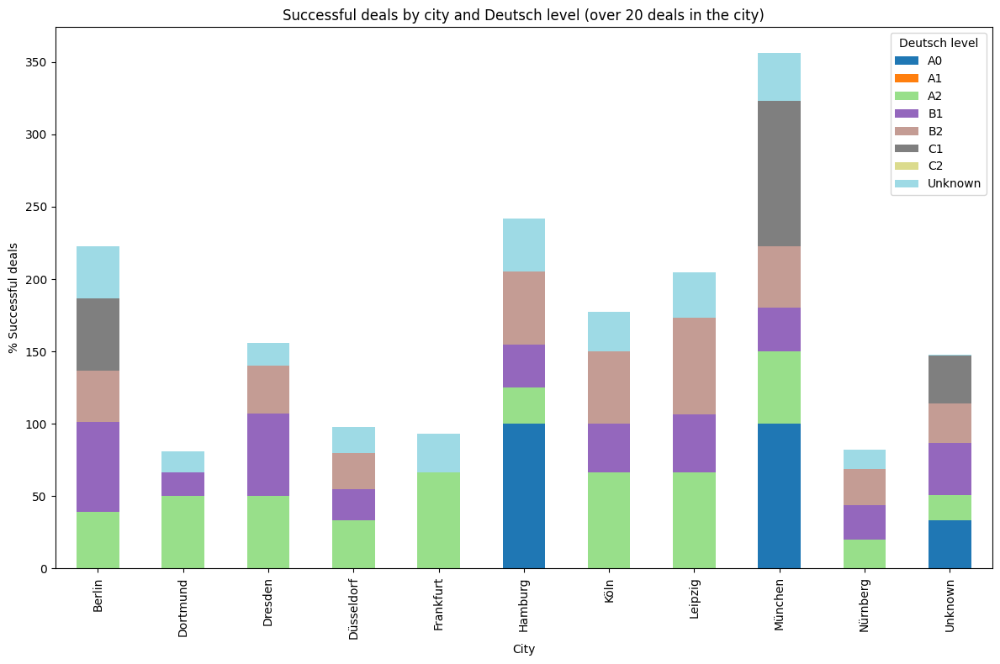

In [ ]:
# Counted the number of successful deals by city and language proficiency using grouping.
successful_deals_by_city_language = new_deals[deals['Stage'] == 'Payment Done'].groupby(['City', 'Level of Deutsch']).size()

# Calculating the total number of deals by cities and language proficiency levels.
total_deals_by_city_language = new_deals.groupby(['City', 'Level of Deutsch']).size()

# Filtering cities with more than 20 total deals to ensure compact visualization.
cities_with_more_than_20_deals = total_deals_by_city_language.groupby('City').sum()
cities_with_more_than_20_deals = cities_with_more_than_20_deals[cities_with_more_than_20_deals > 20].index

# Applying the deal quantity filter to the data.
successful_deals_filtered = successful_deals_by_city_language.loc[cities_with_more_than_20_deals]
total_deals_filtered = total_deals_by_city_language.loc[cities_with_more_than_20_deals]

# Calculating the success rate by filtered cities and language proficiency levels.
success_rate_filtered = (successful_deals_filtered / total_deals_filtered) * 100

# Transforming the data because the table was grouped, making it difficult to build the chart. After searching through many sources, a solution was found.
success_rate_pivot = success_rate_filtered.unstack().fillna(0)

# Creating a bar plot with stacking.
success_rate_pivot.plot(kind='bar', stacked=True, figsize=(12, 8), cmap='tab20')

plt.title('Successful deals by city and Deutsch level (over 20 deals in the city)')
plt.xlabel('City')
plt.ylabel('% Successful deals')
plt.legend(title='Deutsch level')
plt.tight_layout()
plt.show()

# In Berlin and Munich, a large number of people who contacted the school do not know German. Overall, most people have an intermediate level of German proficiency.

# **Product Analytics**

## **Calculating unit economics for each product.**

In [ ]:
# Filtering deals where the product is not "Unknown."
filtered_product = new_deals_payment_done[new_deals_payment_done['Product'] != 'Unknown']

# Grouping by product, calculating the total revenue ("Offer Total Amount").
income_RPU = filtered_product.groupby('Product')['Offer Total Amount'].sum()

# Counting the number of clients per product.
filtered_deals_product = new_deals[new_deals['Product'].isin(['Digital Marketing', 'Find yourself in IT', 'UX/UI Design', 'Web Developer'])]
total_clients_per_product = filtered_deals_product.groupby('Product')['Id'].nunique()

# Calculating LTV (lifetime value) for each product (revenue from one client per product).
lifetime_LTV_per_product = income_RPU / total_clients_per_product

# Calculating total marketing expenses for all products.
total_ad_spend = new_spend['Spend'].sum()

# Proportionally distributing the total marketing budget across each product based on its revenue.
ad_spend_per_product = (income_RPU / income_RPU.sum()) * total_ad_spend

# For the cost of acquiring one successful client, taking the average CAC (Customer Acquisition Cost) for each product—marketing costs per product are divided by the
# number of clients for that product.

acquisition_CAC_per_product = ad_spend_per_product / total_clients_per_product

# Calculating unit economics for each product.
unit_economic_per_product = lifetime_LTV_per_product - acquisition_CAC_per_product


unit_economic_per_product = pd.DataFrame({
    'Product': income_RPU.index,
    'Income': income_RPU.values,
    'Total Clients': total_clients_per_product.values,
    'LTV': lifetime_LTV_per_product.values,
    'CAC': acquisition_CAC_per_product,
    'Unit Economic': unit_economic_per_product.values
})


unit_economic_per_product

# Insights from Product Data:
# The most profitable product is "Digital Marketing."
# The average revenue per client by product shows that the most profitable products are "Digital Marketing" and "UX/UI Design."
# All products show positive performance, except for "Find Yourself in IT," but it is possible that after taking this course, the client may choose another course.
# Based on these data, it can be concluded that a user brings significantly more revenue than the company spends on attracting them. Even if the client does not return for
# other courses/services, there may be a referral effect.
# If the company continues to attract clients with similar metrics, it will earn the same revenue per client under the same conditions.

,Product,Income,Total Clients,LTV,CAC,Unit Economic
Product,,,,,,
Digital Marketing,Digital Marketing,3909800,1743,2243.144005,53.008800,2190.135205
Find yourself in IT,Find yourself in IT,1,4,0.250000,0.005908,0.244092
UX/UI Design,UX/UI Design,1834400,924,1985.281385,46.915126,1938.366260
Web Developer,Web Developer,583100,546,1067.948718,25.237203,1042.711515


## **Unit Economics Calculation per Client**


In [ ]:
# Total marketing expenses, total number of clients, and cost of acquiring one client
total_advertisment_spend = spend['Spend'].sum()

# Calculate the number of unique deal identifiers (representing total clients, assuming that one unique deal can only be made with one unique client). Here, I consider
# all acquired clients, even those who did not finalize a contract.

total_leads = deals['Id'].nunique()

# Cost of Acquiring One Client (CAC)
acquisition_CAC = total_advertisment_spend / total_leads

# Total Revenue: Sum of all income.
income = payment_done_deals['Offer Total Amount'].sum()

# Number of deals where clients have paid for services.
total_paid_clients = payment_done_deals['Id'].nunique()

# Lifetime Value (LTV): The average expected revenue from one client.
lifetime_LTV = income / total_paid_clients

# Marketing Efficiency (the ratio of LTV to CAC).
eff_marketing_spend = lifetime_LTV / acquisition_CAC

# Unit Economics (revenue per client minus acquisition costs).
unit_economic = lifetime_LTV - acquisition_CAC

conversion = total_paid_clients / total_leads * 100

unit_economic_per_client = pd.DataFrame({
    'Ad Spend': [total_advertisment_spend],
    'Total clients': [total_leads],
    'Cost aqusation': [acquisition_CAC],
    'income': [income],
    'Paid deals': [total_paid_clients],
    'LTV': [lifetime_LTV],
    'Marketing Spend Efficiency': [eff_marketing_spend],
    'Conversion': [conversion],
    'Unit Economic': [unit_economic]
})

unit_economic_per_client

# Cost of acquiring one client reflects our advertising expenses and shows how much we spend to acquire one user, even those who didn’t stay with us.
# Average revenue per paying client, assuming the client doesn’t return for repeat services.
# Marketing efficiency is quite high, which is good. It indicates a high revenue return for every dollar spent on marketing.
# The unit economics indicator is very high, suggesting that the business generates significant profit from each acquired client.

,Ad Spend,Total clients,Cost aqusation,income,Paid deals,LTV,Marketing Spend Efficiency,Conversion,Unit Economic
0,149523.45,8612,17.362221,6327301,808,7830.818069,451.026279,9.382257,7813.455848


In [ ]:
conversion = total_paid_clients / total_leads * 100
print(f'Conversion paid deal: {conversion}')

# The conversion rate for paying clients is also good according to the literature. As a reminder, in my calculations, I am using unique deal identifiers to represent
# each client.

Conversion paid deal: 9.382257315373897


## **Text Description:**

Identify business growth points based on unit economics

Based on the unit economics I have, including revenue from clients and marketing costs, the figures are very positive. Of course, they are not as good as they seem because we don’t know the cost of goods sold (COGS). But for now, they are still very high, which is why I don't see any growth points in marketing at the moment.

A possible growth point could be the introduction of a new course. This would require a deeper look at users who are interested in courses but didn’t find one that suits them, for example, a project management course or automated testing.

Another potential growth area could be offering courses in German/English. Due to the company's physical presence in Germany, this step will eventually need to happen. My assumption is based on the fact that there are many Russian-speaking clients right now due to the large migration of Russian speakers, and retraining for a new profession is currently a hot topic. However, demand may decline over time. Therefore, expanding the market by offering courses in other languages could be a good growth opportunity.

Based on conversion data, I currently see sales as the most optimal growth area. The conversion rate for paid deals is 9.38%, calculated by unique deal IDs.

Metric tree for the business:

Revenue:
    Number of deals
    Average check (how much one client spends on average)
    Margin for each product
Clients:
    Number of new clients
    Conversion rate
    Average number of clients per manager
    Average call duration
    Customer lifecycle (from creation in the database to payment)
Marketing:
    Marketing expenses
    CAC – cost of acquiring one client
    Number of clicks
    Market coverage through advertising

Hypotheses and metrics they impact, plus potential additional metrics:

1. Conducting a course marathon would allow potential users to familiarize themselves with the study area. This could reduce churn (after the start of training) by 20% and increase the conversion of marathon participants into full participants by 10%.

This hypothesis would affect the following metrics:

Revenue:
    Number of deals
    Average check
    Margin for each product/total revenue
Clients:
    Number of new clients
    Conversion rate of marathon participants into course participants/overall conversion
    Retention rate of marathon participants
Customer lifecycle (from creation in the database to payment)
    Marketing:
    Marketing expenses
    CAC – cost of acquiring one client
    Number of leads gathered during the marathon
    Marketing ROI on the marathon
    NPS (Net Promoter Score) after the marathon to assess satisfaction

2. Sending users their test results after completing a test on the website will help combat internal self-doubt and increase conversion into paying clients by 5%.

This hypothesis impacts the following metrics:

Revenue:
    Number of deals
    Average check
Clients:
    Number of new clients
    Conversion rate of those who received test results vs. those who didn’t
    Customer lifecycle
Marketing:
    Marketing expenses
    CAC – cost of acquiring one client
    Number of clicks
    Reach and number of tests taken

3. Expanding course localization (English, German) will attract a wider audience beyond Russian speakers. Analyzing potential markets and launching localized versions (English, German) could increase new client acquisition by 30%.

This hypothesis affects:

Revenue:
    Number of deals
    Average check
    Margin by product and localization
Clients:
    Number of new clients by localization
    Conversion rate by localization
    Average number of clients per manager
Marketing:
    Marketing expenses by localization
    CAC by localization
    Number of clicks/visits by localization
    Market reach by localization
    ROI by localization

4. Cooperating with government organizations (Jobcenter, BIZ (Berufsinformationszentrum)) and placing advertisements (posters, brochures) will increase interest and attract new potential clients by 15%.

This hypothesis affects:

Revenue:
    Number of deals
    Average check
Clients:
    Number of new clients through government organizations
    Conversion rate of attracted clients
    Customer lifecycle
Marketing:
    Marketing expenses (for advertising materials)
    CAC through government organizations
    Number of scans (e.g., via QR code)
    Market coverage through advertising

5. Revising the motivation of sales department employees by introducing a percentage of the deal as a bonus. This bonus program would increase deal closure efficiency by 40%.

The hypothesis impacts:

Revenue:
    Number of deals
    Average check
    Revenue per manager
Clients:
    Conversion per manager
    Average number of clients per manager
    Number of successful deals per manager
Marketing:
    CAC per client

6. Introducing additional incentives for sales department employees by asking clients to rate their interaction after a call. Aggregating this feedback monthly and rewarding top performers would improve call quality by 20%.

This hypothesis impacts:

Revenue:
    Number of successful deals
    Average check
Clients:
    Number of new clients
    Conversion on calls with managers
    Average call duration
    Customer lifecycle
Marketing:
    CAC
    Client satisfaction and quality ratings
    Average sales department performance

7. Expanding the courses offered by adding a new, popular course would increase client acquisition by 20% and allow for scaling.

This hypothesis impacts:

Revenue:
    Number of deals
    Average check
    Income from the new course
Clients:
    Number of new clients
    Conversion rate for the new course
    Customer lifecycle
Marketing:
    Marketing expenses for the new course
    CAC
    Market coverage of the new course
    NPS for the new course

8. Revising the sales department's staffing by analyzing performance and optimizing the team through upskilling or dismissing ineffective employees. This could reduce costs by 10%.

The hypothesis impacts:

Revenue:
    Number of deals
    Average check
    Revenue per manager
Clients:
    Conversion rate on calls
    Average number of clients per manager
Marketing:
    Efficiency of each manager before and after optimization
    Staff satisfaction post-optimization

Challenges faced mainly related to inconsistent data statuses/logic.

To improve data quality, the following could be implemented:

- Request country information, not just city names, to avoid confusion (cities with the same name in different countries).
- Implement a dropdown selection for cities or suggest city names after entering a few characters to standardize entries. Multiple language entries for city names add complexity.
- Implement a dropdown for selecting language proficiency levels, as future analysis may require it.
- Introduce additional verification in the CRM system when deals move from one status to another. There were inconsistencies between payment status and payment amounts.
- The responsible managers in the contacts and calls tables are different for the same client ID.

Description of the second hypothesis, as it meets test requirements best (duration of 2 weeks, possibility for A/B testing):

1. Hypothesis analysis:

Idea: After completing a test on the website, send users their answers, results, and personalized recommendations to help overcome internal self-doubt about their competency and ability to successfully complete the course. This will increase the conversion rate into paying clients by 5%.

Success metric: Increase in course payment conversion rate (defined as the percentage of users who paid for the course). Target conversion: +5%.

2. Testing groups:

Group A (control group): Users who take the test but do not receive results or recommendations.
Group B (test group): Users who receive test results and personalized recommendations.

3. Criteria for conducting the test:

Sample size:
To calculate the sample size, I use the Mindbox calculator. I enter known and desired parameters and get a result. The sample size should be 1,067 users, with 534 in each group.
Duration: 2 weeks, according to the requirements. I do not know the current traffic figures, but it seems to me that this is a realistic number for collecting the necessary traffic in 2 weeks. Since deciding to take courses and choose a school is an important decision and people do not make it impulsively, they generally think about the decision and this takes time. Therefore, we can calculate the conversion change immediately after conducting the test for users who participated in the testing and recalculate every two weeks for one to one and a half months.
Traffic: Both groups (A and B) should receive 534 users each, without resorting to additional conditions/sample selections (browser used, device, age) to avoid biasing the data in one direction or another.

4. Expected results:

If the hypothesis is correct, the conversion to course payment in the test group should be 5% higher compared to the control group (currently at 9.38%).

5. Data collection and analysis:

I plan to use analytics systems (e.g., Google Analytics) to track conversions for each group. I will also track other possible metrics that may affect the results:

Bounce rate.
Engagement.
Retention rate.

6. Decision-making:

Positive result: If the test group shows a significant improvement in conversion of the expected 5% or more, the hypothesis is confirmed, and the strategy can be scaled to all users.
Negative result: If there are no changes or they are insignificant (e.g., less than 5% or the conversion even decreases), the hypothesis is rejected, and the proposed strategy needs to be revised.

7. Actions after the test:

If the hypothesis is confirmed, the process of sending results and recommendations based on tests can be implemented for all users as a permanent process. In the case of a negative result, additional analysis can be conducted to seek improvements or test other hypotheses (e.g., changing the format or content of recommendations).

Example of segmentation and analysis:
Additionally, users can be segmented by device type (mobile/desktop), geographical location, and other parameters to identify which segments are more effective in terms of changes.